<a href="https://colab.research.google.com/github/Kumudumali98/Simmulated-Annealing-Group-5/blob/main/SA_Algo_Final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Initial Development


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm
import math as mt

size = [100, 1000, 10000, 100000]
colors = ['aqua', 'greenyellow', 'salmon', 'teal']

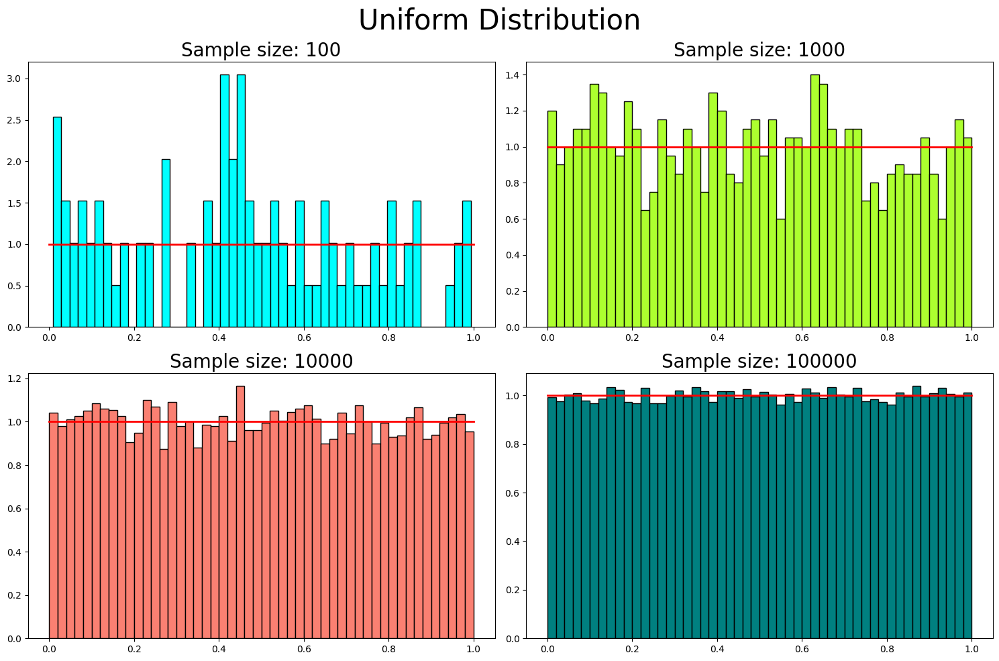

In [ ]:
# Uniform Distribution
fig_uniform, axs_uniform = plt.subplots(2, 2, figsize=(15, 10))

for i in range(len(size)):
    row = i // 2
    col = i % 2

    s_uniform = np.random.uniform(0, 1, size[i])
    axs_uniform[row, col].hist(s_uniform, color=colors[i], edgecolor='black', bins=50, density=True)

    # Plot the distribution curve
    x = np.linspace(0, 1, 100)
    y = np.full_like(x, 1)
    axs_uniform[row, col].plot(x, y, color='red', linestyle='-', linewidth=2)

    axs_uniform[row, col].set_title(f'Sample size: {size[i]}', fontsize=20)

plt.suptitle(f'Uniform Distribution', fontsize=30)
plt.tight_layout()
plt.show()

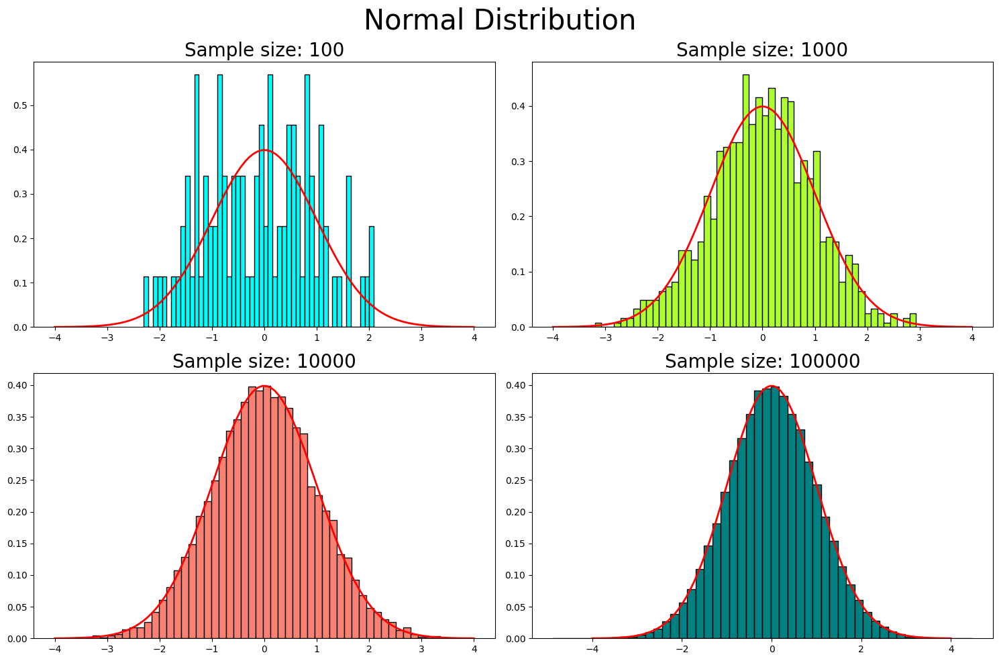

In [ ]:
# Normal Distribution
fig_normal, axs_normal = plt.subplots(2, 2, figsize=(15, 10))

for i in range(len(size)):
    row = i // 2
    col = i % 2

    s_normal = np.random.normal(0, 1, size[i])
    axs_normal[row, col].hist(s_normal, color=colors[i], edgecolor='black', bins=50, density=True)

    # Plot the distribution curve
    x = np.linspace(-4, 4, 100)
    y = norm.pdf(x, 0, 1)
    axs_normal[row, col].plot(x, y, color='red', linestyle='-', linewidth=2)

    axs_normal[row, col].set_title(f'Sample size: {size[i]}', fontsize=20)

plt.suptitle(f'Normal Distribution', fontsize=30)
plt.tight_layout()
plt.show()

In [ ]:
c = 100 # in Kelvin

def energy(x):
    return x**2


Accepted States:
[0.614613720642406, 0.3058122116314437, -0.8941295954366402, -0.840964782826634, -0.23703408366503798, -0.31218097472160466, 0.20606609474533166, -0.5927046886312493, -0.10217392464008546, -0.4363880189621281, -0.29622410124092924, -0.32859478729356284, -0.6698357530197245, 0.8035318400317748, 0.9829953289245412, 0.7800072112434706, 0.34172961424350157, -0.3227479161129616, 0.891690556863109, -0.1225391287066191, -0.7575510760223585, 0.16621247944689777, 0.29930111221213274, 0.3597722435914934, -0.546541825328468, 0.9364869580243587, -0.903676471570769, 0.6005645881684487, 0.8536325812428027, -0.8177407565813295, 0.8191401852428148, 0.20362812290370735, 0.3760013182326527, -0.45881563204815823, -0.982697802653685, -0.55697049992314, -0.24783374814184156, -0.5091689406925357, 0.9376712731620735, 0.6660309610066213, -0.6490338945766292, -0.2619854567203619, 0.8393746908069322, -0.6130628601829735, -0.5296427785494868, -0.5970666154605948, 0.5422186619938352, 0.311169538

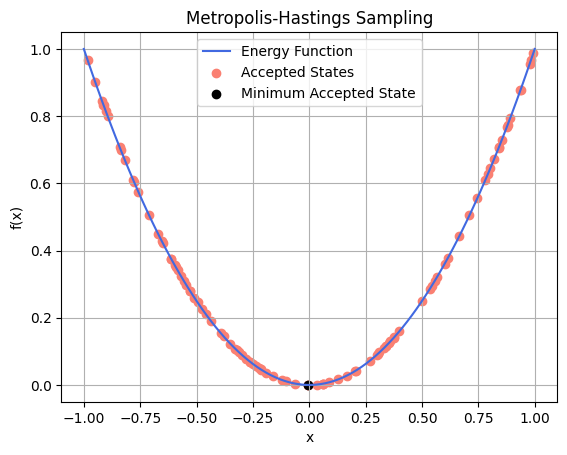

In [ ]:
# Generate x values
x_values = np.linspace(-1, 1, 100)  # 100 points between -1 and 1

# Calculate corresponding y values
y_values = energy(x_values)

# Plot the function
plt.plot(x_values, y_values, label = 'Energy Function', color = 'royalblue')

state_i = np.random.uniform(-1, 1)
accepted_states = [state_i]
iteration = [1]
f_x_values = [energy(state_i)]

for i in range(100):
    state_j = np.random.uniform(-1, 1)
    ene_diff = energy(state_j) - energy(state_i)

    if ene_diff <= 0:
        state_i = state_j
        accepted_states.append(state_i)
        #print(f'Accept state j = {energy(state_i)}')
        iteration.append(i)
        f_x_values.append(energy(state_i))
    else:
        if mt.exp(-ene_diff/c) > np.random.uniform(0, 1):
            state_i = state_j
            accepted_states.append(state_i)
            #print(f'Accept state j = {energy(state_i)} with the probability of {np.round(mt.exp(-ene_diff/c), 4)}')
            iteration.append(i)
            f_x_values.append(energy(state_i))
        else:
            #print(f'Reject state j')
            pass

# Plot accepted states
plt.scatter(accepted_states[:-1], [energy(state) for state in accepted_states[:-1]], color='salmon', label='Accepted States')

# Find the minimum value
min_abs_index = min(range(len(accepted_states)), key=lambda i: abs(accepted_states[i]))
plt.scatter(accepted_states[min_abs_index], energy(accepted_states[min_abs_index]), color='black', label='Minimum Accepted State')
#plt.scatter(accepted_states[-1], energy(accepted_states[-1]), color='green', label='Last Accepted State')

print('\nAccepted States:')
print(accepted_states)

# Output minimum value
print("\nMinimum value of the accepted states list:", accepted_states[min_abs_index])
#print("\nLast value of the accepted states list:", accepted_states[-1])

# Plot settings
plt.title('Metropolis-Hastings Sampling')
plt.xlabel('x')
plt.ylabel('f(x)')
plt.legend()
plt.grid(True)
plt.show()


Text(0.5, 1.0, 'x values over Iterations')

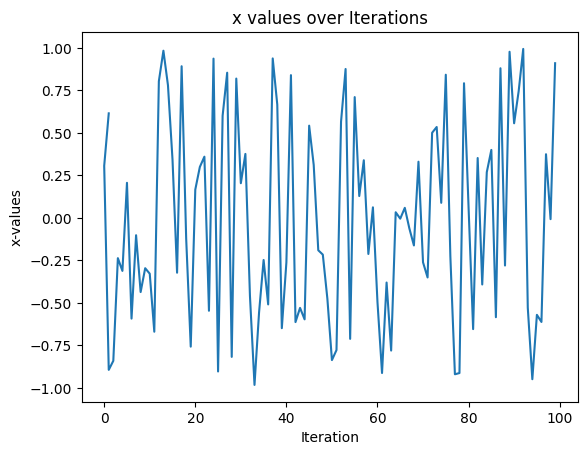

In [ ]:
plt.plot(iteration, accepted_states)
plt.xlabel("Iteration")
plt.ylabel("x-values")
plt.title('x values over Iterations')

Text(0.5, 1.0, 'f(x) values over Iterations')

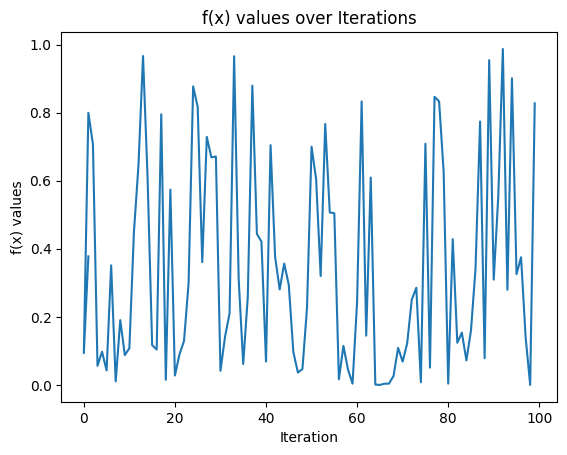

In [ ]:
plt.plot(iteration, f_x_values)
plt.xlabel("Iteration")
plt.ylabel("f(x) values")
plt.title('f(x) values over Iterations')

Mean of accepted states for T = 100K : -5.115636661398038e-05
Mean of accepted states for T = 10K : 0.000903797064168912
Mean of accepted states for T = 1K : -0.0010911297301249932
Mean of accepted states for T = 0.01K : -0.002860642544841767
Mean of accepted states for T = 0.001K : 0.0033098850453361006
Mean of accepted states for T = 0.0001K : 0.0059466067622654046


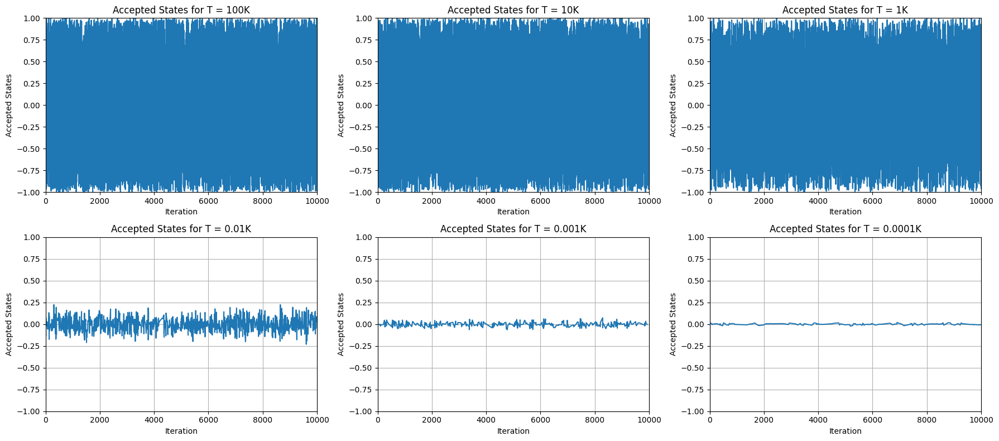

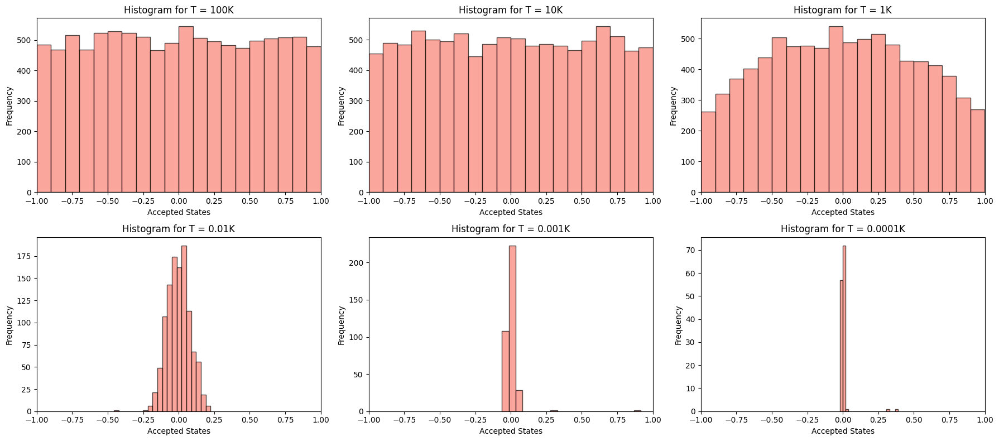

In [ ]:
import numpy as np
import math
import matplotlib.pyplot as plt

def main():
    # Define a list of temperature values (c)
    temperature_values = [100, 10, 1, 0.01, 0.001, 0.0001]

    # Create a figure for accepted states plots
    fig1, axs1 = plt.subplots(2, 3, figsize=(18, 8))

    # Create a figure for histograms and means
    fig2, axs2 = plt.subplots(2, 3, figsize=(18, 8))

    for idx, temp in enumerate(temperature_values):
        accepted_states, iteration = generate_accepted_states(temp)

        # Plot accepted states (iteration vs accepted states)
        row1 = idx // 3
        col1 = idx % 3
        axs1[row1, col1].plot(iteration, accepted_states)
        axs1[row1, col1].grid()
        axs1[row1, col1].set_xlabel('Iteration')
        axs1[row1, col1].set_ylabel('Accepted States')
        axs1[row1, col1].set_title(f'Accepted States for T = {temp}K')
        axs1[row1, col1].set_xlim(0, 10000)
        axs1[row1, col1].set_ylim(-1, 1)

        # Calculate and print the mean of accepted states
        mean_accepted_states = np.mean(accepted_states)
        print(f"Mean of accepted states for T = {temp}K : {mean_accepted_states}")

        # Plot histogram of accepted states
        row2 = idx // 3
        col2 = idx % 3
        axs2[row2, col2].hist(accepted_states, bins=20, alpha=0.7, edgecolor='black', color='salmon')
        axs2[row2, col2].set_xlabel('Accepted States')
        axs2[row2, col2].set_ylabel('Frequency')
        axs2[row2, col2].set_title(f'Histogram for T = {temp}K')
        axs2[row2, col2].set_xlim(-1, 1)

    # Adjust layout
    fig1.tight_layout()
    fig2.tight_layout()

    # Show the plots
    plt.show()

def generate_accepted_states(temperature_value):
    # Generate data for accepted states
    state_i = np.random.uniform(-1, 1)
    accepted_states = [state_i]
    iteration = [0]

    for i in range(1, 10000):
        state_j = np.random.uniform(-1, 1)
        energy_diff = state_j**2 - state_i**2

        if energy_diff <= 0:  # accept state_j
            accepted_states.append(state_j)
            iteration.append(i)
            state_i = state_j

        else:
            if math.exp(-energy_diff / temperature_value) > np.random.uniform(0, 1):  # accept with a probability
                accepted_states.append(state_j)
                iteration.append(i)
                state_i = state_j

    return accepted_states, iteration

main()


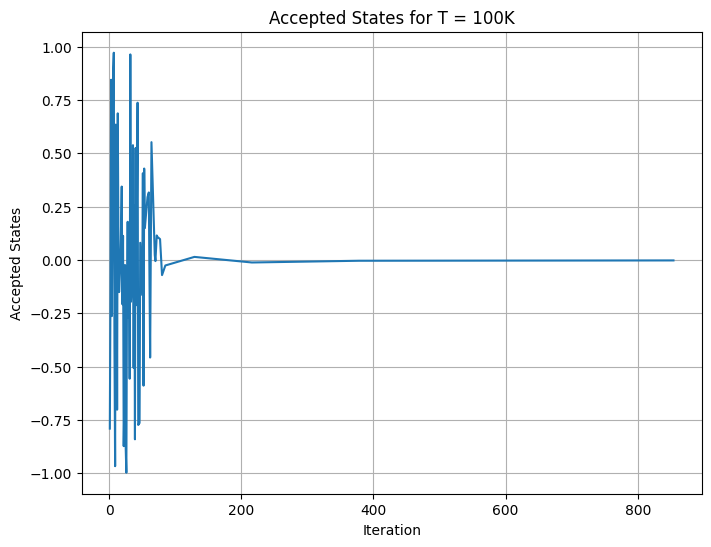

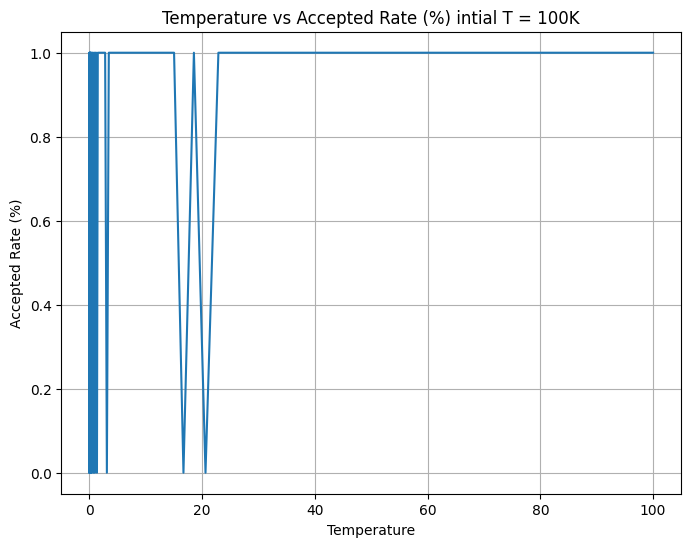

In [ ]:
import numpy as np
import math
import matplotlib.pyplot as plt

def main():
    # Define a list of temperature values (c)
    temp = 100
    k = 0.1

    accepted_states, iteration, accepted, temperature = generate_accepted_states(temp, k)


    # Create a new figure for each temperature value
    plt.figure(figsize=(8, 6))

    # Plot accepted states (iteration vs accepted states)
    plt.plot(iteration, accepted_states)
    plt.grid()
    plt.xlabel('Iteration')
    plt.ylabel('Accepted States')
    plt.title(f'Accepted States for T = {temp}K')
    #plt.xlim(0, 10000)
    #plt.ylim(-1, 1)

    # Show the plot
    plt.show()

    plt.figure(figsize=(8, 6))

    plt.plot(temperature, accepted)
    plt.grid()
    plt.xlabel('Temperature')
    plt.ylabel('Accepted Rate (%)')
    plt.title(f'Temperature vs Accepted Rate (%) intial T = {temp}K')

    #print(accepted, temperature)

def generate_accepted_states(temperature_value, k):
    # Generate data for accepted states
    state_i = np.random.uniform(-1, 1)
    accepted_states = []
    iteration = []
    accepted = []
    temperature = []

    for i in range(1, 1000):

        state_j = np.random.uniform(-1, 1)
        energy_diff = state_j**2 - state_i**2
        temperature.append(temperature_value)

        if energy_diff <= 0:  # accept state_j
            accepted_states.append(state_j)
            iteration.append(i)
            accepted.append(1)
            state_i = state_j


        else:
            if math.exp(-energy_diff / temperature_value) > np.random.uniform(0, 1):  # accept with a probability
                accepted_states.append(state_j)
                iteration.append(i)
                state_i = state_j
                accepted.append(1)

            else:
                accepted.append(0)
        temperature_value = temperature_value - temperature_value*k

    return accepted_states, iteration, accepted, temperature


main()


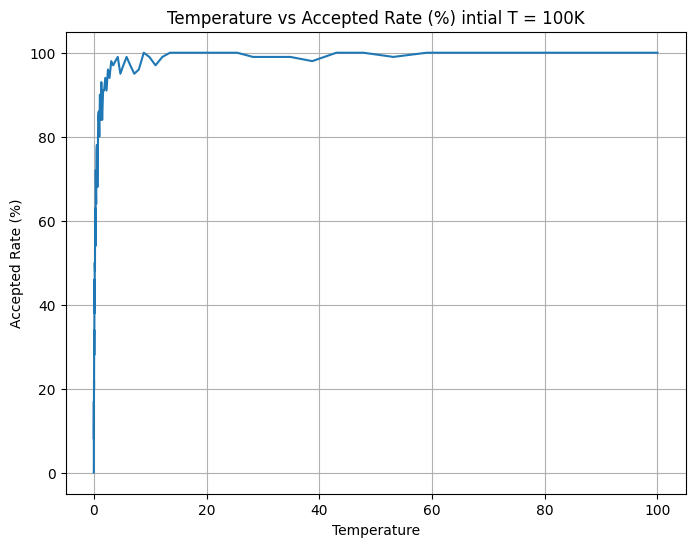

In [ ]:
import numpy as np
import math
import matplotlib.pyplot as plt

def main():
    # Define parameters
    temp = 100
    k = 0.1
    num_iterations = 100

    # Initialize lists to store results
    all_accepted_states = []
    all_iteration = []
    all_accepted = []
    all_temperature = []

    max_length = 0  # Variable to track the maximum length of the lists

    for _ in range(num_iterations):
        accepted_states, iteration, accepted, temperature = generate_accepted_states(temp, k)
        # Append the lists to the main lists
        all_accepted_states.append(accepted_states)
        all_iteration.append(iteration)
        all_accepted.append(accepted)
        all_temperature.append(temperature)
        # Update the maximum length
        max_length = max(max_length, len(accepted_states), len(iteration), len(accepted), len(temperature))

    # Pad the lists with zeros to make them have the same length
    all_accepted_states = pad_lists(all_accepted_states, max_length)
    all_iteration = pad_lists(all_iteration, max_length)
    all_accepted = pad_lists(all_accepted, max_length)
    all_temperature = pad_lists(all_temperature, max_length)

    # Convert lists to numpy arrays
    all_accepted_states = np.array(all_accepted_states)
    all_iteration = np.array(all_iteration)
    all_accepted = np.array(all_accepted)
    all_temperature = np.array(all_temperature)

    # Sum the values in each index of the all_accepted array
    sum_accepted = np.sum(all_accepted, axis=0)
    acceptance_rate = (sum_accepted/num_iterations)*100
    #print("Sum of values in each index of the all_accepted array:", acceptance_rate)

    plt.figure(figsize=(8, 6))

    plt.plot(all_temperature[0], acceptance_rate)
    plt.grid()
    plt.xlabel('Temperature')
    plt.ylabel('Accepted Rate (%)')
    plt.title(f'Temperature vs Accepted Rate (%) intial T = {temp}K')

    plt.show()

def generate_accepted_states(temperature_value, k):
    # Generate data for accepted states
    state_i = np.random.uniform(-1, 1)
    accepted_states = []
    iteration = []
    accepted = []
    temperature = []

    for i in range(1, 1000):
        state_j = np.random.uniform(-1, 1)
        energy_diff = state_j**2 - state_i**2
        temperature.append(temperature_value)

        if energy_diff <= 0:  # accept state_j
            accepted_states.append(state_j)
            iteration.append(i)
            accepted.append(1)
            state_i = state_j

        else:
            if math.exp(-energy_diff / temperature_value) > np.random.uniform(0, 1):  # accept with a probability
                accepted_states.append(state_j)
                iteration.append(i)
                state_i = state_j
                accepted.append(1)
            else:
                accepted.append(0)
        temperature_value = temperature_value - temperature_value*k

    return accepted_states, iteration, accepted, temperature

def pad_lists(lists, length):
    # Pad lists with zeros to make them have the same length
    padded_lists = [lst + [0] * (length - len(lst)) for lst in lists]
    return padded_lists

main()


# Plots and Libraries

In [ ]:
import numpy as np
import math
import matplotlib.pyplot as plt
import random
import seaborn as sns
from mpl_toolkits.mplot3d import Axes3D
from scipy.optimize import minimize
import statistics as st
import datetime

# Set global font properties and grid settings
plt.rcParams.update({
    'font.size': 11,  # Default font size for labels
    'axes.grid': True,  # Add grid to all plots
    'font.family': 'serif',
    'font.serif': ['LiberationSerif', 'DejaVu Serif'],
    'axes.titlesize': 14,  # Font size for titles
    'axes.labelsize': 12,  # Font size for axis labels
})

In [ ]:
def maxwell_boltzmann(v, m, t):
    '''
        This is a function that computes the Maxwell-Boltzmann Distribution for:
            - `v`: np.array of velocities
            - `m`: mass of the gas of interest
            - `t`: temperature of the system of interest
    '''
    r = 8.31446261815324 # J / (mol * K)
    return(4.*np.pi * ((m / (2 * np.pi * r * t))**1.5) * (v**2) * np.exp(- (m * v**2)/(2 * r * t)))

1. X chain
2. Fx Chain
3. Temperature vs Iteration
4. Histogram for specific temp - f(x) / inner loop
5. X chhain for specific temp / inner loop
6. plot_hist_fx_specific_inner
7. plot_hist_fx_specific_inner_smooth
8. boaltsmann distriibution
9. scatter_3d_plot
10. Surface plot
11. Lk vs iteration
12. Lk vs Temperature
13. Acceptace Rate vs Temperature
14. Runtime vs iteraration

In [ ]:
def plot_accepted_states(iteration, accepted_states_x1, accepted_states_x2, temp, no_of_iterations):
    plt.figure(figsize=(20, 6))
    plt.plot(iteration, accepted_states_x1, marker='o', label='x1')
    plt.plot(iteration, accepted_states_x2, marker='o', label='x2')
    plt.xlim(0, no_of_iterations)
    plt.legend()
    plt.xlabel('Iteration')
    plt.ylabel('x values')
    plt.title(f'Iterations vs x with initial T = {temp}K')
    plt.show()

def plot_fx_values(iteration, f_x_values, temp, no_of_iterations):
    plt.figure(figsize=(20, 10))
    plt.plot(iteration, f_x_values, marker='o')
    plt.xlim(0, no_of_iterations)
    plt.xlabel('Iteration')
    plt.ylabel('f(x) values')
    plt.title(f'Iterations vs f(x) values with initial T = {temp}K')
    plt.show()

def plot_temperature(temperature, no_of_iterations):
    plt.figure(figsize=(20, 6))
    plt.plot(temperature, marker='o')
    plt.xlabel('Iteration')
    plt.ylabel('Temperature (K)')
    plt.title('Iterations vs Temperature')
    plt.show()


def plot_hist_x_specific_inner(inner_temp, x_values, init_temp, k, i):

    target_temp = init_temp*math.exp(-k*i)

    # Filter f(x) values for the specified temperature
    filtered_x_values = [fx for temp, fx in zip(inner_temp, x_values) if temp == target_temp]

    # Plot the histogram for the filtered f(x) values
    plt.figure()
    plt.hist(filtered_x_values, bins=30, alpha=0.75)
    plt.xlabel('x values')
    plt.ylabel('Frequency')
    plt.title(f'Histogram of x values at T = {target_temp:.2f}K')
    plt.show()

def plot_x_chain_specific_inner(iteration, inner_temp, x_values, init_temp, k, i):

    target_temp = init_temp*math.exp(-k*i)

    # Filter f(x) values for the specified temperature
    filtered_x_values = [fx for temp, fx in zip(inner_temp, x_values) if temp == target_temp]

    # Plot the histogram for the filtered f(x) values
    plt.figure()
    plt.plot(filtered_x_values, marker='o')
    plt.ylabel('x values')
    plt.xlabel('Iteration')
    plt.title(f'Iterations vs x values at T = {target_temp:.2f}K')
    plt.show()

def plot_hist_fx_specific_inner(inner_temp, f_x_values, init_temp, k, i):

    target_temp = init_temp*math.exp(-k*i)

    # Filter f(x) values for the specified temperature
    filtered_fx_values = [fx for temp, fx in zip(inner_temp, f_x_values) if temp == target_temp]

    # Plot the histogram for the filtered f(x) values
    plt.figure()
    plt.hist(filtered_fx_values, bins=30, alpha=0.75, edgecolor='black')
    plt.xlabel('f(x) values')
    plt.ylabel('Frequency')
    plt.title(f'Histogram of f(x) values at T = {target_temp:.2f}K')
    plt.show()

#plot the histogram with smooth curve
def plot_hist_fx_specific_inner_smooth(inner_temp, f_x_values, init_temp, k, i):
    target_temp = init_temp * math.exp(-k * i)

    # Filter f(x) values for the specified temperature
    filtered_fx_values = [fx for temp, fx in zip(inner_temp, f_x_values) if temp == target_temp]

    # Plot the histogram with a KDE curve for the filtered f(x) values
    plt.figure()
    sns.histplot(filtered_fx_values, bins=30, kde=True, alpha=0.75)
    plt.xlabel('f(x) values')
    plt.ylabel('Frequency')
    plt.title(f'Histogram of f(x) values at T = {target_temp:.2f}K')
    plt.show()

def plot_boltzmann_distribution(f_x_values, temp, k, i):
    velocities = np.linspace(0, 500, 1000)
    #fx = sorted(f_x_values)
    #velocities = np.linspace(fx[0], fx[-1])
    target_temp = temp*math.exp(-k*i)

    plt.figure()
    plt.plot(velocities, maxwell_boltzmann(velocities, 32.00/1000, target_temp))
    plt.xlabel('speed')
    plt.ylabel('Probability')
    plt.title(f'Maxwell-Boltzmann Distribution of $O_2$ at T = {target_temp:.2f}K')
    plt.show()


def plot_3d_scatter_fx(x1_values, x2_values, f_x_values, iterations):
    fig = plt.figure(figsize=(20, 10))
    ax = fig.add_subplot(111, projection='3d')

    sc = ax.scatter(x1_values, x2_values, f_x_values, c=iterations, cmap='plasma')
    plt.colorbar(sc, label='Iteration')

    ax.set_xlabel('x1')
    ax.set_ylabel('x2')
    ax.set_zlabel('f(x)')
    plt.title('3D Scatter Plot of f(x) Values Colored by Iteration')

    # Rotate the plot
    ax.view_init(elev=180, azim=45)  #
    plt.show()

def surface_plot(f):
    # Initial guess for the minimization algorithm
    initial_guess = [0, 0]

    # Use scipy.optimize.minimize to find the minimum point
    result = minimize(f, initial_guess, method='BFGS')

    # Extract the minimum point and its function value
    min_point = result.x
    min_value = result.fun

    # Print the minimum point and function value
    print(f"Minimum point: {min_point}")
    print(f"Function value at minimum point: {min_value}")

    # Create a mesh grid for x0 and x1
    x0 = np.linspace(-10, 10, 100)
    x1 = np.linspace(-10, 10, 100)
    x0, x1 = np.meshgrid(x0, x1)

    # Compute the function values for each point in the mesh grid
    z = np.array([[f([x0[i, j], x1[i, j]]) for j in range(x1.shape[1])] for i in range(x0.shape[0])])

    # Plot the surface
    fig = plt.figure(figsize=(10,10))
    ax = fig.add_subplot(111, projection='3d')
    ax.plot_surface(x0, x1, z, cmap='viridis')

    # Highlight the minimum point on the surface plot
    ax.scatter(min_point[0], min_point[1], min_value, color='red', s=100, label=f'Minimum Point: x1={min_point[0]:.2f}, x2={min_point[1]:.2f}')
    ax.legend()

    # Rotate the plot
    ax.view_init(elev=180, azim=45)  # Change these values as needed

    ax.set_xlabel('x1')
    ax.set_ylabel('x2')
    ax.set_zlabel('f(x)')
    ax.set_title('Surface Plot of the Function')

    plt.show()

def plot_temperature_vs_Lk(temperature, Lk_values):
    # Interpolate Lk_values to match the length of temperature
    interpolated_Lk_values = np.interp(np.linspace(0, len(Lk_values)-1, len(temperature)), np.arange(len(Lk_values)), Lk_values)
    plt.plot(temperature, interpolated_Lk_values)
    plt.xlabel('Temperature (K)')
    plt.ylabel('Lk Values')
    plt.title('Temperature vs Lk Values')
    plt.show()

def plot_iteration_vs_Lk(iteration, Lk_values):
    # Interpolate Lk_values to match the length of iteration
    interpolated_Lk_values = np.interp(np.linspace(0, len(Lk_values)-1, len(iteration)), np.arange(len(Lk_values)), Lk_values)
    plt.plot(iteration, interpolated_Lk_values)
    plt.xlabel('Iteration')
    plt.ylabel('Lk Values')
    plt.title('Iteration vs Lk Values')
    plt.show()

def plot_acceptance_rate_vs_temperature(acceptance_rates, temperature):
    plt.figure()
    plt.plot(temperature, acceptance_rates)
    plt.xlabel('Temperature (K)')
    plt.ylabel('Acceptance Rate')
    plt.title('Acceptance Rate vs Temperature')
    plt.show()

def plot_run_time_vs_iteration(run_times, no_of_iterations):
    plt.figure()
    plt.plot(range(no_of_iterations), run_times)   #, marker='o'
    plt.xlabel('Iteration')
    plt.ylabel('Run Time (seconds)')
    plt.title('Run Time vs Iteration')
    plt.show()


def plot_acceptance_rate_vs_Lk(acceptance_rates, Lk_values):
    iterations = range(1, 301)
    plt.figure(figsize=(20, 6))
    scatter = plt.scatter(acceptance_rates, Lk_values, c=iterations, cmap='viridis', marker='o')
    plt.xlabel('Lk Values')
    plt.ylabel('Acceptance Rate')
    plt.title('Acceptance Rate vs Lk Values')
    plt.grid(True)
    plt.show()



# Metropolic Criterian

# Simulated Annealing Algo Code for 4 Cases
  1. SA - Exponenetial - Dynamic Lk (SA_Exp_Lk_dynamic)
  2. SA - Exponenetial - Constant Lk (SA_Exp_Lk_989)
  3. SA - Linear - Dynamin Lk (SA_Linear_Lk_dynamic)
  4. SA - Linear - Constant Lk (SA_Linear_Lk_989)

In [ ]:
def SA_Exp_Lk_dynamic(f, temperature_value, no_of_iterations, a, b):
    L0 = 50
    k = 0.05
    init_temp = temperature_value
    state_i = np.random.uniform(a, b, 2)
    accepted_states_x1 = []
    accepted_states_x2 = []
    iteration = []
    temperature = []
    f_x_values = []
    inner_temp = []
    acceptance_rates = []
    run_times = []
    Lk_values = []
    Lk = L0  # Initialize Markov chain length
    best_fx = []

    for i in range(no_of_iterations):
        accepted_transitions = 0
        start_time = datetime.datetime.now()
        for p in range(Lk):  # Perform Lk transitions at each temperature level
            state_j = np.random.uniform(a, b, 2)
            energy_diff = f(state_j) - f(state_i)

            if energy_diff <= 0 or math.exp(-energy_diff / temperature_value) > np.random.uniform(0, 1):
              # Accept state_j
                state_i = state_j
                accepted_transitions += 1
                accepted_states_x1.append(state_i[0])
                accepted_states_x2.append(state_i[1])
                f_x_values.append(f(state_i))
                iteration.append(i)
                inner_temp.append(temperature_value)

        end_time = datetime.datetime.now()
        run_times.append((end_time - start_time).total_seconds())
        acceptance_rates.append(accepted_transitions / Lk)
        best_fx.append(f_x_values[-1])

        # Record the temperature and
        temperature.append(temperature_value)
        Lk_values.append(Lk)

        # Update temperature and Markov chain length for next iteration
        temperature_value = init_temp*math.exp(-k*i)                    #exponential Cooling Schedule

        #Update Lk value
        Lk = L0 * (1.01 ** np.round(math.log(temperature_value/init_temp)/-k))
        Lk = int(Lk)  # Convert to integer if necessary


    return accepted_states_x1, accepted_states_x2, iteration, temperature, f_x_values, inner_temp, Lk_values, acceptance_rates, run_times, best_fx


In [ ]:
def SA_Exp_Lk_989(f, temperature_value, no_of_iterations, a, b):
    k = 0.05
    init_temp = temperature_value
    state_i = np.random.uniform(a, b, 2)
    accepted_states_x1 = []
    accepted_states_x2 = []
    iteration = []
    temperature = []
    f_x_values = []
    inner_temp = []
    Lk_values = []
    acceptance_rates = []
    run_times = []
    Lk = 989  # Initialize Markov chain length

    for i in range(no_of_iterations):
        accepted_transitions = 0
        start_time = datetime.datetime.now()
        for p in range(Lk):  # Perform Lk transitions at each temperature level
            state_j = np.random.uniform(a, b, 2)
            energy_diff = f(state_j) - f(state_i)

            if energy_diff <= 0 or math.exp(-energy_diff / temperature_value) > np.random.uniform(0, 1):
              # Accept state_j
                state_i = state_j
                accepted_transitions += 1
                accepted_states_x1.append(state_i[0])
                accepted_states_x2.append(state_i[1])
                f_x_values.append(f(state_i))
                iteration.append(i)
                inner_temp.append(temperature_value)

        end_time = datetime.datetime.now()
        run_times.append((end_time - start_time).total_seconds())
        acceptance_rates.append(accepted_transitions / Lk)

        # Record the temperature and
        temperature.append(temperature_value)
        Lk_values.append(Lk)

        # Update temperature and Markov chain length for next iteration
        temperature_value = init_temp*math.exp(-k*i)                    #exponential Cooling Schedule

    return accepted_states_x1, accepted_states_x2, iteration, temperature, f_x_values, inner_temp, Lk_values, acceptance_rates, run_times


In [ ]:
def SA_Linear_Lk_dynamic(f, temperature_value, no_of_iterations, a, b):
    L0 = 50
    k = 0.5
    init_temp = temperature_value
    state_i = np.random.uniform(a, b, 2)
    accepted_states_x1 = []
    accepted_states_x2 = []
    iteration = []
    temperature = []
    f_x_values = []
    inner_temp = []
    acceptance_rates = []
    run_times = []
    Lk_values = []
    Lk = L0  # Initialize Markov chain length
    best_fx = []

    for i in range(no_of_iterations):
        accepted_transitions = 0
        start_time = datetime.datetime.now()
        for p in range(Lk):  # Perform Lk transitions at each temperature level
            state_j = np.random.uniform(a, b, 2)
            energy_diff = f(state_j) - f(state_i)

            if energy_diff <= 0 or math.exp(-energy_diff / temperature_value) > np.random.uniform(0, 1):
              # Accept state_j
                state_i = state_j
                accepted_transitions += 1
                accepted_states_x1.append(state_i[0])
                accepted_states_x2.append(state_i[1])
                f_x_values.append(f(state_i))
                iteration.append(i)
                inner_temp.append(temperature_value)

        end_time = datetime.datetime.now()
        run_times.append((end_time - start_time).total_seconds())
        acceptance_rates.append(accepted_transitions / Lk)
        best_fx.append(f_x_values[-1])

        # Record the temperature and
        temperature.append(temperature_value)
        Lk_values.append(Lk)

        # Update temperature and Markov chain length for next iteration
        temperature_value = temperature_value * k   #Linear Cooling Schedule

        #Update Lk value
        Lk = L0 * (1.01 ** np.round(math.log(temperature_value/init_temp)/-k))
        Lk = int(Lk)  # Convert to integer if necessary


    return accepted_states_x1, accepted_states_x2, iteration, temperature, f_x_values, inner_temp, Lk_values, acceptance_rates, run_times, best_fx


In [ ]:
def SA_Linear_Lk_989(f, temperature_value, no_of_iterations, a, b):
    k = 0.5
    init_temp = temperature_value
    state_i = np.random.uniform(a, b, 2)
    accepted_states_x1 = []
    accepted_states_x2 = []
    iteration = []
    temperature = []
    f_x_values = []
    inner_temp = []
    acceptance_rates = []
    run_times = []
    Lk_values = []
    Lk = 989  # Initialize Markov chain length

    for i in range(no_of_iterations):
        accepted_transitions = 0
        start_time = datetime.datetime.now()
        for p in range(Lk):  # Perform Lk transitions at each temperature level
            state_j = np.random.uniform(a, b, 2)
            energy_diff = f(state_j) - f(state_i)

            if energy_diff <= 0 or math.exp(-energy_diff / temperature_value) > np.random.uniform(0, 1):
              # Accept state_j
                state_i = state_j
                accepted_transitions += 1
                accepted_states_x1.append(state_i[0])
                accepted_states_x2.append(state_i[1])
                f_x_values.append(f(state_i))
                iteration.append(i)
                inner_temp.append(temperature_value)

        end_time = datetime.datetime.now()
        run_times.append((end_time - start_time).total_seconds())
        acceptance_rates.append(accepted_transitions / Lk)

        # Record the temperature and
        temperature.append(temperature_value)
        Lk_values.append(Lk)

        # Update temperature and Markov chain length for next iteration
        temperature_value = temperature_value * k    #Linear Cooling Schedule

    return accepted_states_x1, accepted_states_x2, iteration, temperature, f_x_values, inner_temp, Lk_values, acceptance_rates, run_times


# Main

In [ ]:
def main(f, a, b, optimal, SAfunc):
    # Define initial temperature, cooling rate, number of iterations, and initial Markov chain length
    temp = 5000
    k = 0.05
    no_of_iterations = 300

    accepted_states_x1, accepted_states_x2, iteration, temperature, f_x_values, inner_temp, Lk_values, acceptance_rates, run_times, best_fx = SAfunc(f, temp, no_of_iterations, a, b)

    plot_acceptance_rate_vs_Lk(acceptance_rates, Lk_values)

    plot_accepted_states(iteration, accepted_states_x1, accepted_states_x2, temp, no_of_iterations)
    plot_fx_values(iteration, f_x_values, temp, no_of_iterations)
    plot_temperature(temperature, no_of_iterations)

    print(f'Optimal Solution = {f_x_values[-1]}')
    print(f'Minimum points = {accepted_states_x1[-1], accepted_states_x2[-1]}')
    print(f'Error = {(f_x_values[-1]-optimal)**2}')

    #histograms for i th outer iteration
    i = random.randint(0, no_of_iterations)
    #i = 208

    print(f'Iteration that we gonna take specific temprature = {i}')
    plot_hist_fx_specific_inner(inner_temp, f_x_values,  temp, k, i)
    plot_hist_fx_specific_inner_smooth(inner_temp, f_x_values, temp, k, i)

    # Plot Boltzmann distribution
    plot_boltzmann_distribution(f_x_values, temp, k, i)

    plot_hist_x_specific_inner(inner_temp, accepted_states_x1, temp, k, i)
    plot_hist_x_specific_inner(inner_temp, accepted_states_x2, temp, k, i)

    #plot_x_chain_specific_inner(iteration, inner_temp, accepted_states_x1, temp, k, i)
    #plot_x_chain_specific_inner(iteration, inner_temp, accepted_states_x2, temp, k, i)


    plot_3d_scatter_fx(accepted_states_x1, accepted_states_x2, f_x_values, iteration)
    surface_plot(f)

    plot_temperature_vs_Lk(temperature, Lk_values)
    plot_iteration_vs_Lk(iteration, Lk_values)

    plot_acceptance_rate_vs_temperature(acceptance_rates, temperature)

    plot_run_time_vs_iteration(run_times, no_of_iterations)

    print(iteration)


# f(x1,x2)=3x12+5x22+2

In [ ]:
def dual_var_f(x):
    x1, x2 = x
    return 3 * x1**2 + 5 * x2**2 + 2

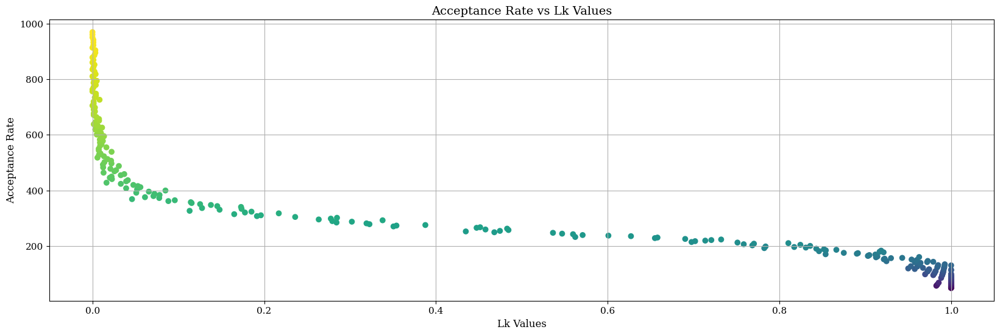

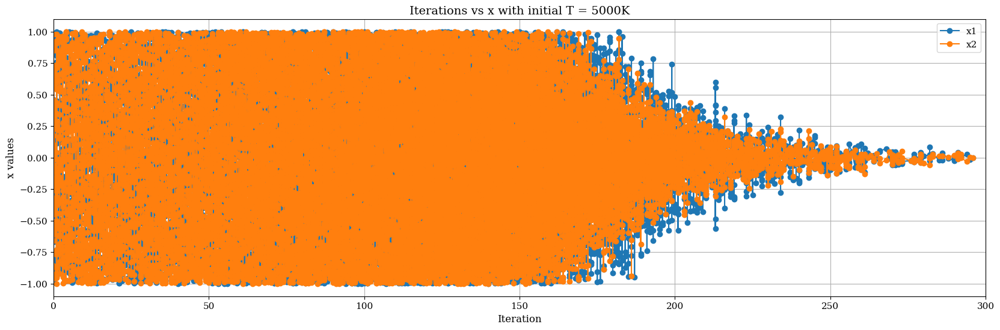

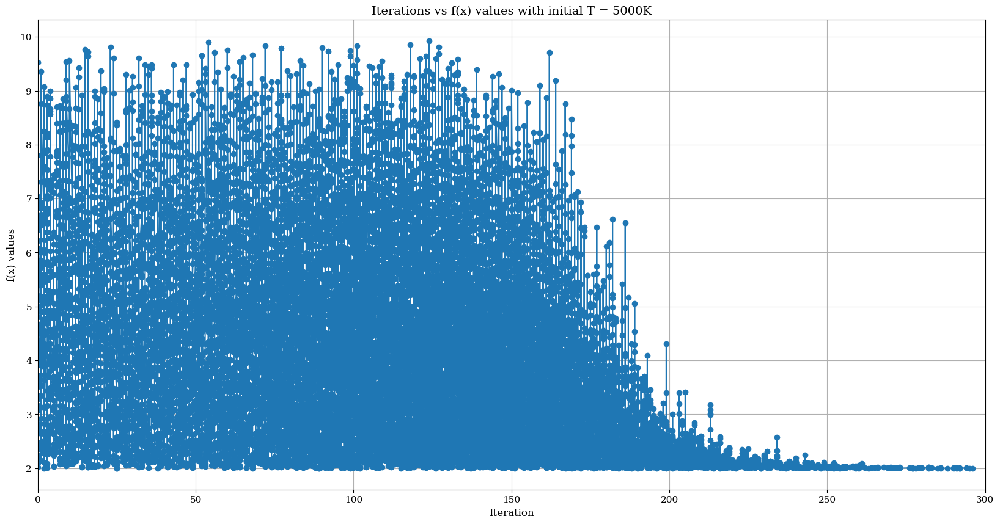

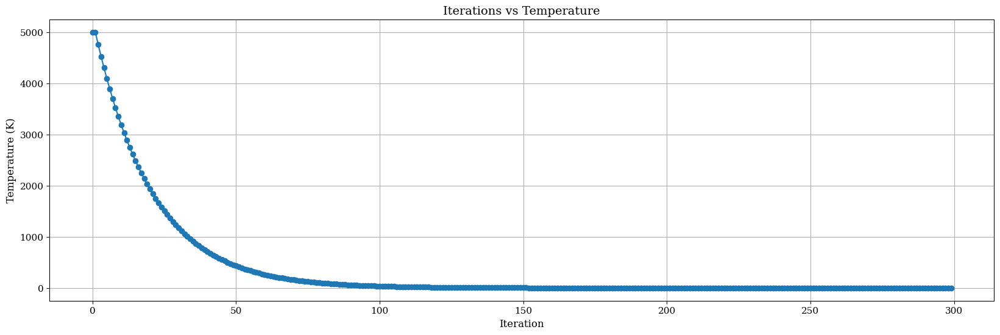

Optimal Solution = 2.000036467446111
Minimum points = (-0.0034703260788595536, 0.0002599833956677955)
Error = 1.3298746258481098e-09
Iteration that we gonna take specific temprature = 226


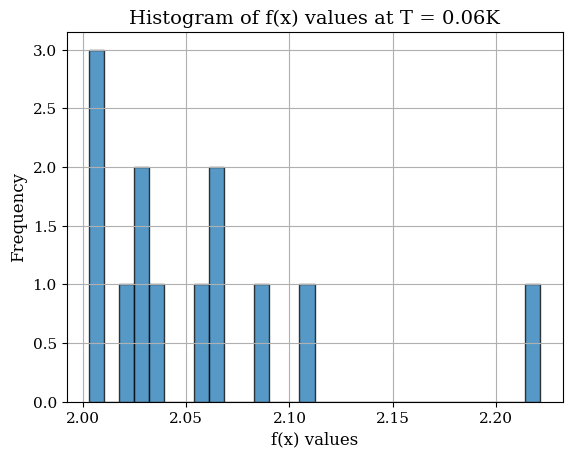

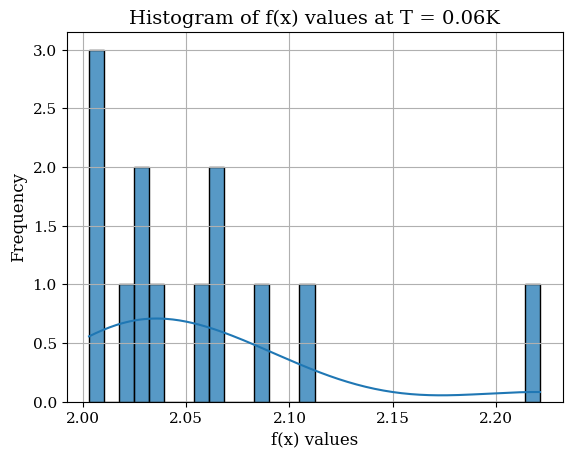

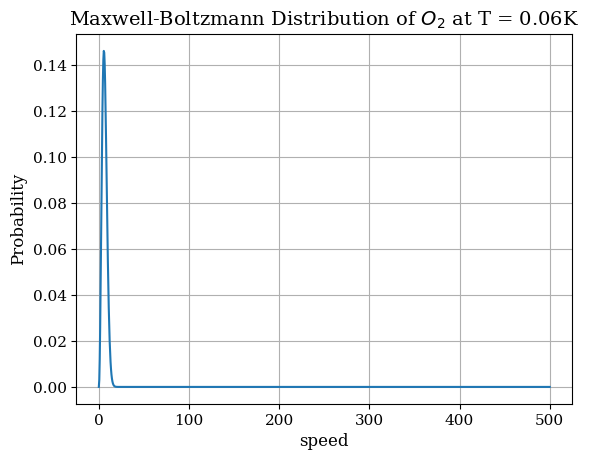

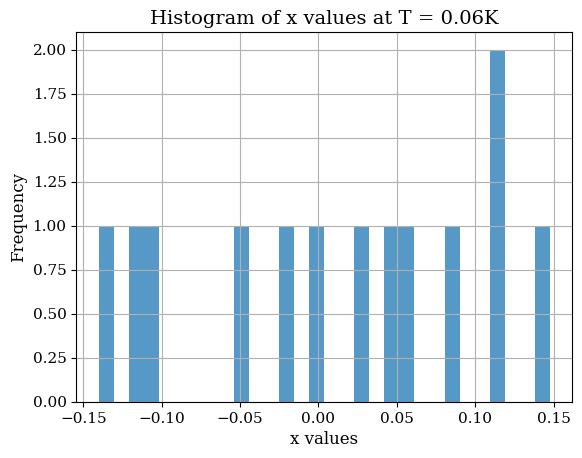

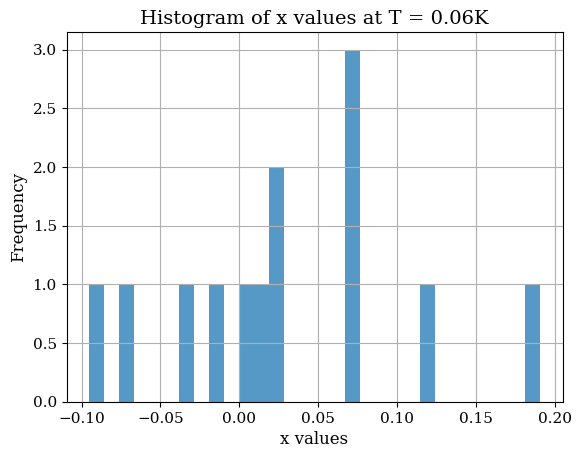

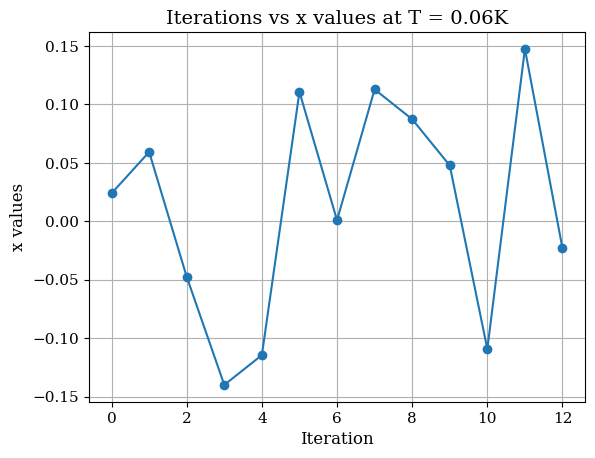

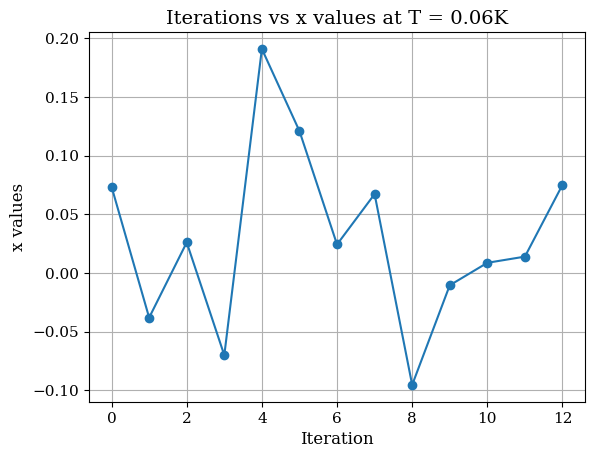

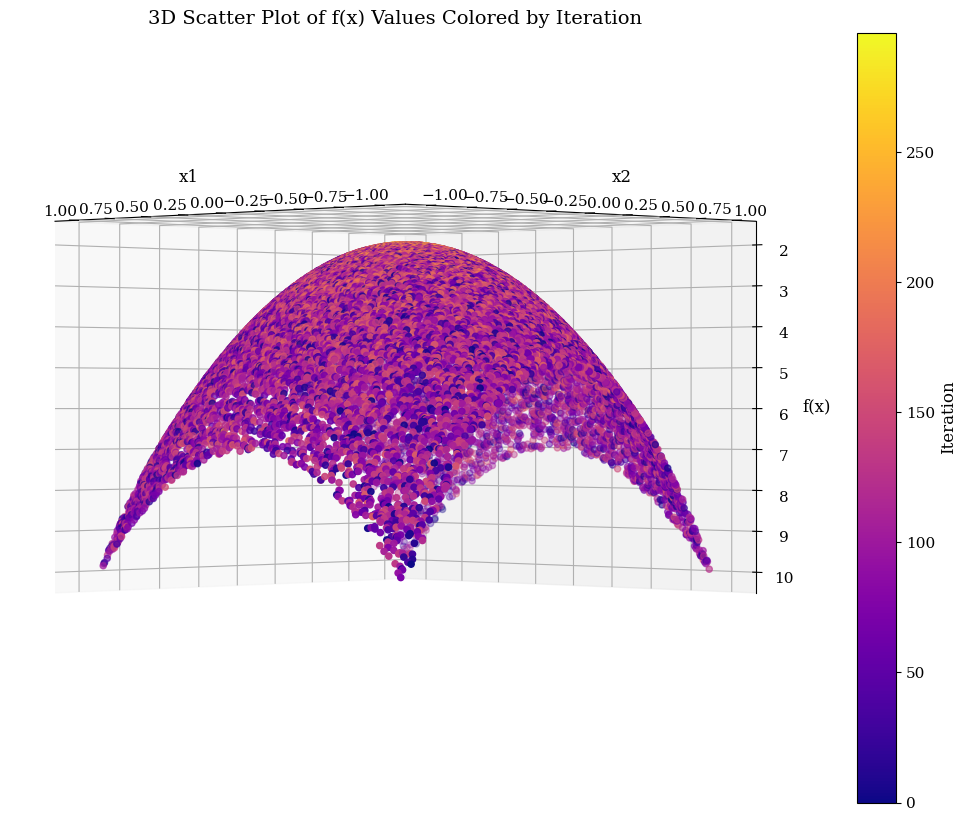

Minimum point: [0. 0.]
Function value at minimum point: 2.0


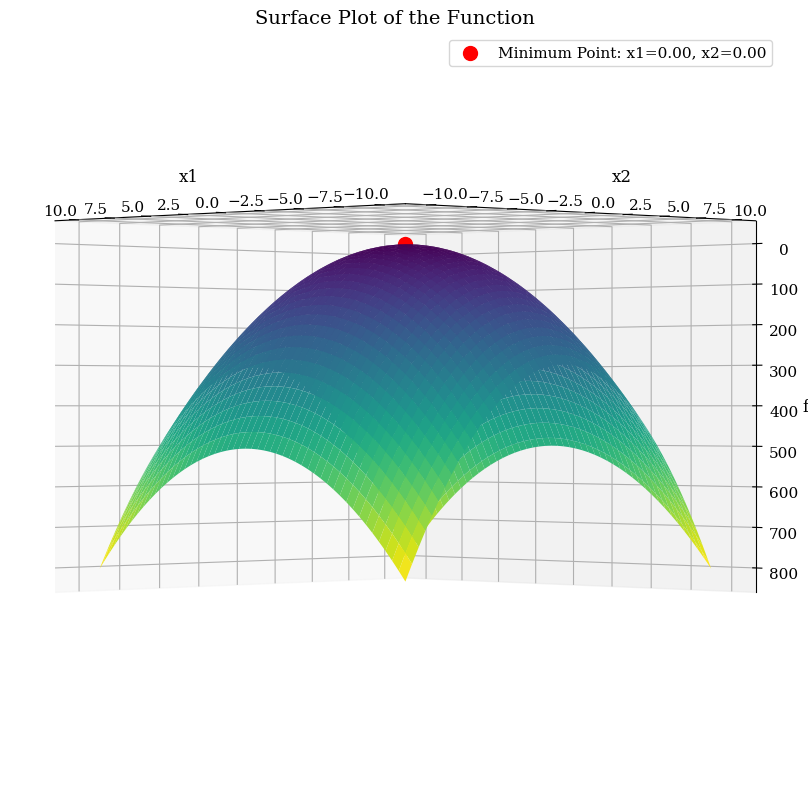

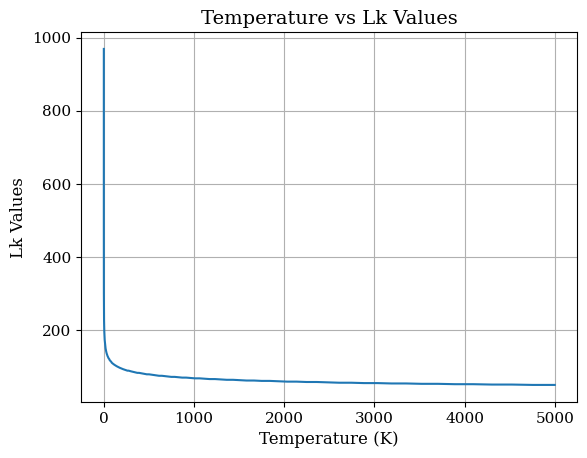

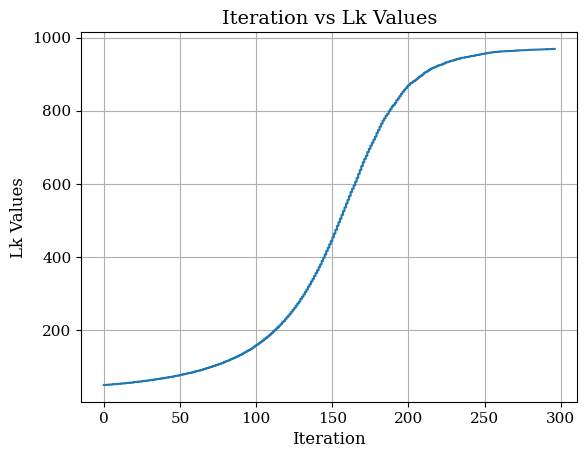

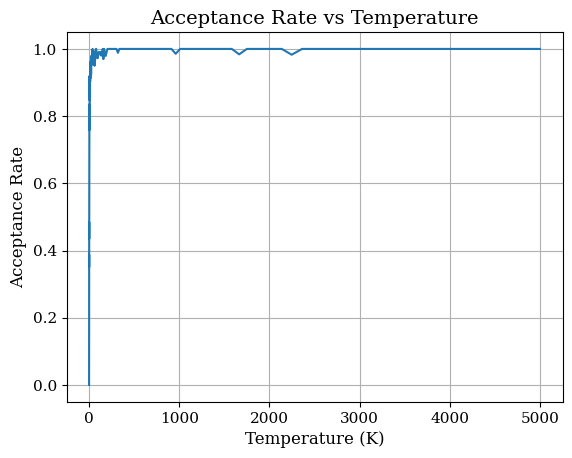

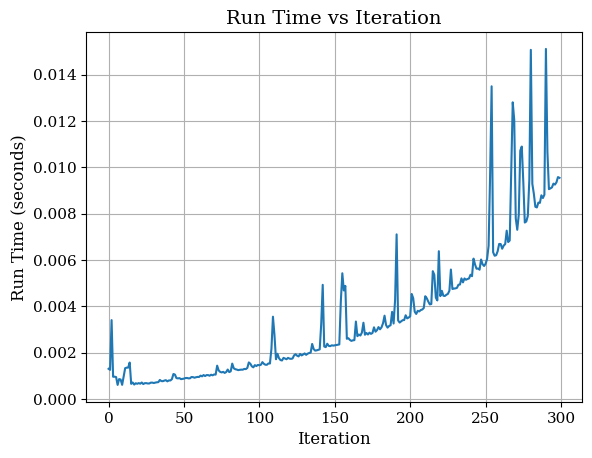

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 

In [ ]:
main(dual_var_f, -1, 1, 2, SA_Exp_Lk_dynamic)

# Multimodal

In [ ]:
def f_multi(x):
    return 1 + math.sin(x[0])**2 + math.sin(x[1])**2 - 0.1* math.exp(-(x[0]**2) - (x[1]**2)) #price 2 function 95

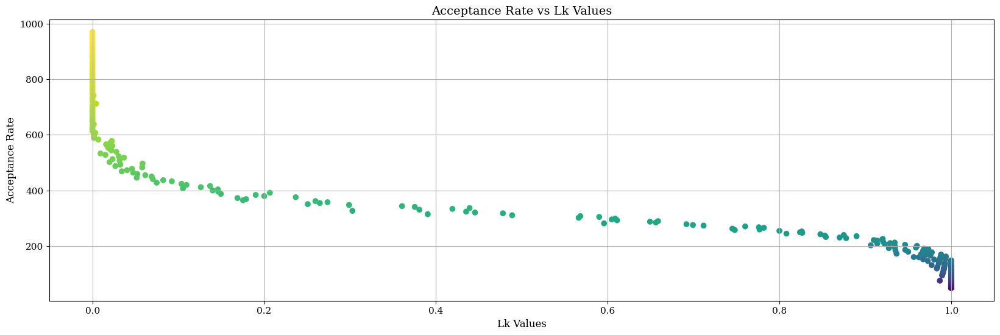

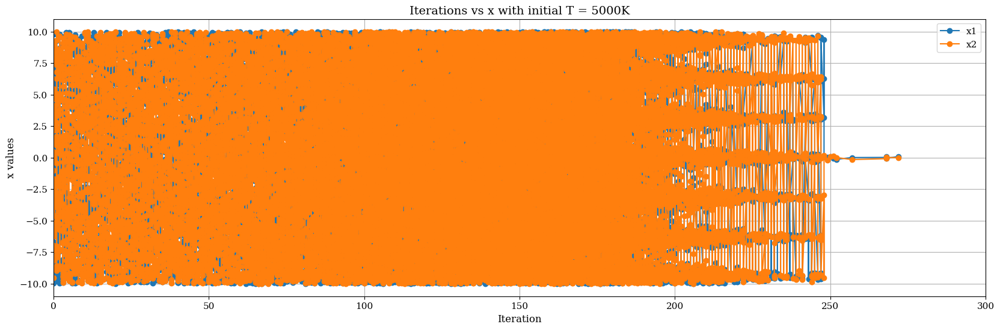

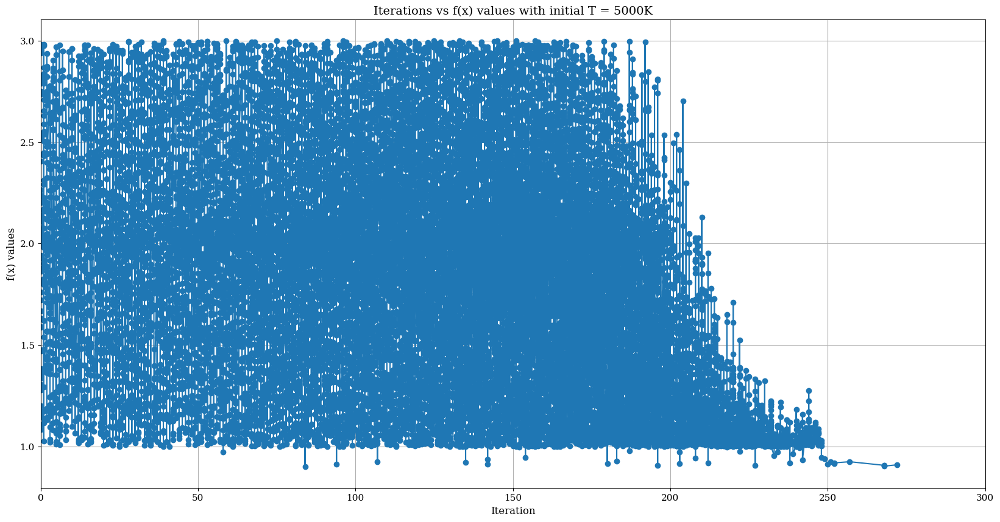

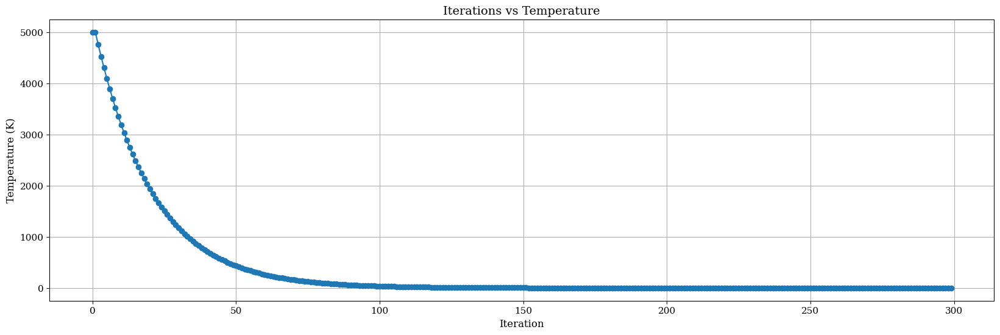

Optimal Solution = 0.9103305754356508
Minimum points = (0.09609179631483933, -0.0136980310486301)
Error = 0.0001067207888316706
Iteration that we gonna take specific temprature = 189


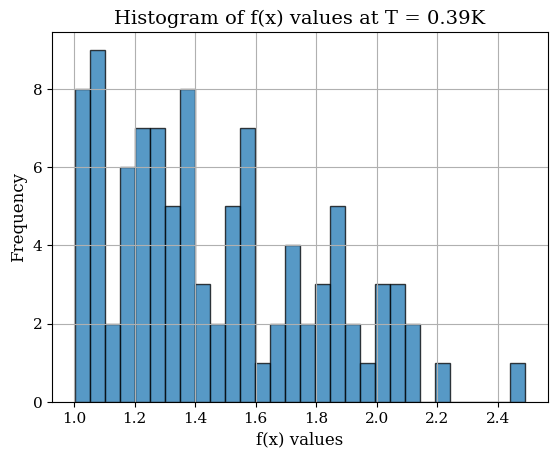

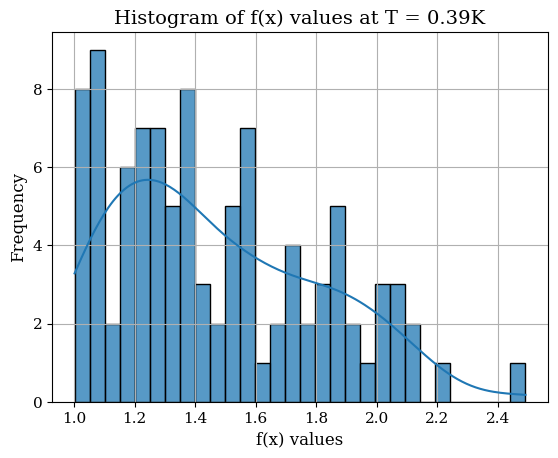

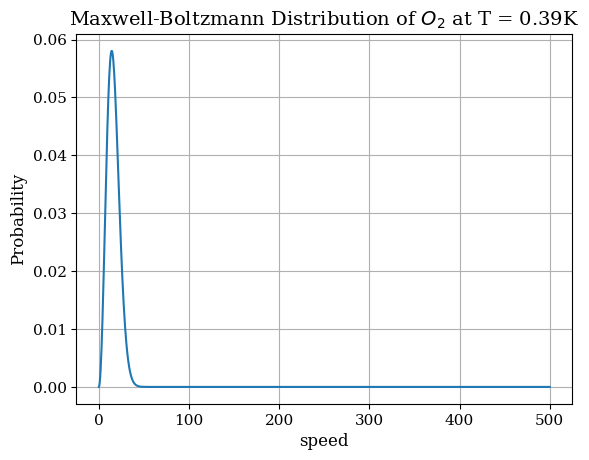

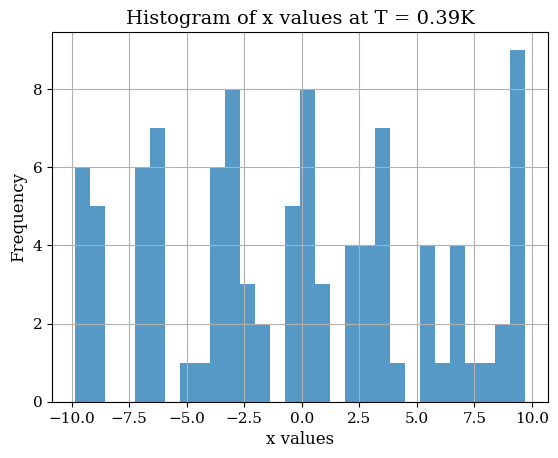

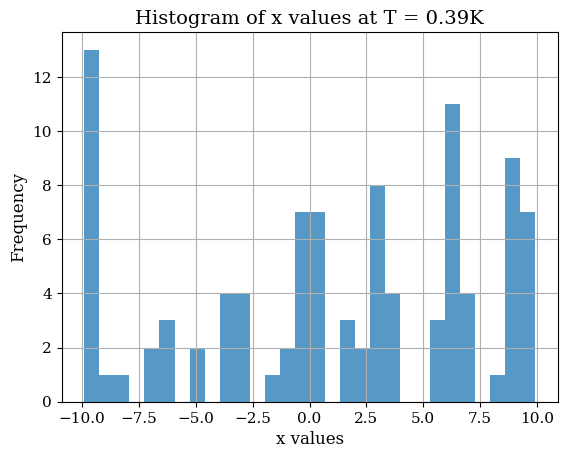

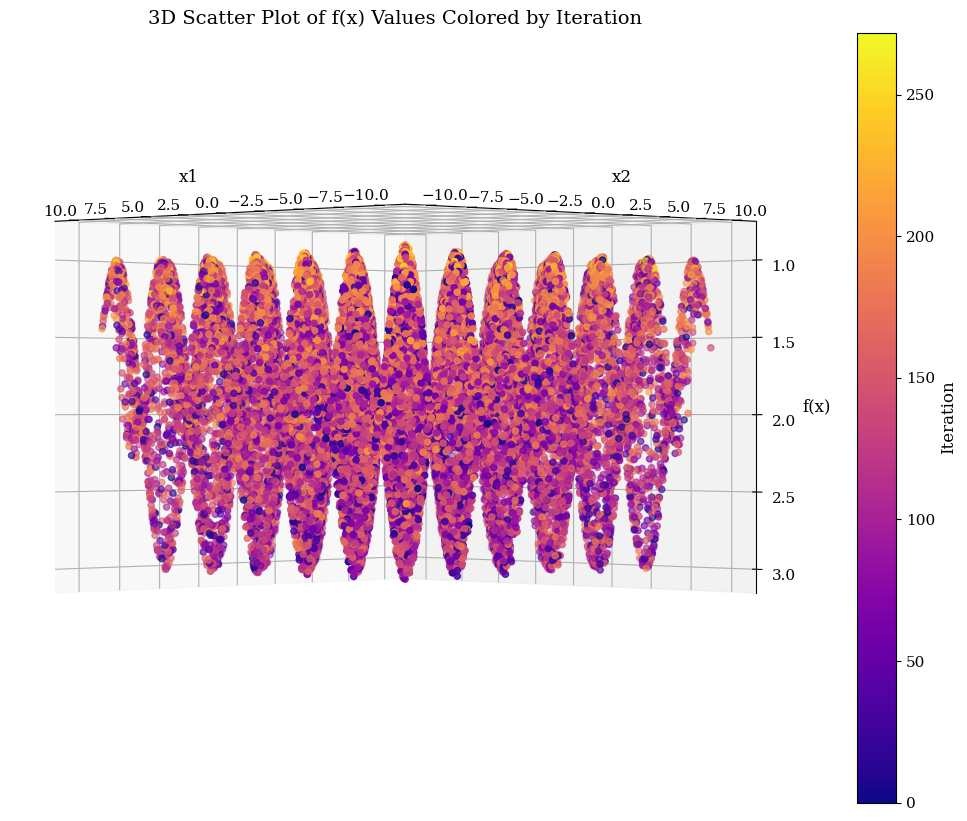

Minimum point: [0. 0.]
Function value at minimum point: 0.9


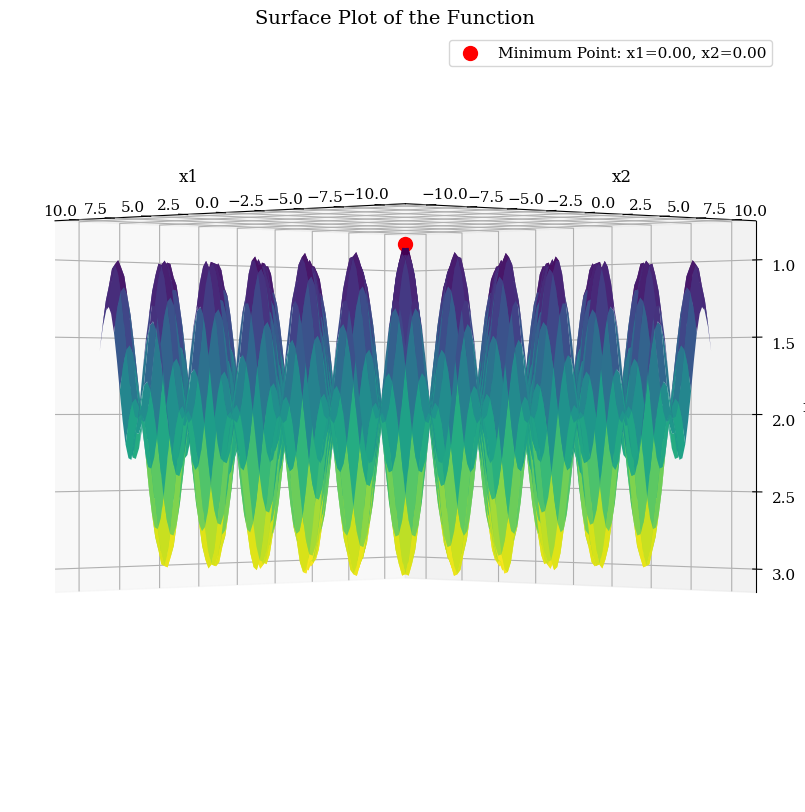

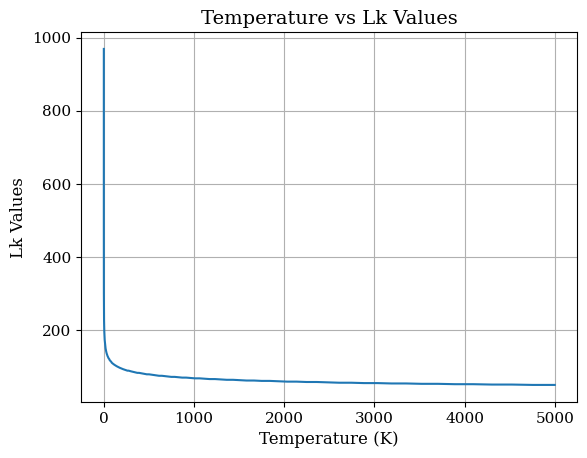

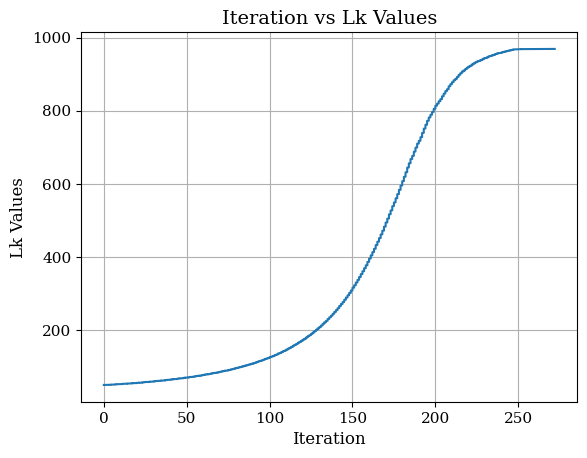

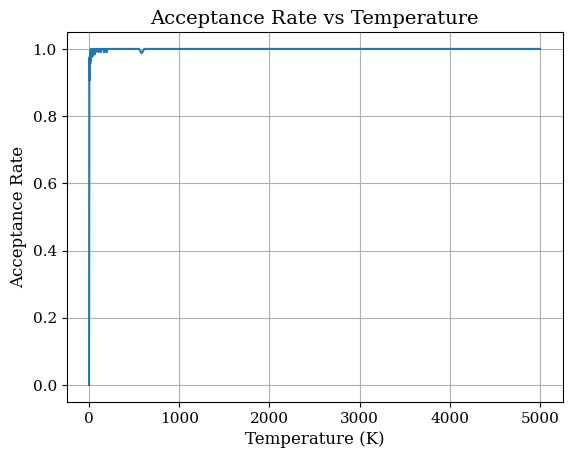

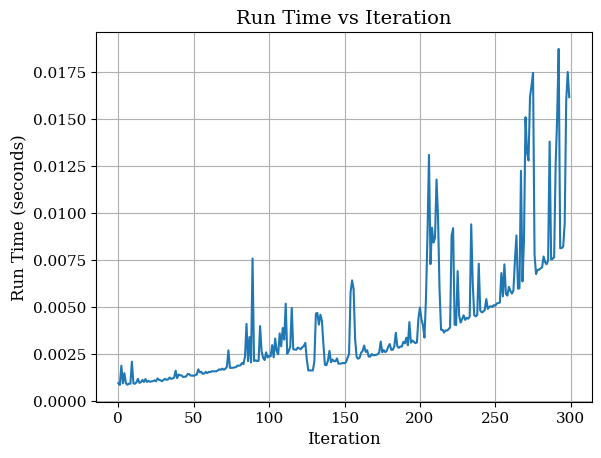

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 

In [ ]:
main(f_multi, -10, 10, 0.9, SA_Exp_Lk_dynamic)

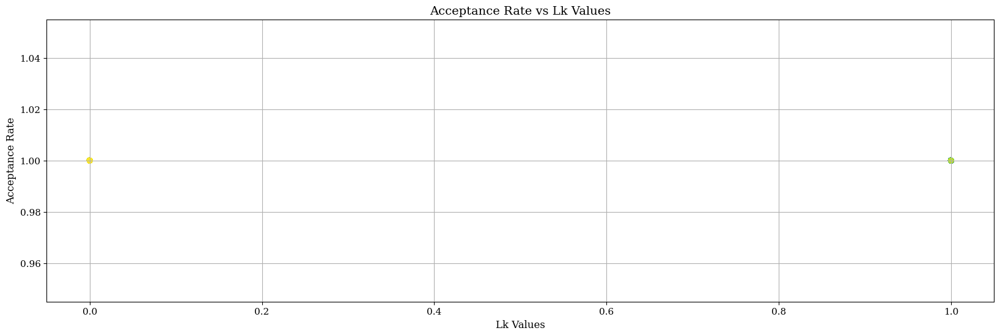

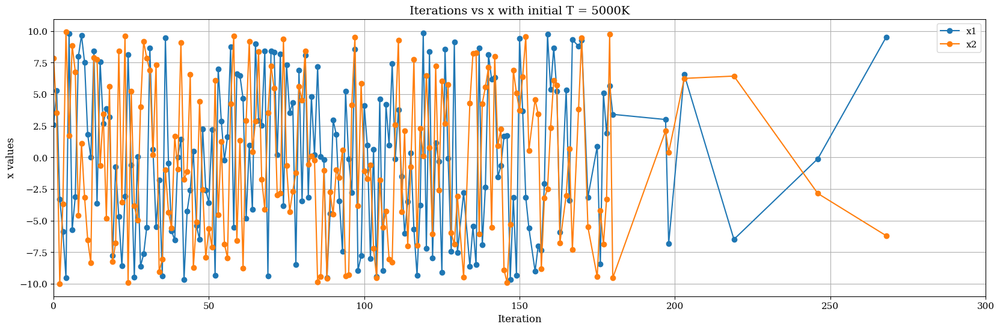

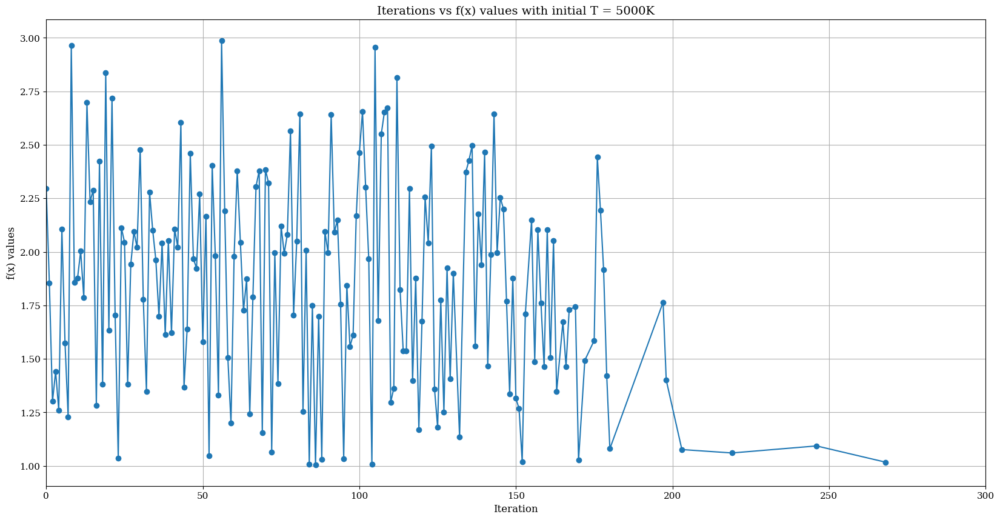

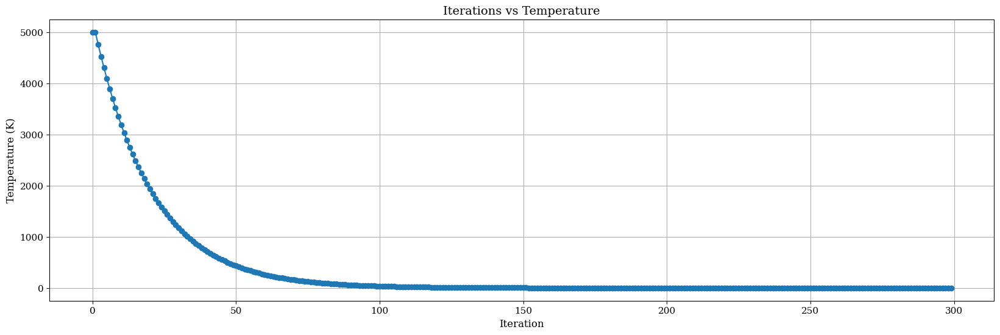

Optimal Solution = 1.0176525458810126
Minimum points = (9.51639365412231, -6.186689542152468)
Error = 0.013842121552283773
Iteration that we gonna take specific temprature = 171


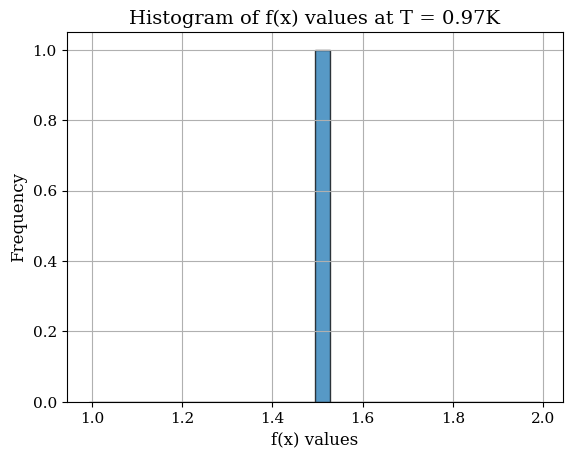

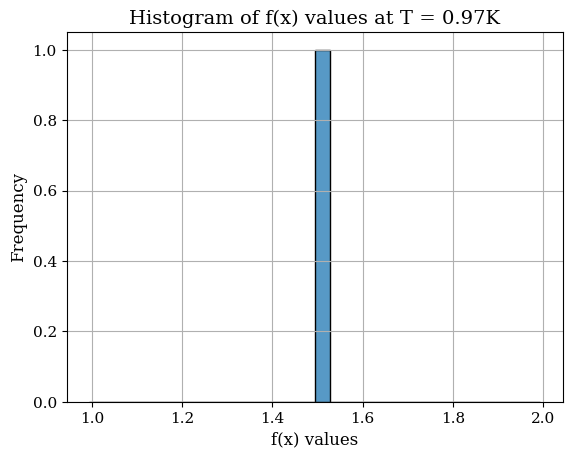

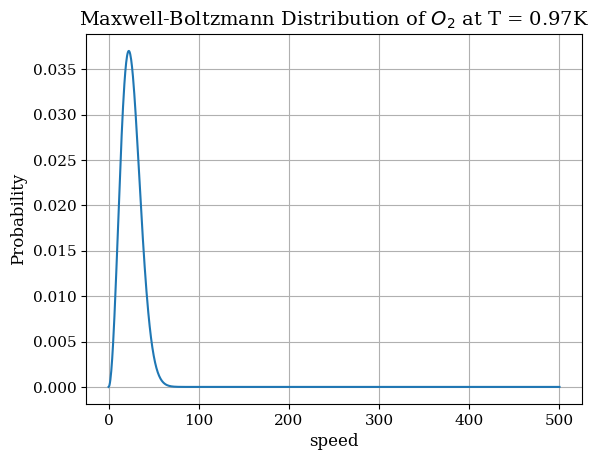

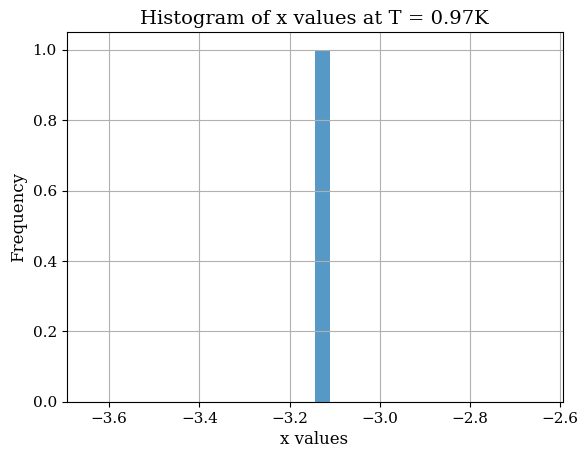

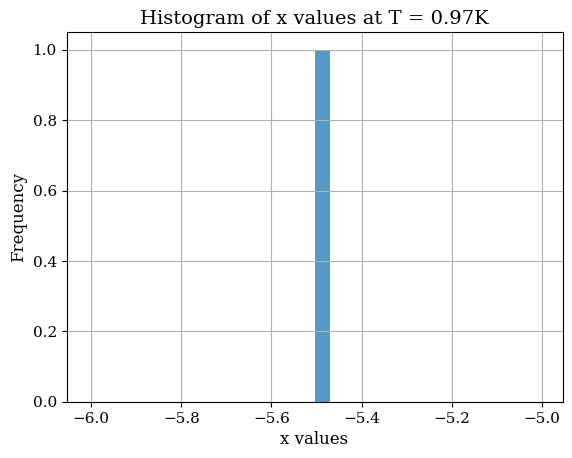

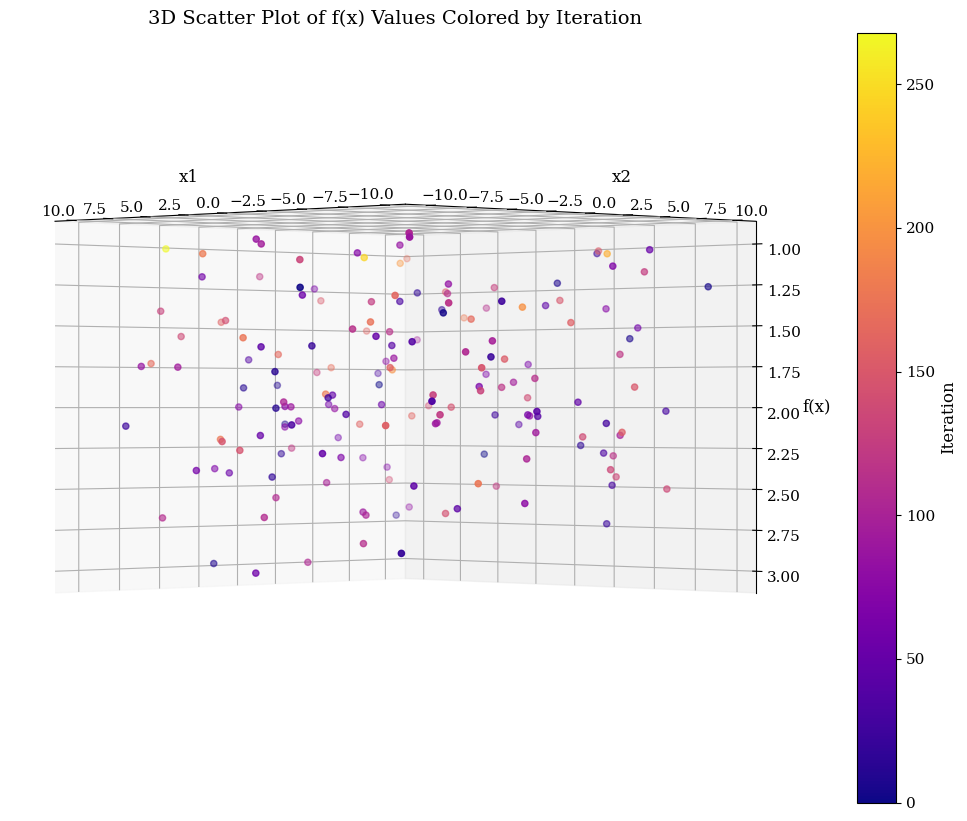

Minimum point: [0. 0.]
Function value at minimum point: 0.9


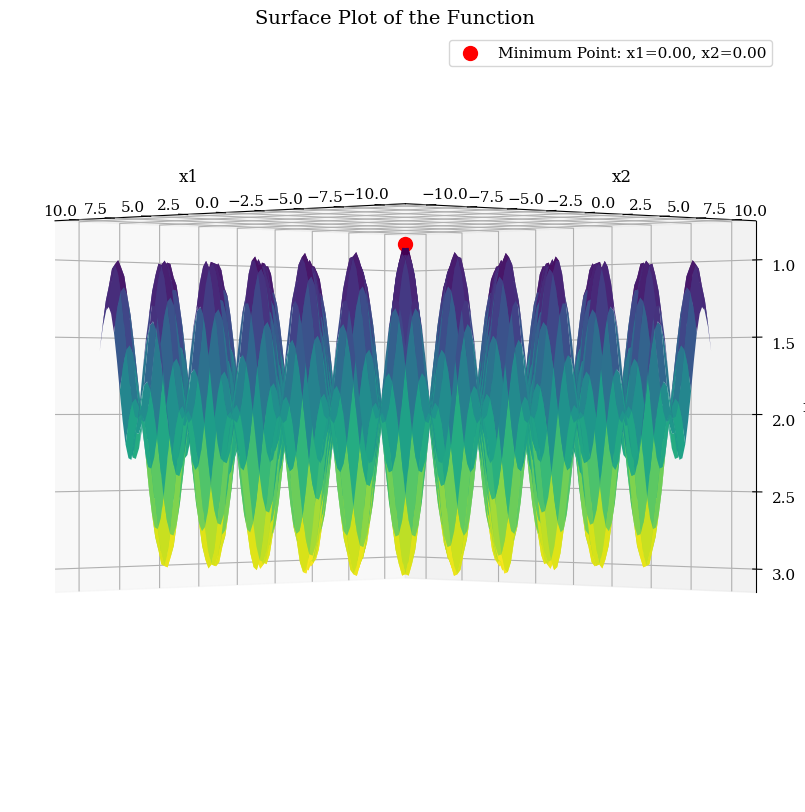

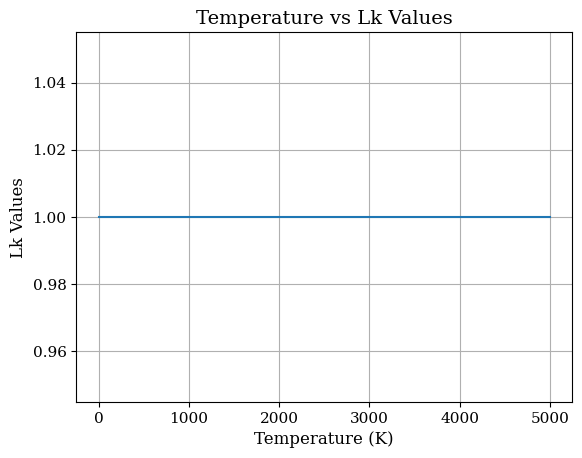

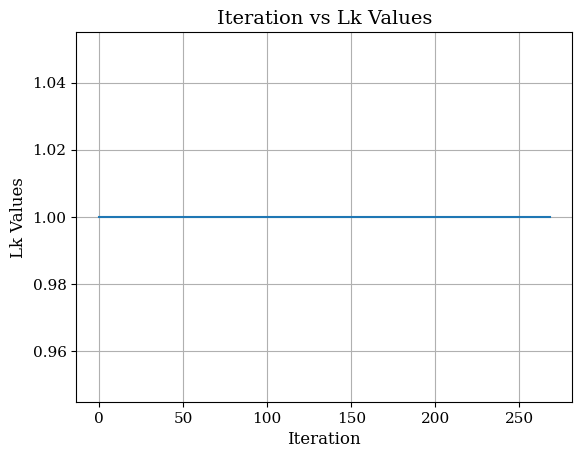

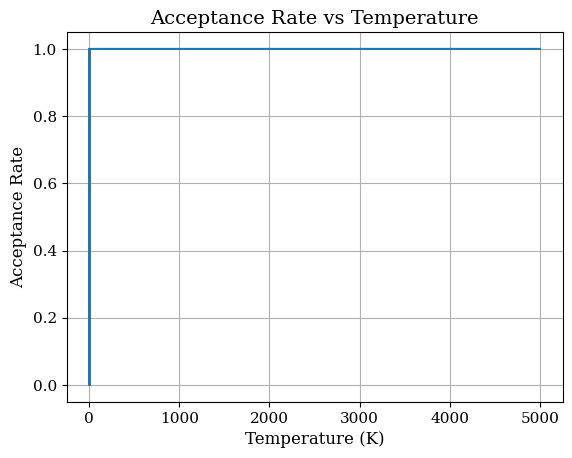

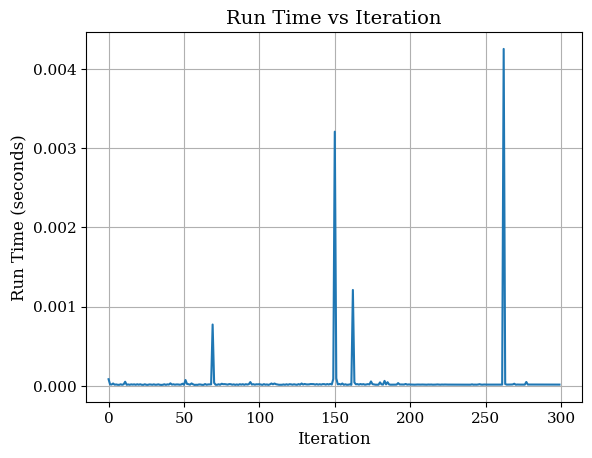

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 132, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 155, 156, 157, 158, 159, 160, 161, 162, 163, 165, 166, 167, 169, 170, 172, 175, 176, 177, 178, 179, 180, 197, 198, 203, 219, 246, 268]


In [ ]:
main(f_multi, -10, 10, 0.9, SA_Exp_Lk_989)

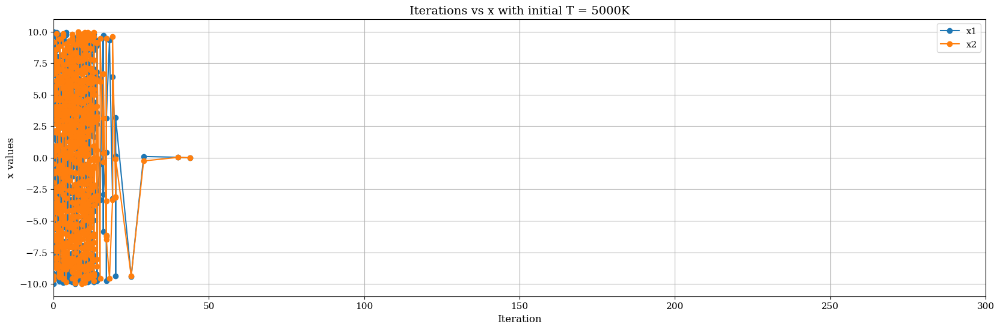

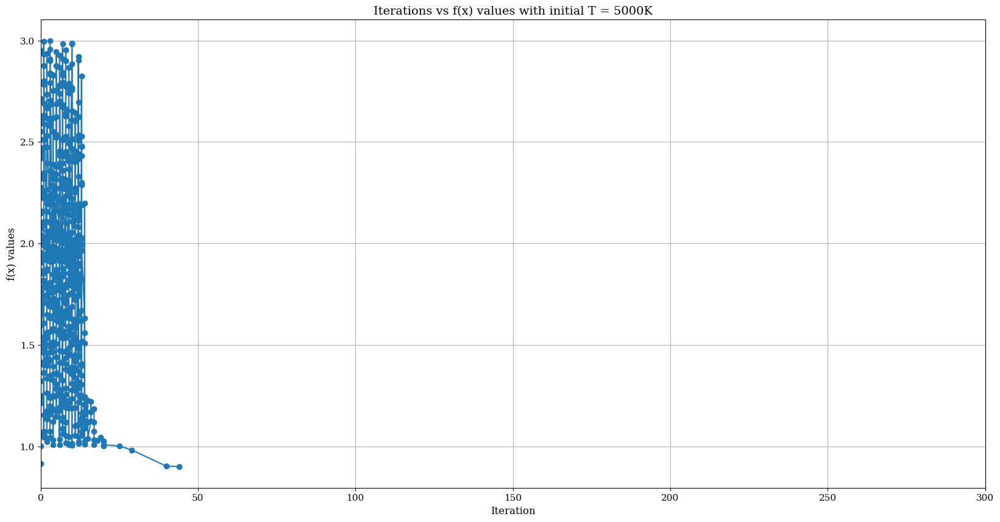

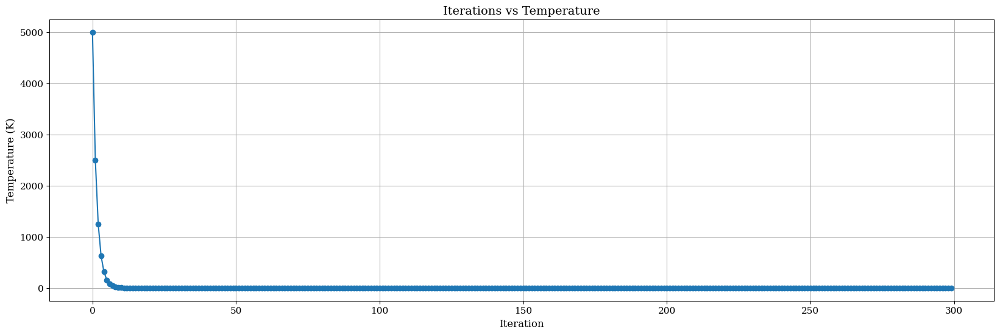

Optimal Solution = 0.9004579887430846
Minimum points = (-0.02032737487281011, -0.001791885254503356)
Error = 2.0975368879217385e-07
Iteration that we gonna take specific temprature = 154


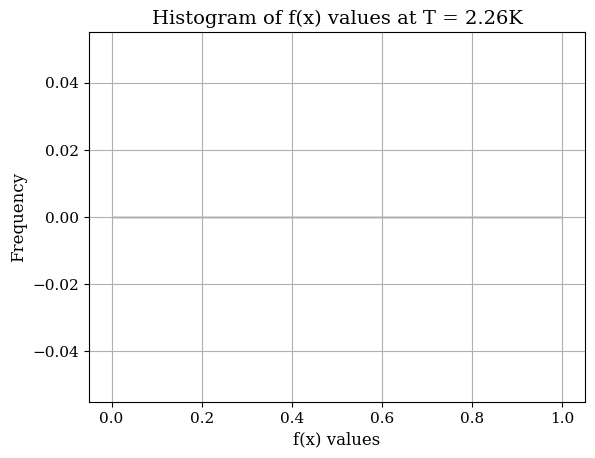

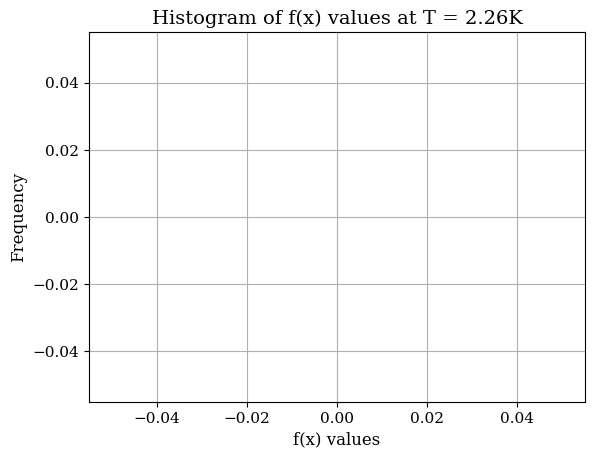

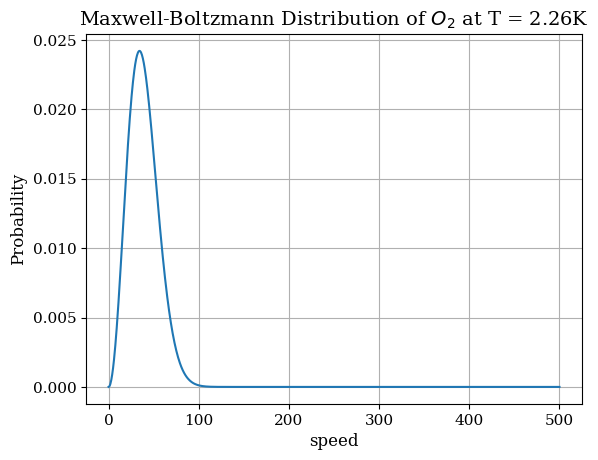

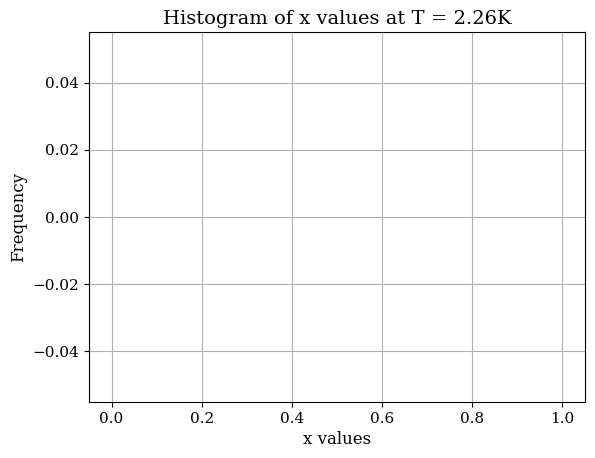

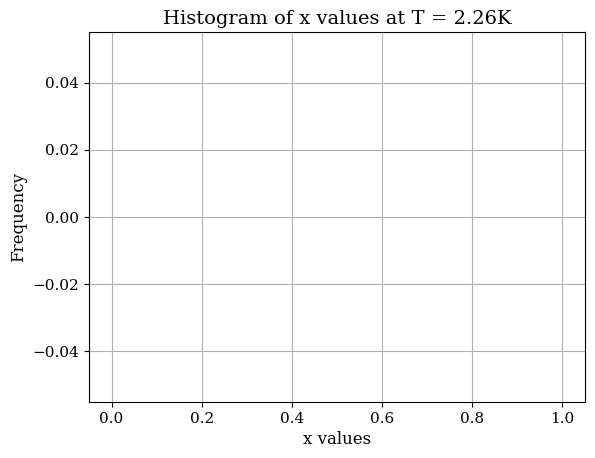

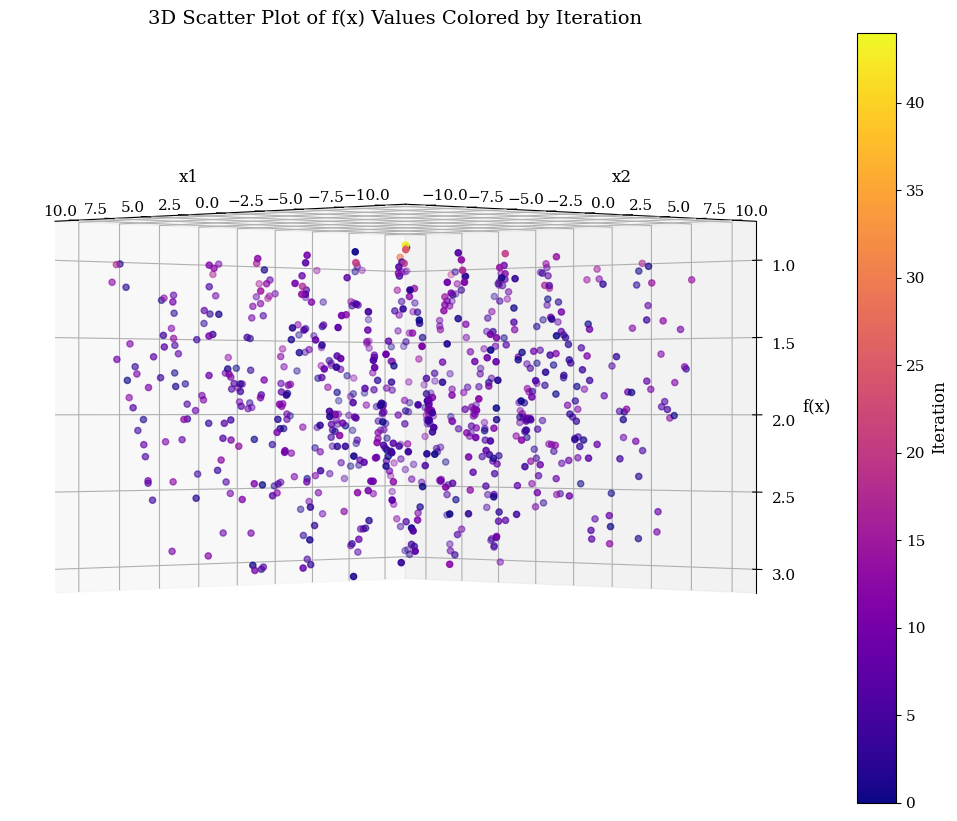

Minimum point: [0. 0.]
Function value at minimum point: 0.9


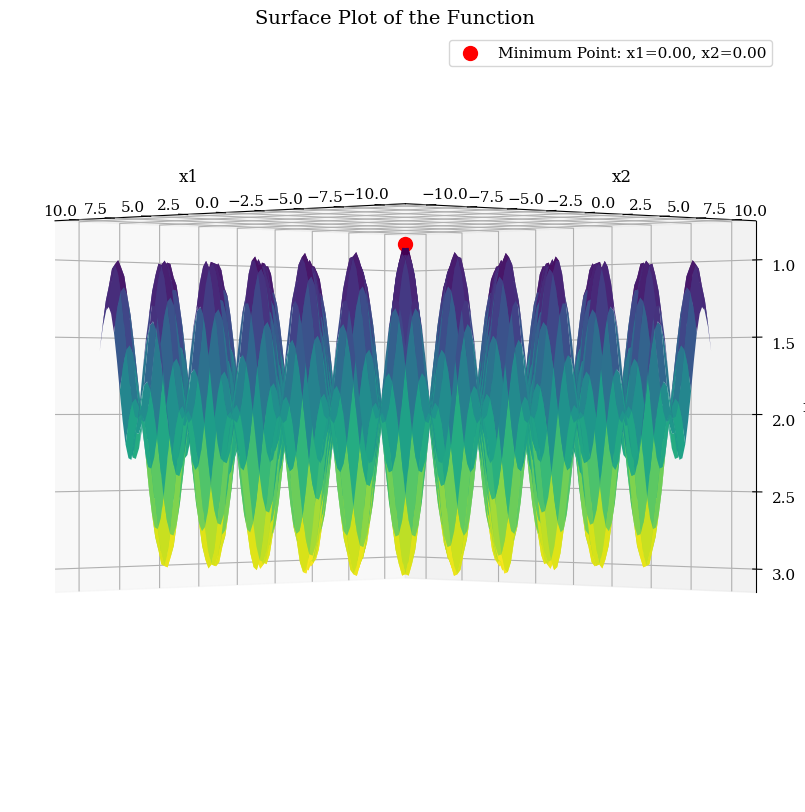

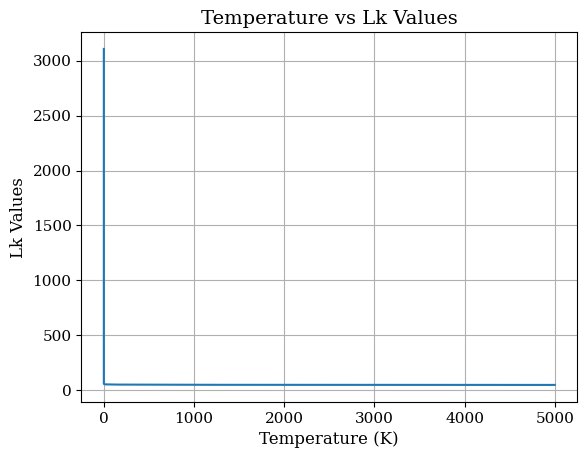

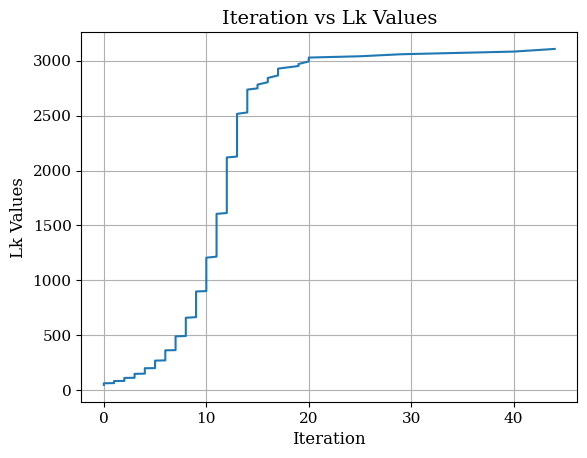

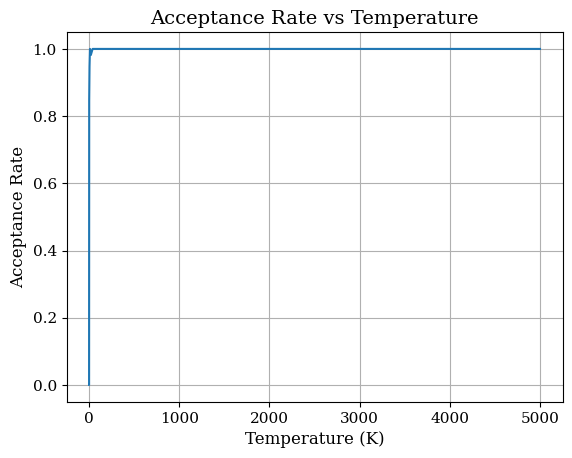

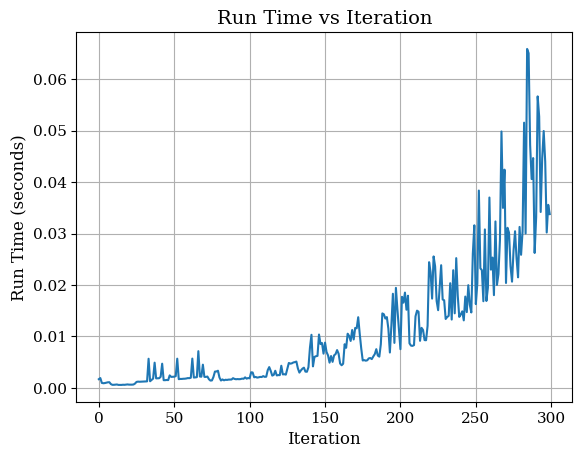

In [ ]:
main(f_multi, -10, 10, 0.9, SA_Linear_Lk_dynamic)

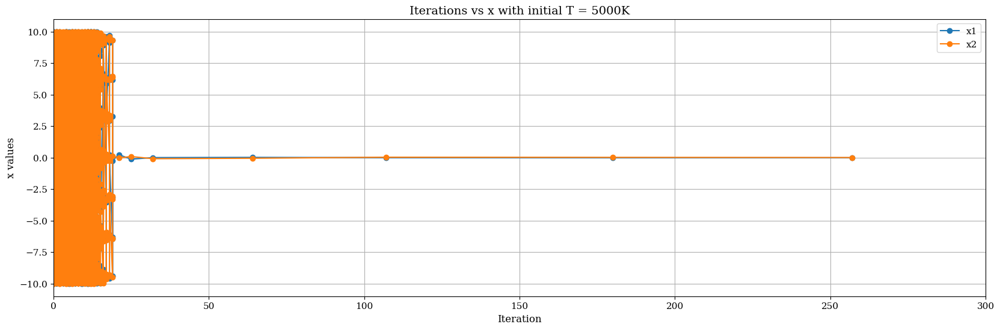

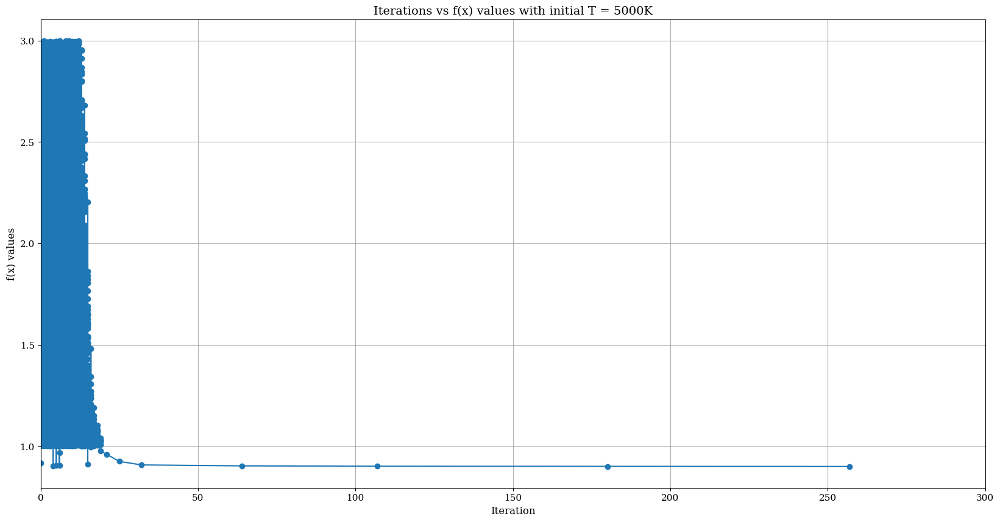

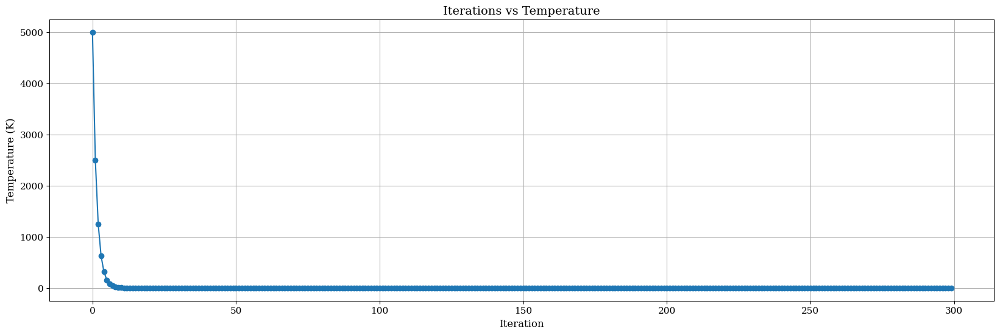

Optimal Solution = 0.9001529465330192
Minimum points = (-0.007831885928851534, 0.008815197913335737)
Error = 2.3392641962601495e-08
Iteration that we gonna take specific temprature = 200


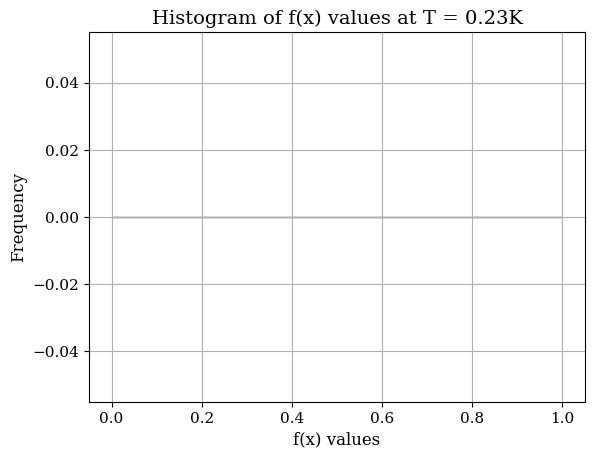

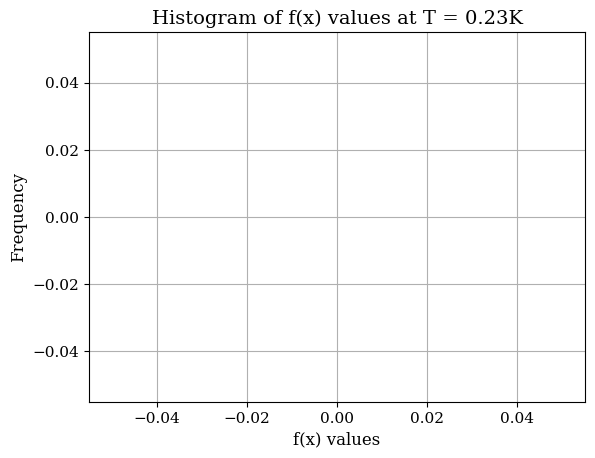

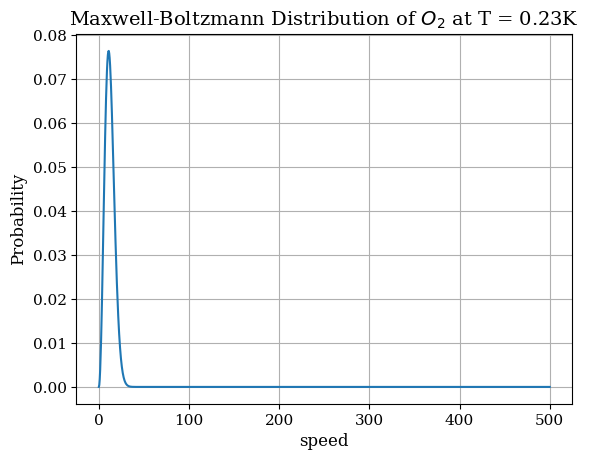

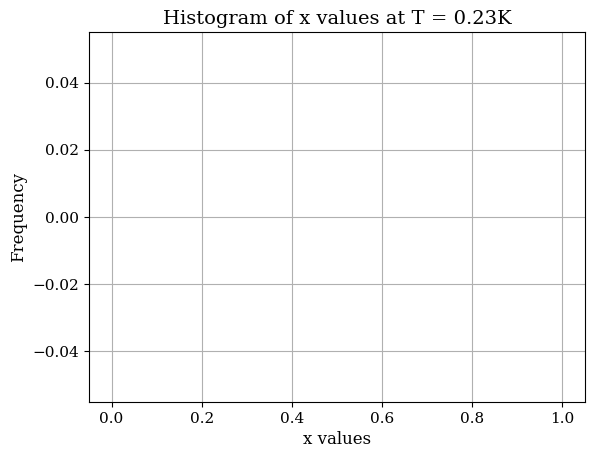

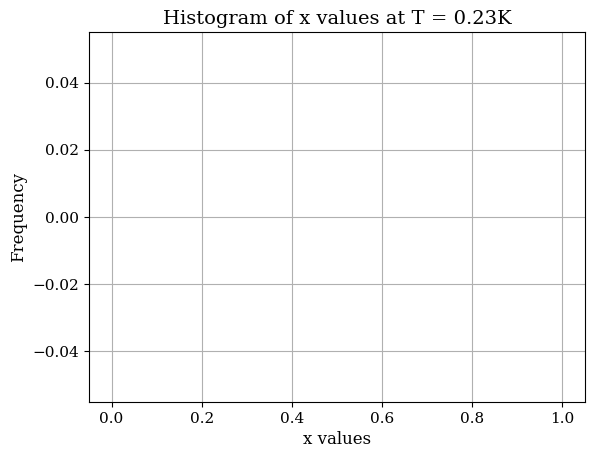

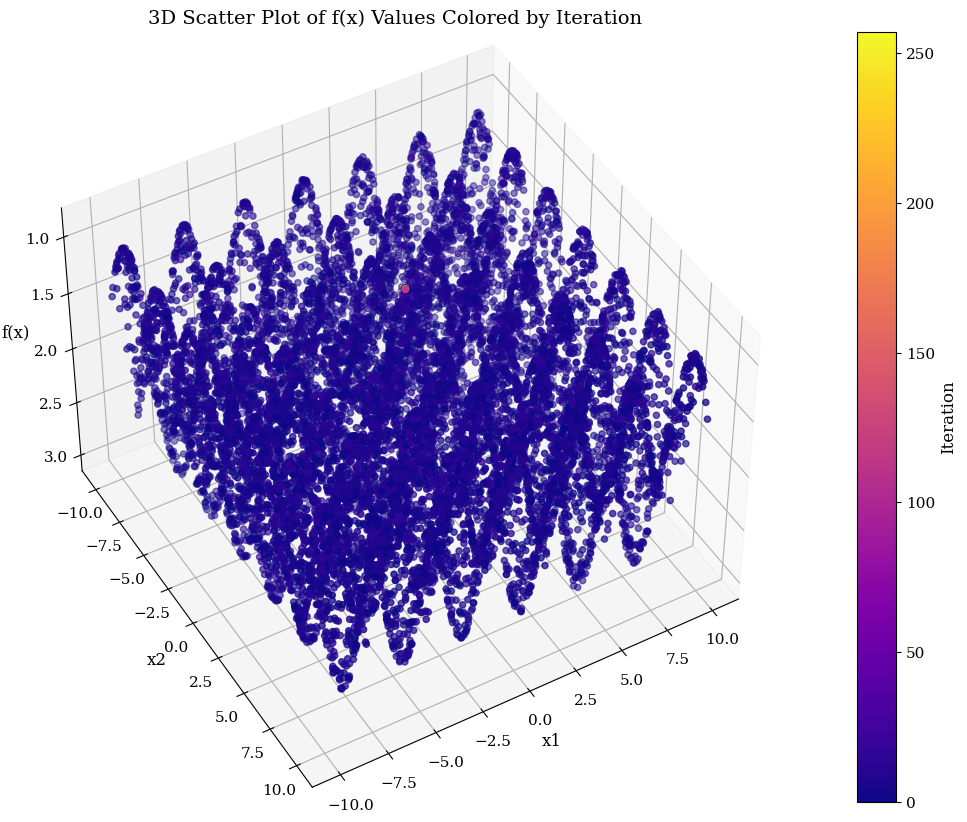

Minimum point: [0. 0.]
Function value at minimum point: 0.9


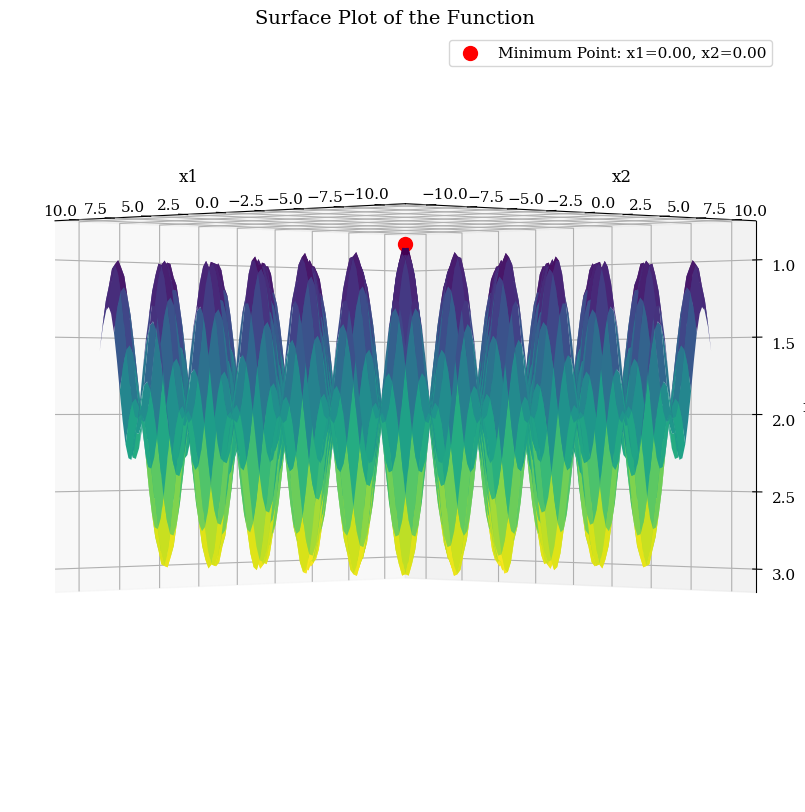

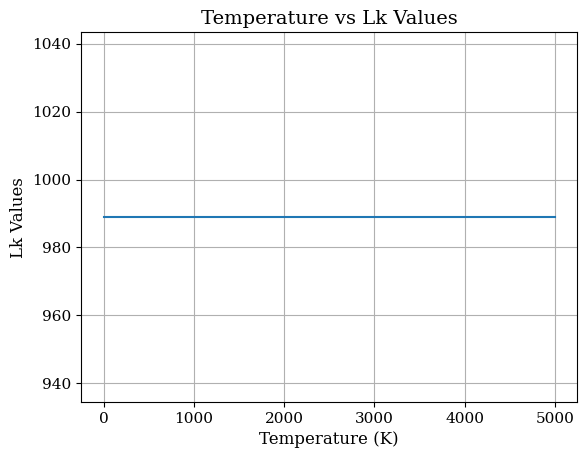

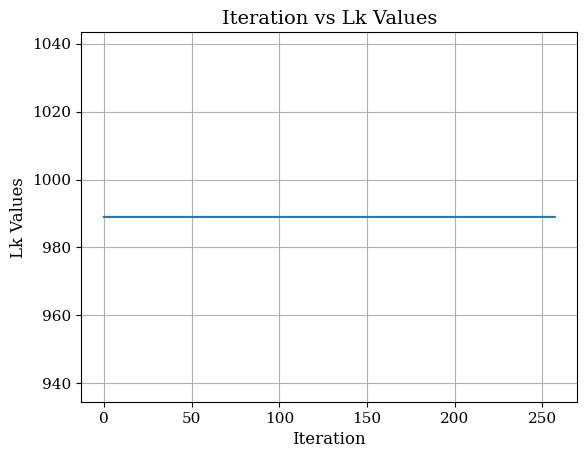

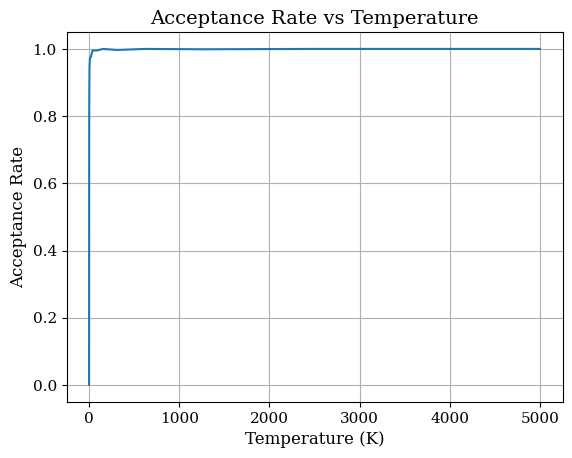

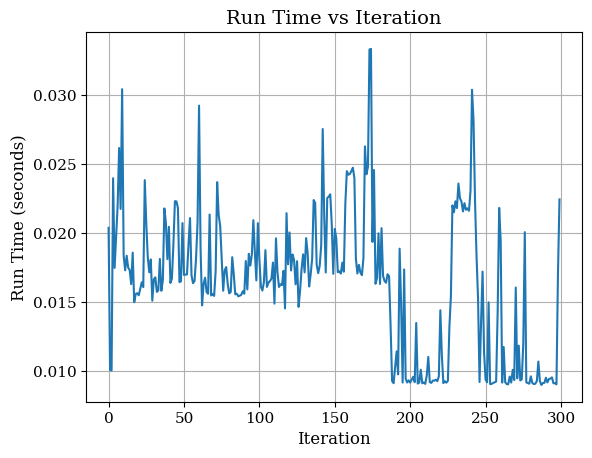

In [ ]:
main(f_multi, -10, 10, 0.9, SA_Linear_Lk_989)

# Unimodal

In [ ]:
def f_uni(x):
    return -200*math.exp(-0.02 * math.sqrt(x[0]**2 + x[1]**2)) # Ackley 2 Function 2

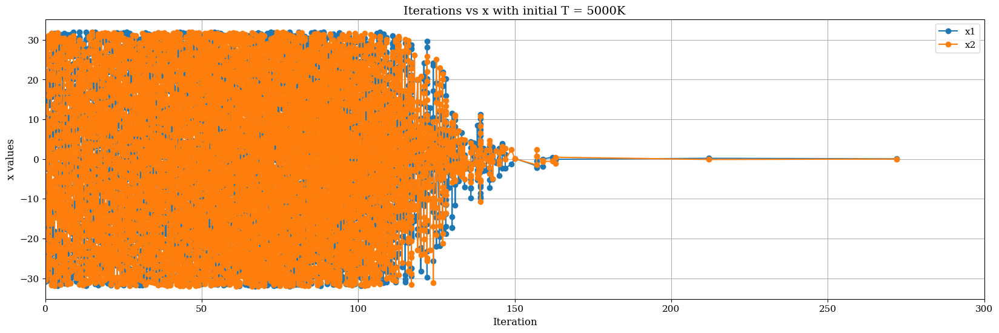

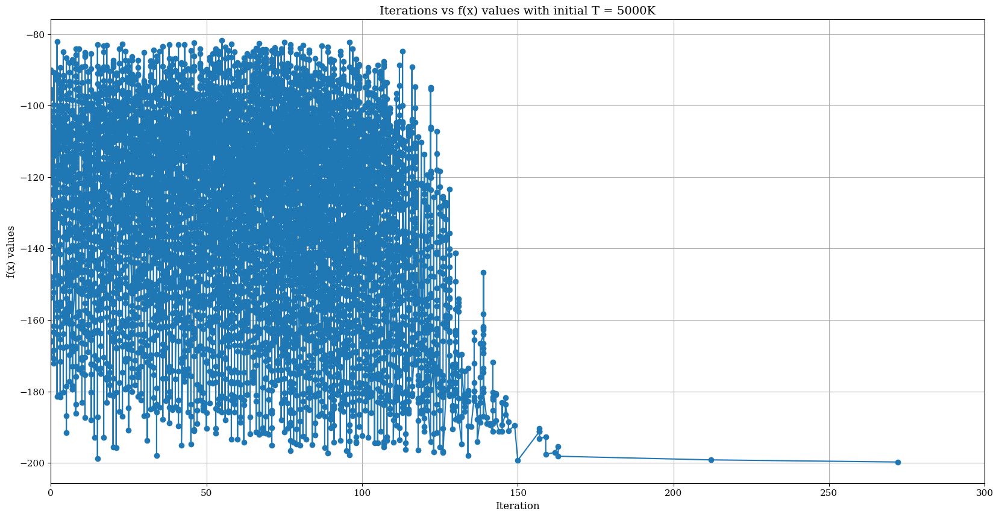

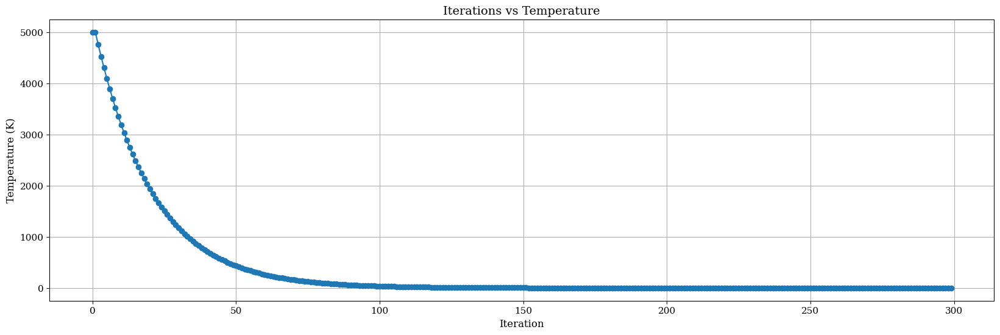

Optimal Solution = -199.76463901919473
Minimum points = (0.05807388240907585, 0.009678705542484067)
Error = 0.05539479128561779
Iteration that we gonna take specific temprature = 208


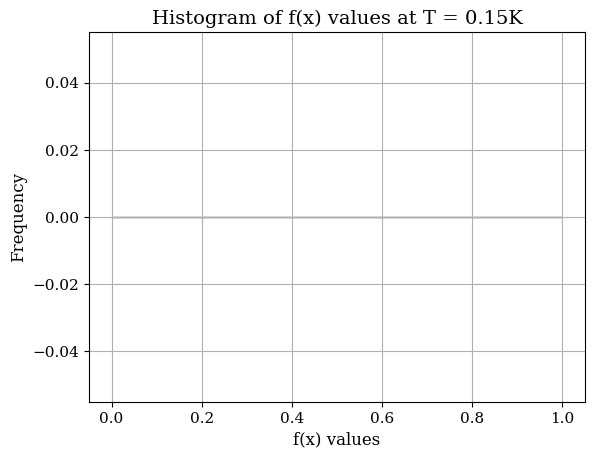

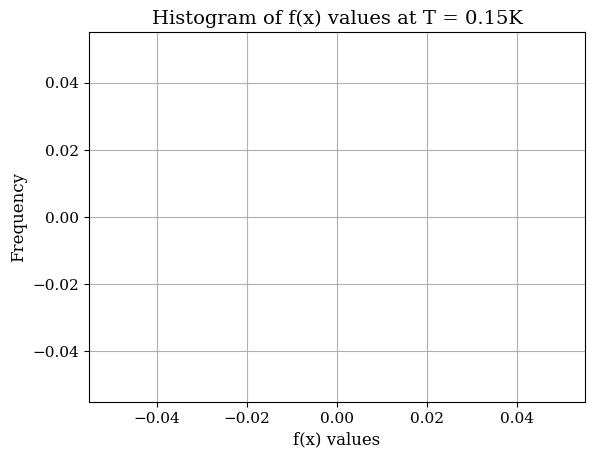

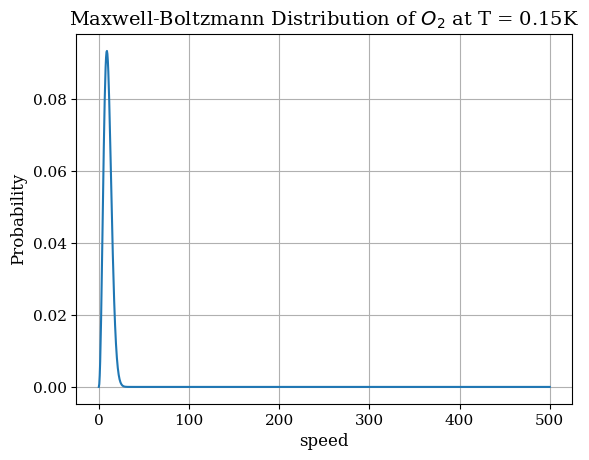

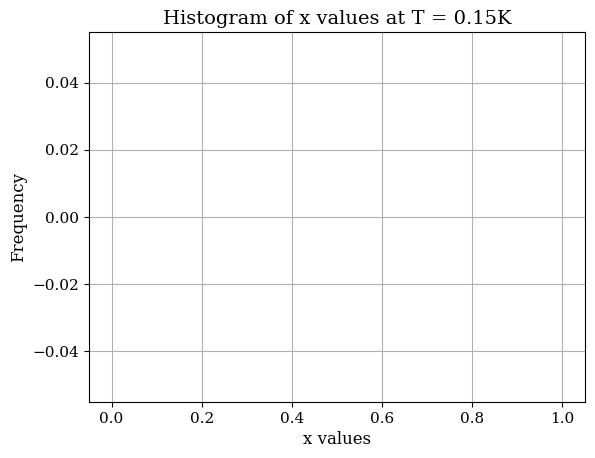

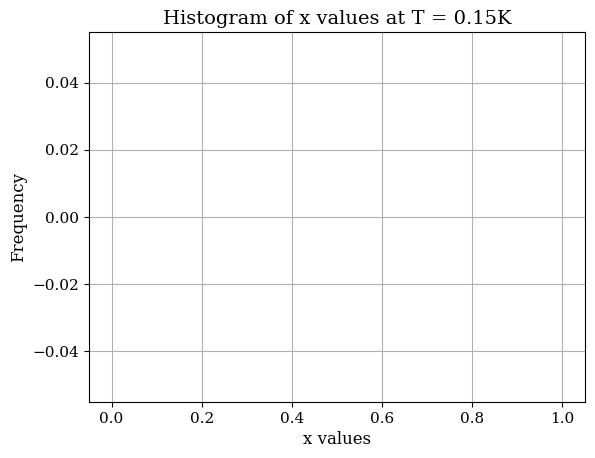

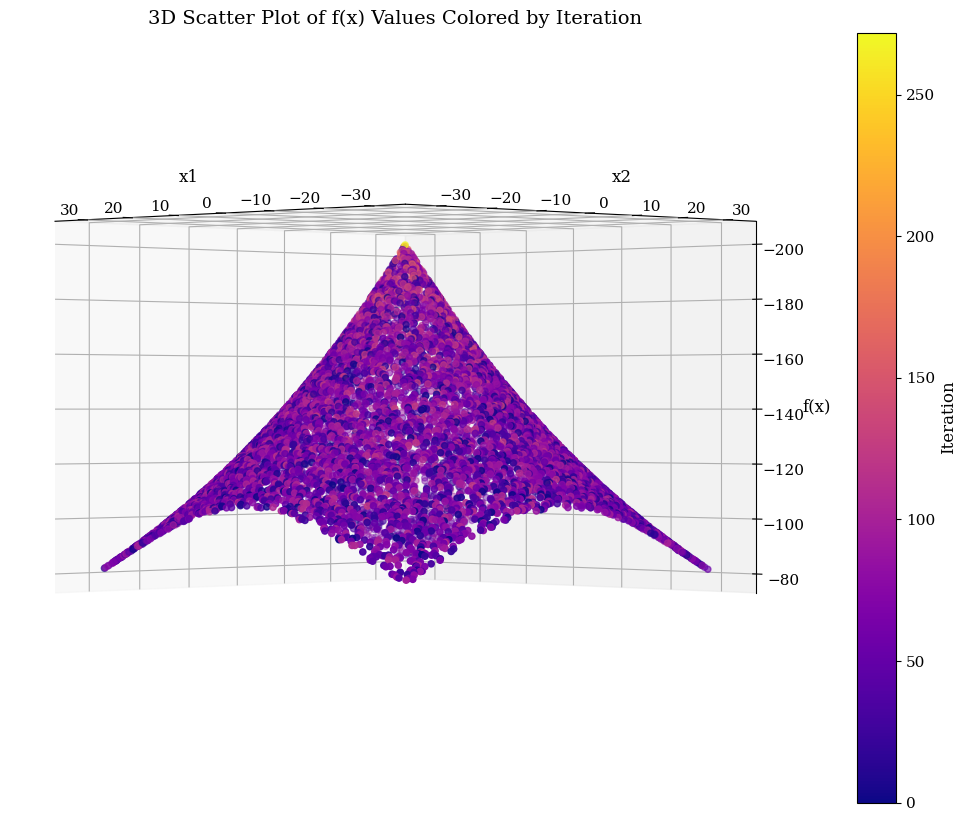

Minimum point: [0. 0.]
Function value at minimum point: -200.0


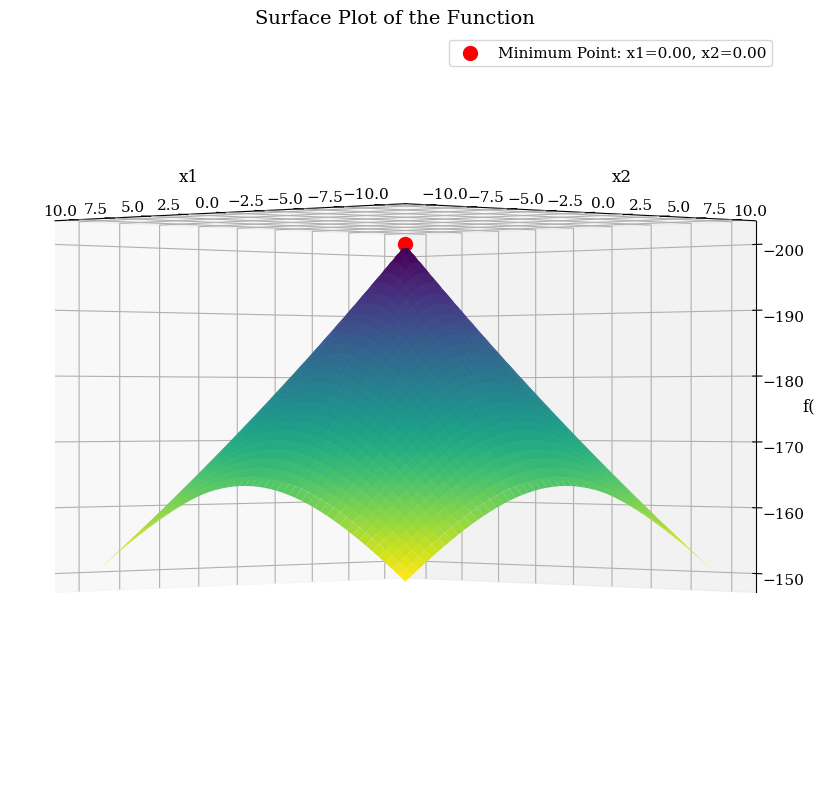

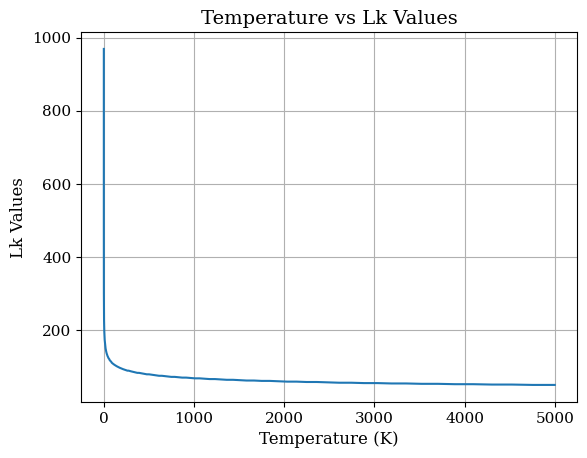

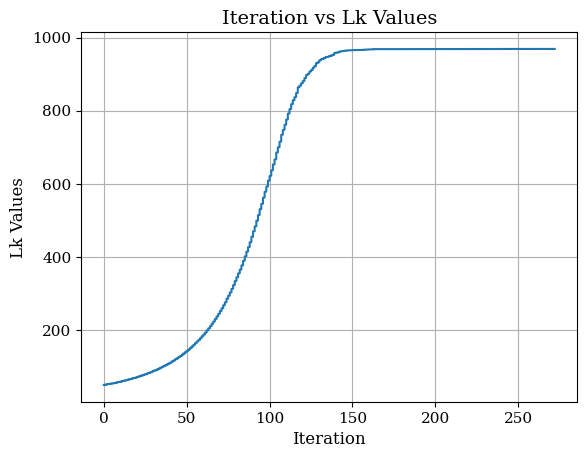

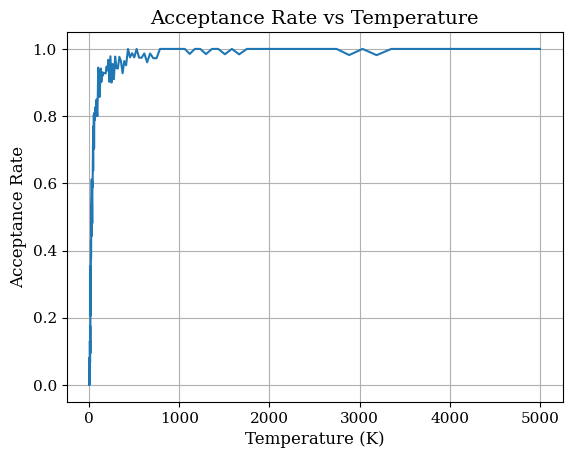

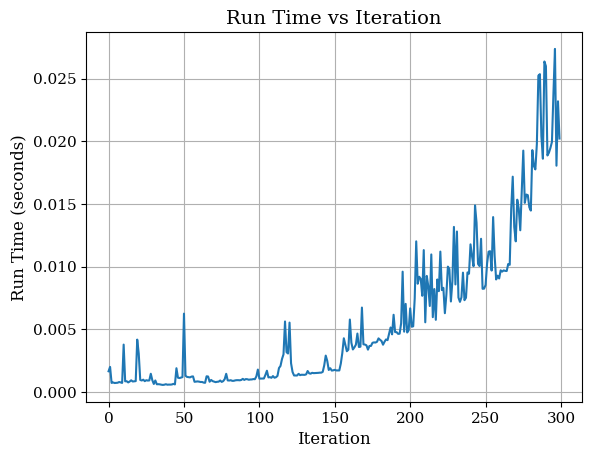

In [ ]:
main(f_uni, -32, 32, -200, SA_Exp_Lk_dynamic)

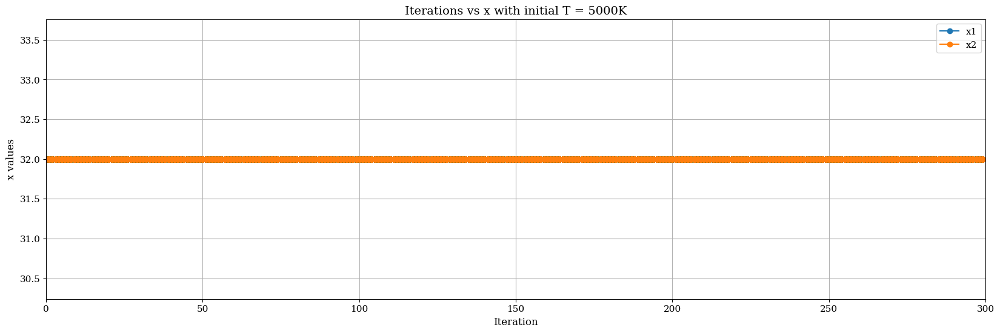

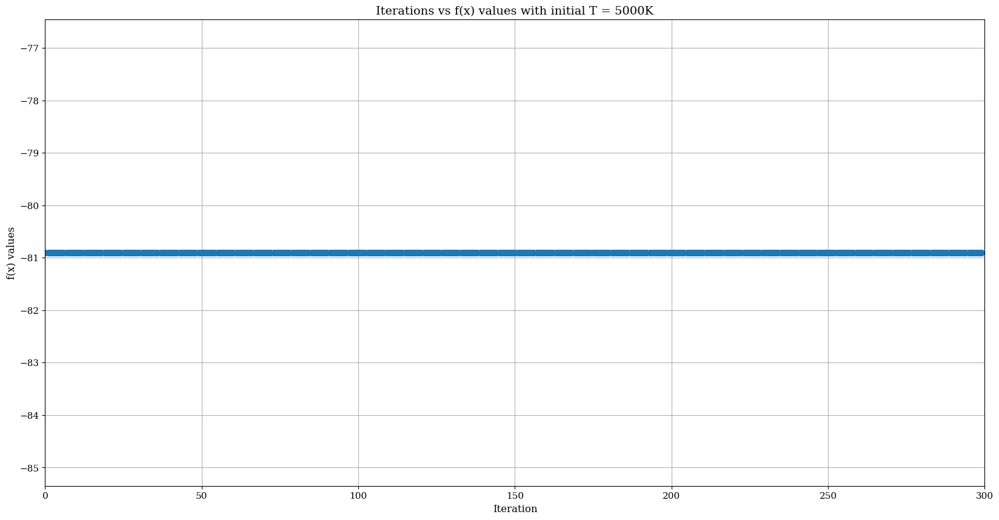

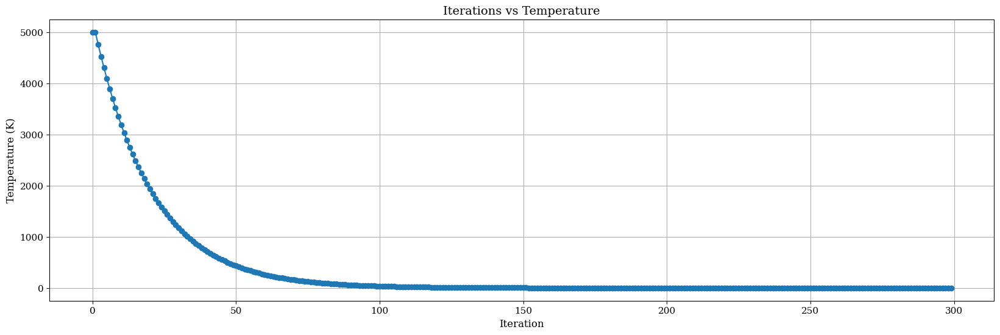

Optimal Solution = -80.9005551833981
Minimum points = (32.0, 32.0)
Error = 14184.677755622803
Iteration that we gonna take specific temprature = 200


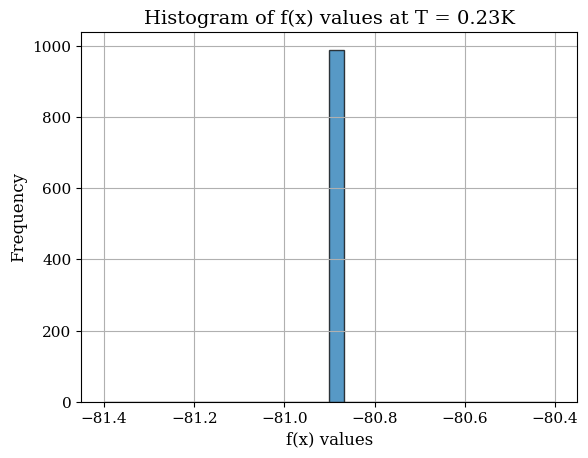

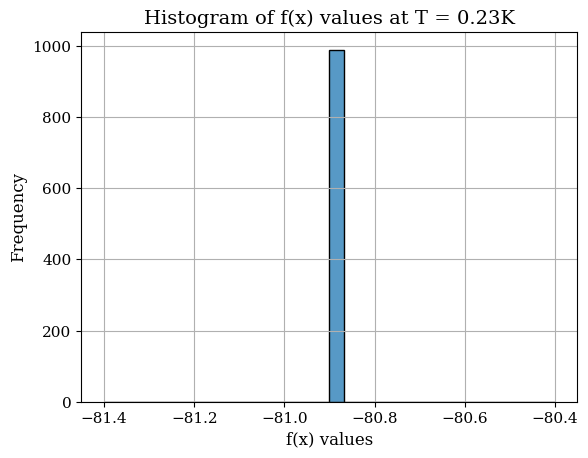

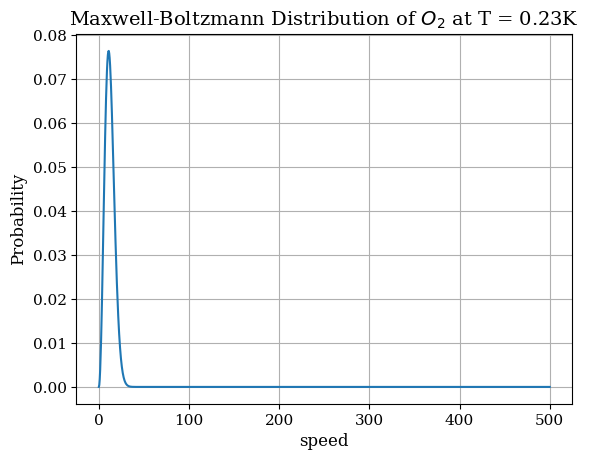

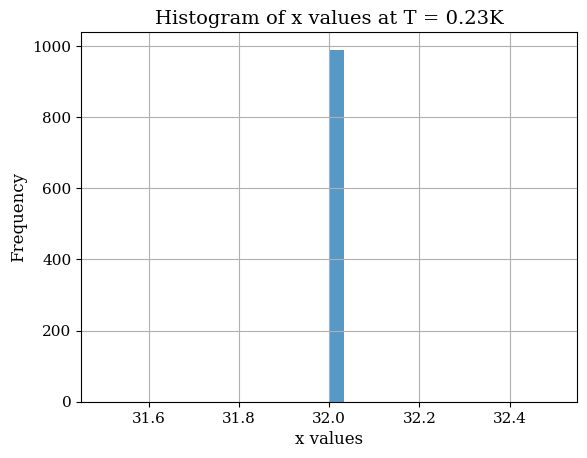

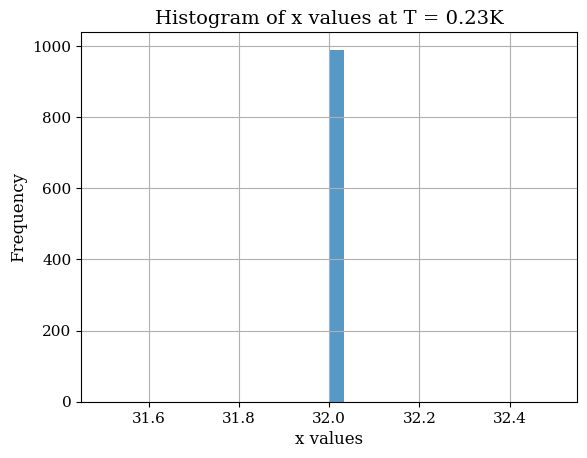

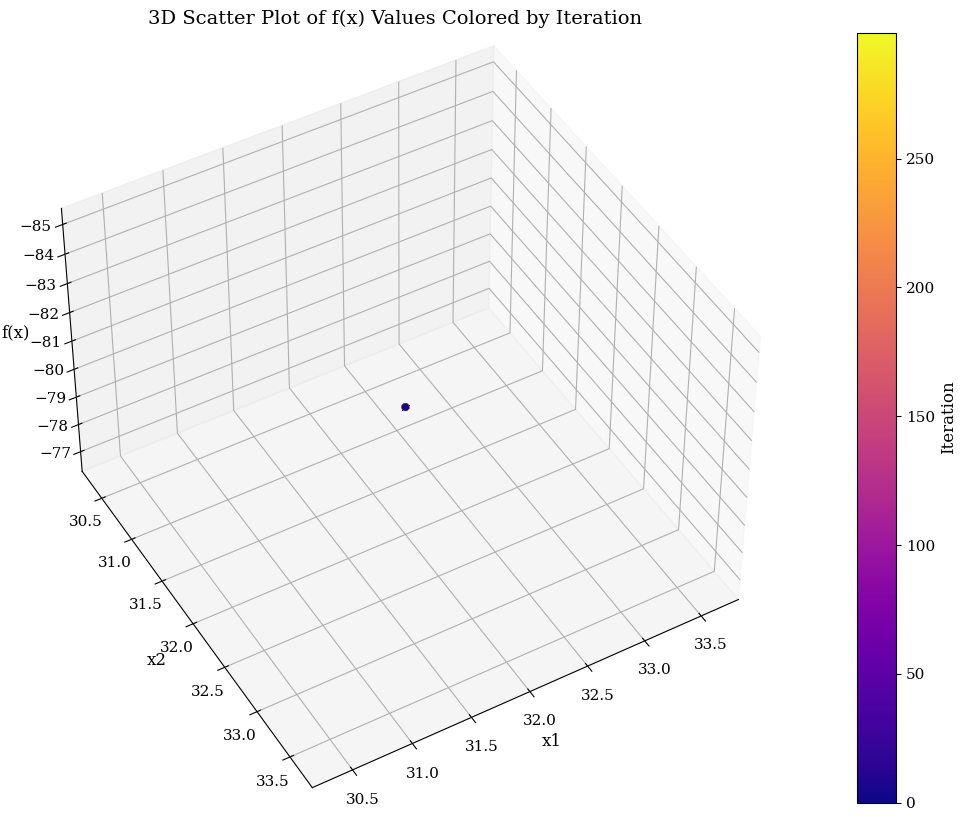

Minimum point: [0. 0.]
Function value at minimum point: -200.0


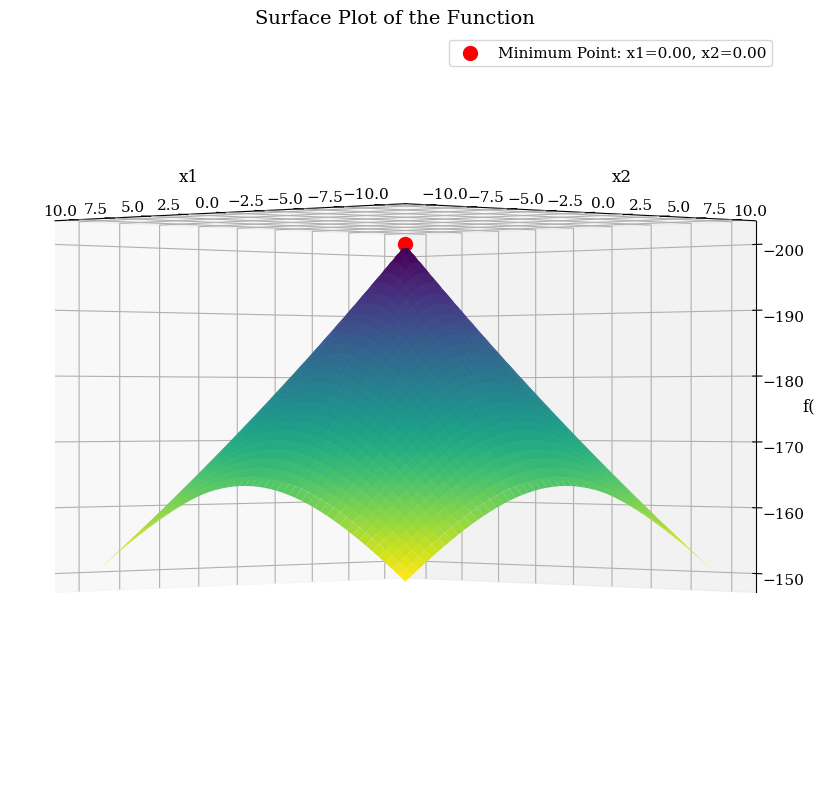

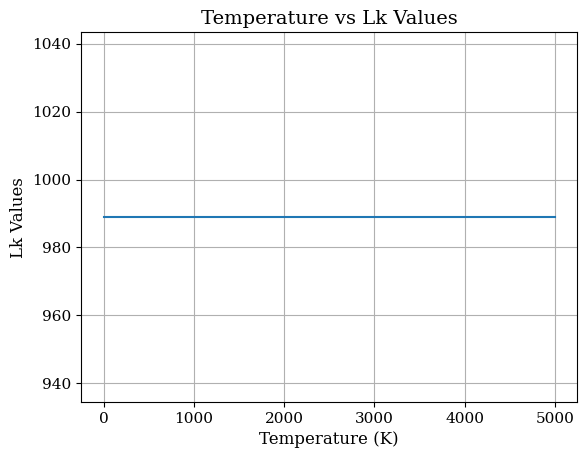

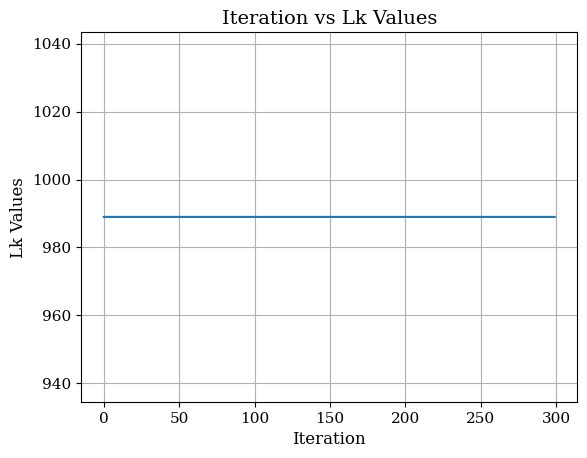

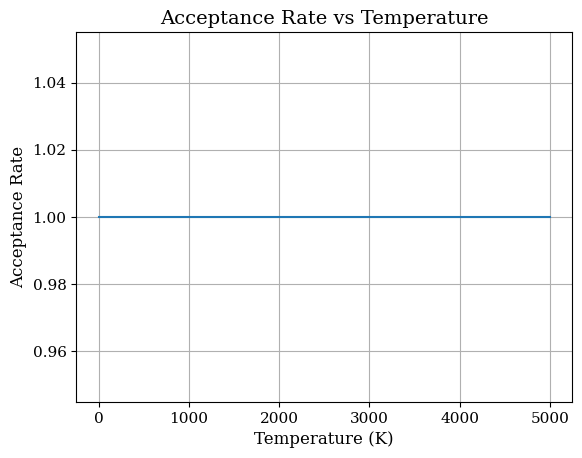

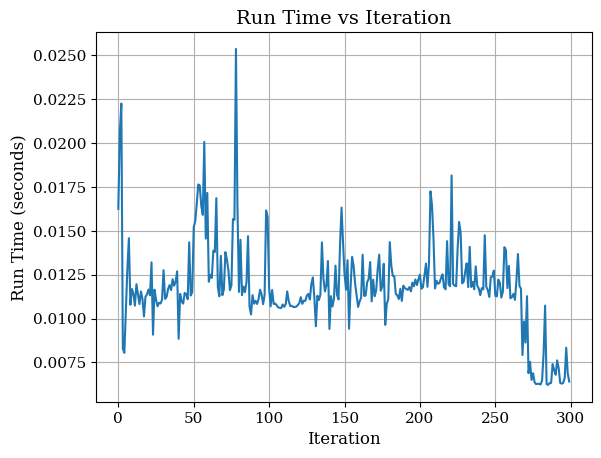

In [ ]:
main(f_uni, -32, 32, -200, SA_Exp_Lk_989)

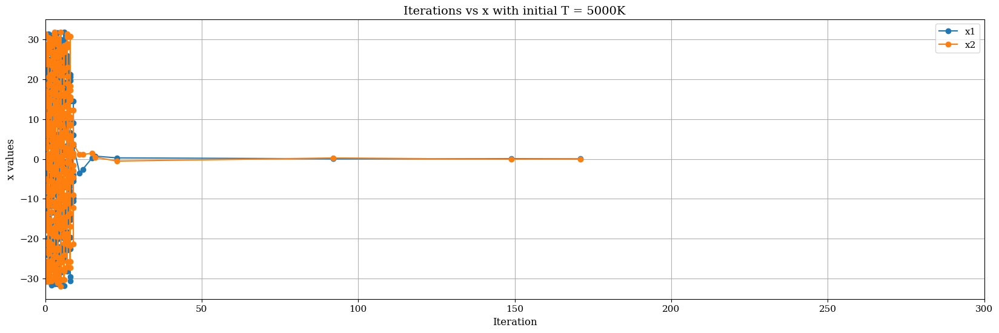

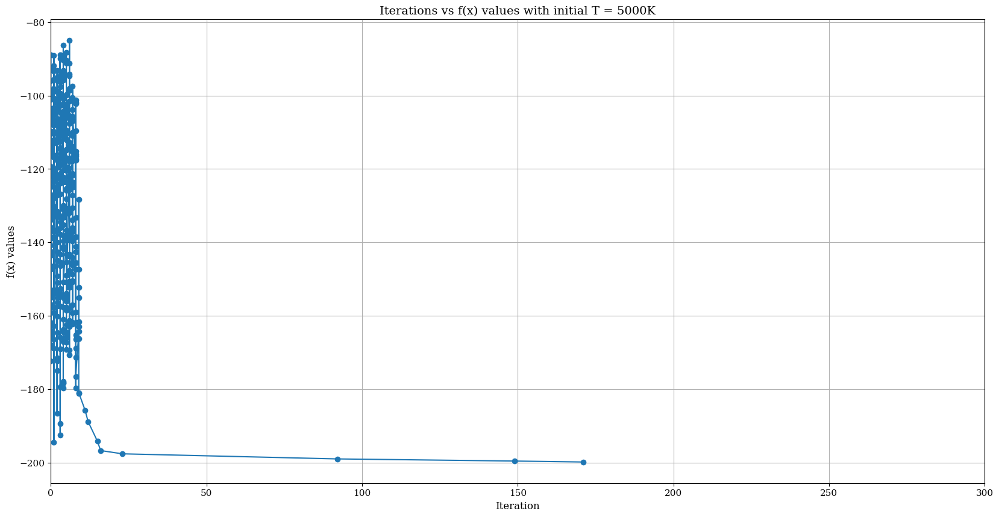

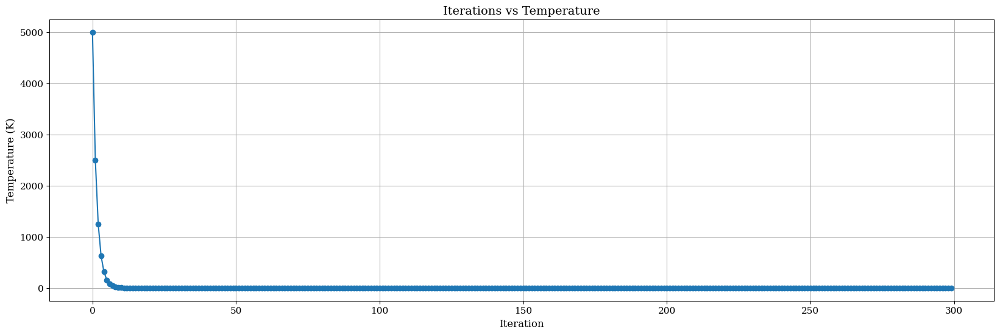

Optimal Solution = -199.86570446741908
Minimum points = (0.02005119973706826, -0.026942761145136274)
Error = 0.018035290071193325
Iteration that we gonna take specific temprature = 200


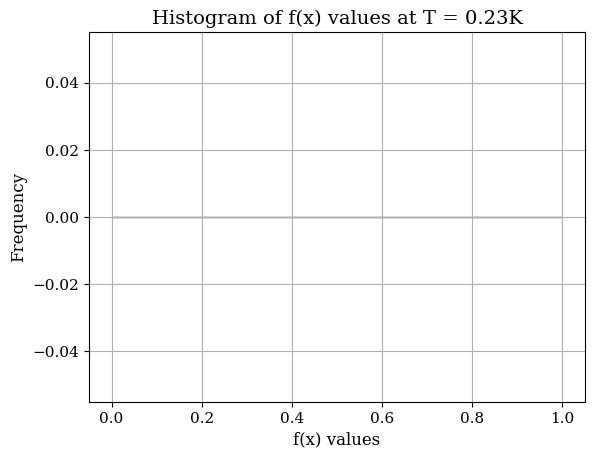

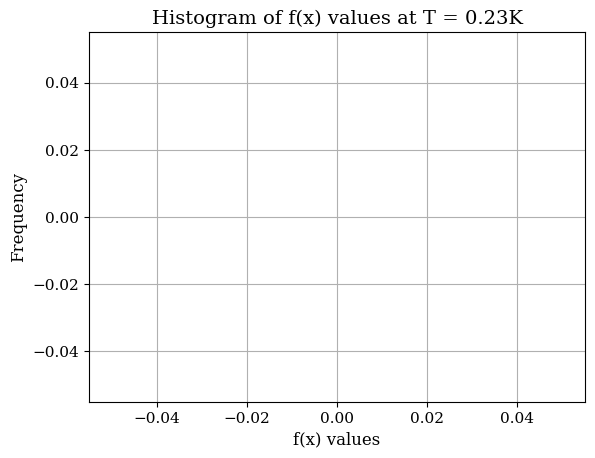

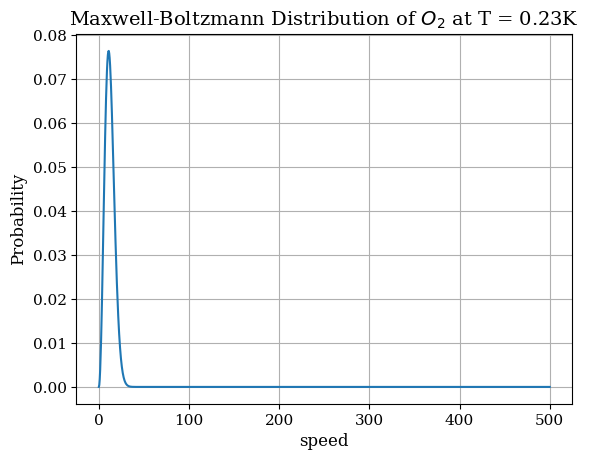

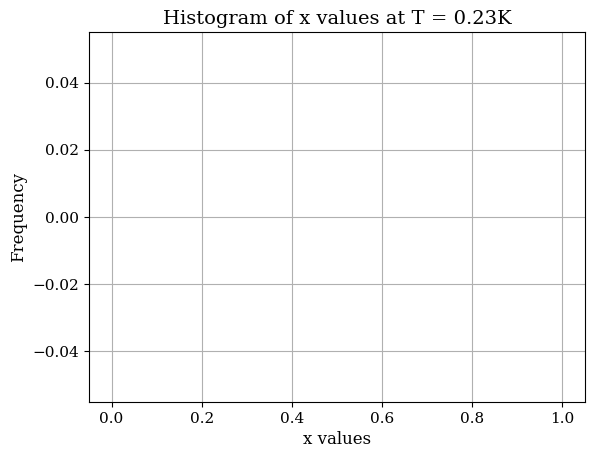

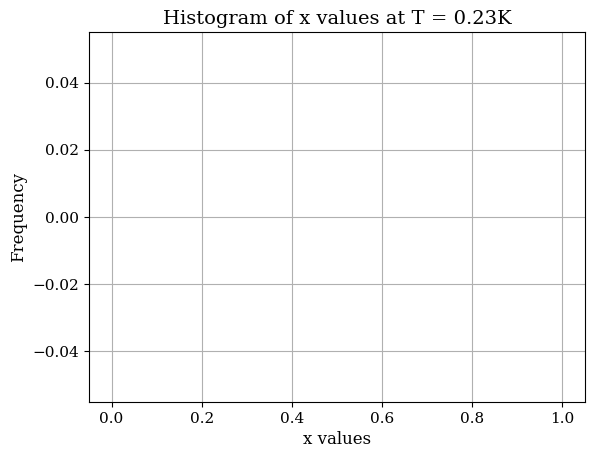

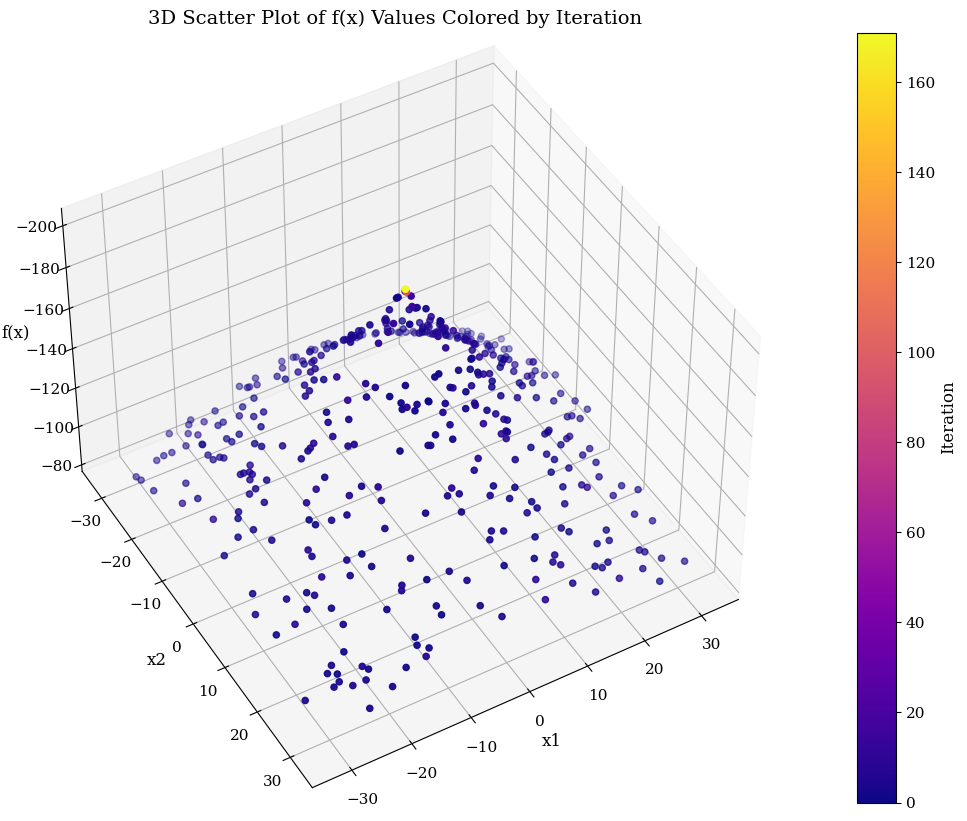

Minimum point: [0. 0.]
Function value at minimum point: -200.0


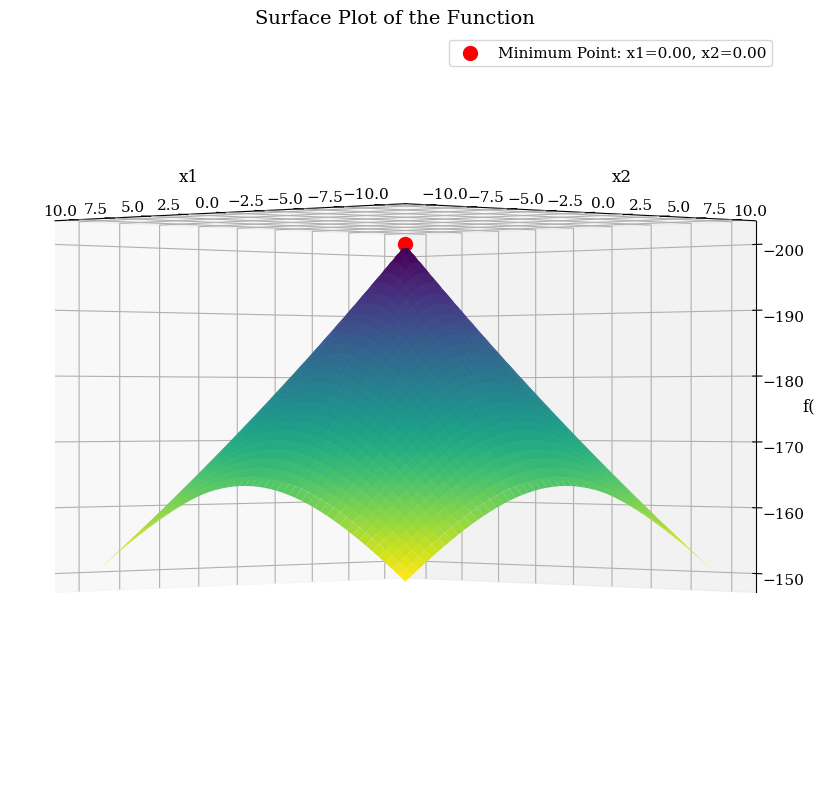

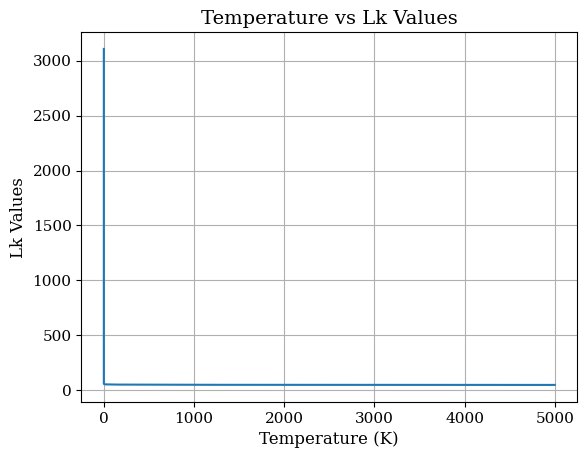

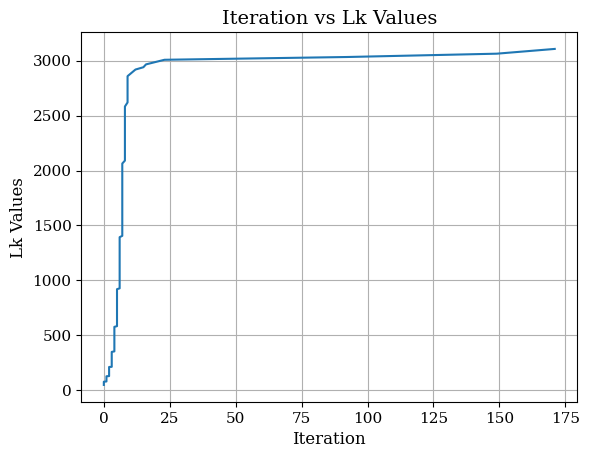

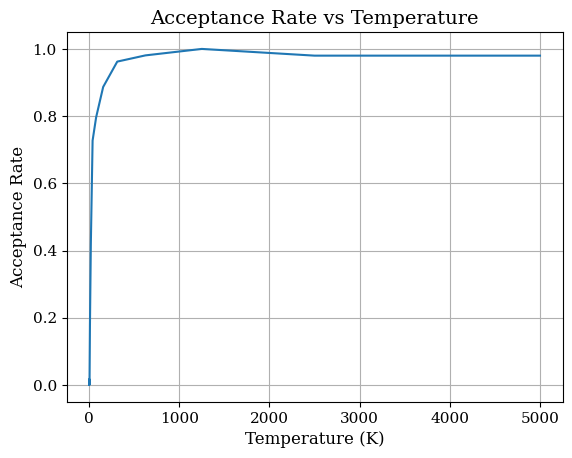

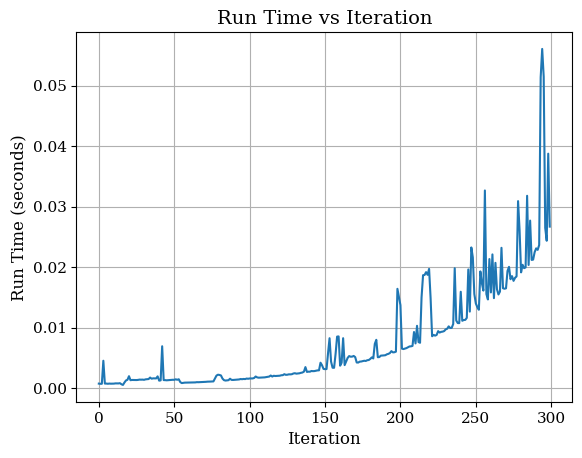

In [ ]:
main(f_uni, -32, 32, -200, SA_Linear_Lk_dynamic)

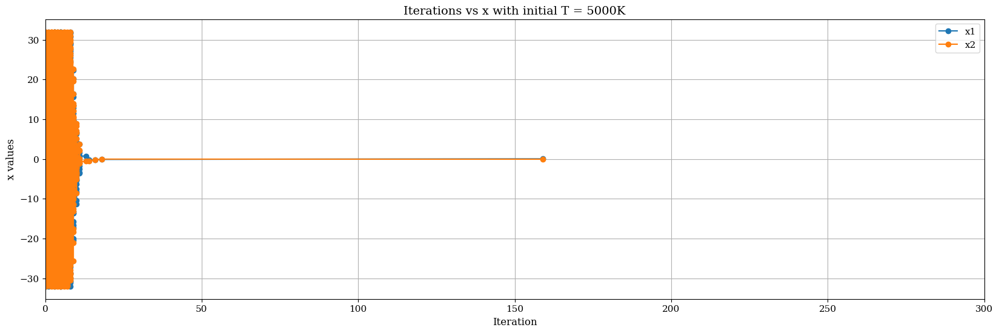

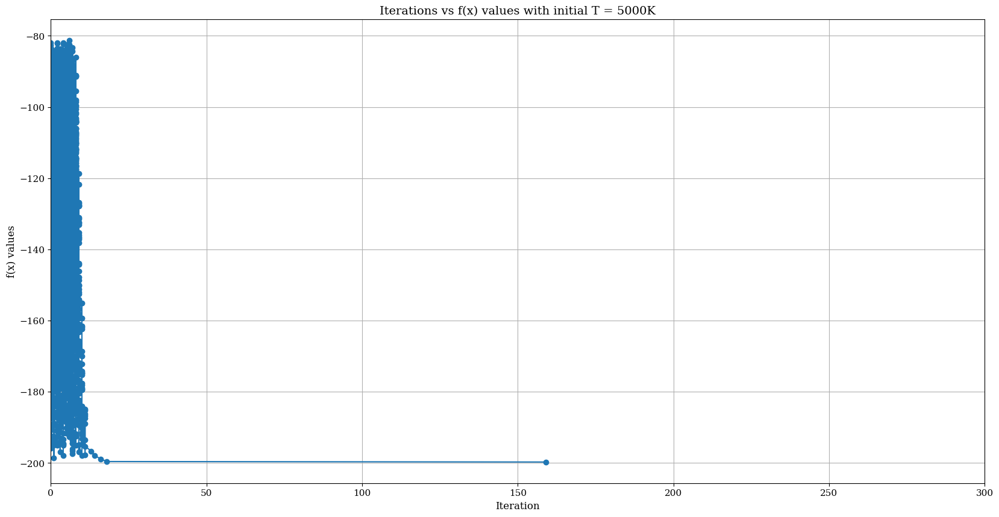

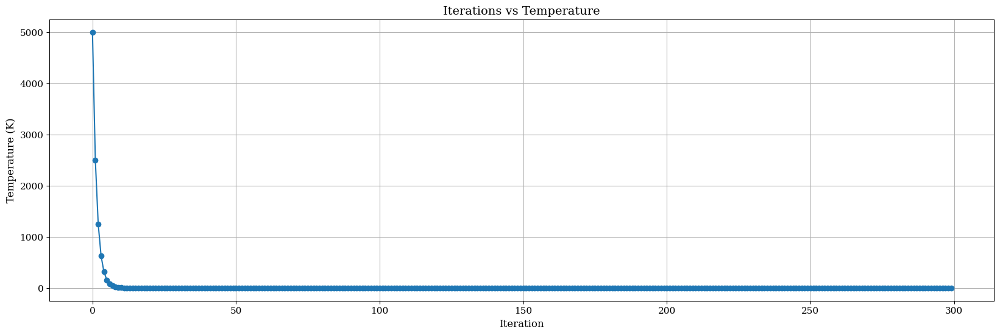

Optimal Solution = -199.7144268744974
Minimum points = (0.05986536559291977, -0.03899264030778227)
Error = 0.08155201000932052
Iteration that we gonna take specific temprature = 200


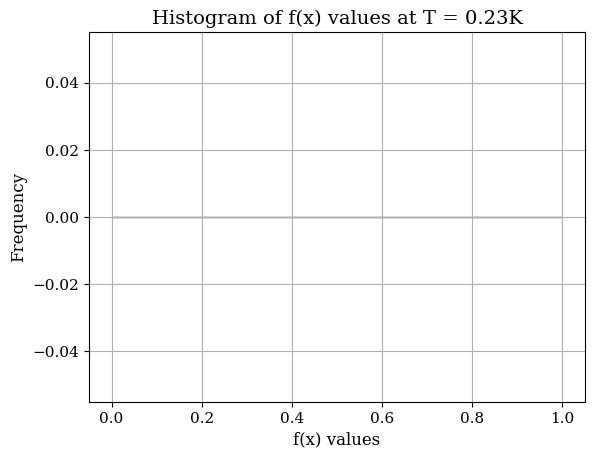

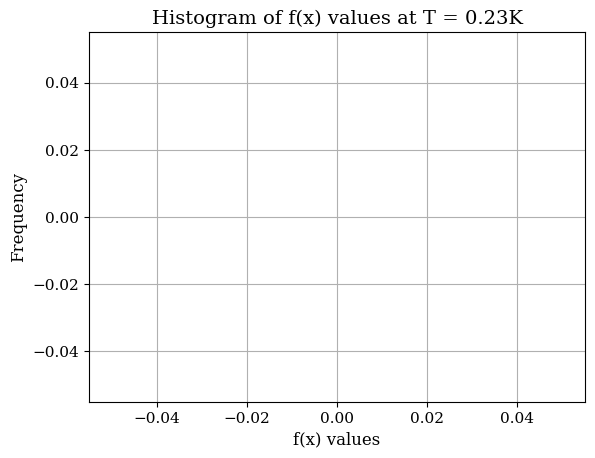

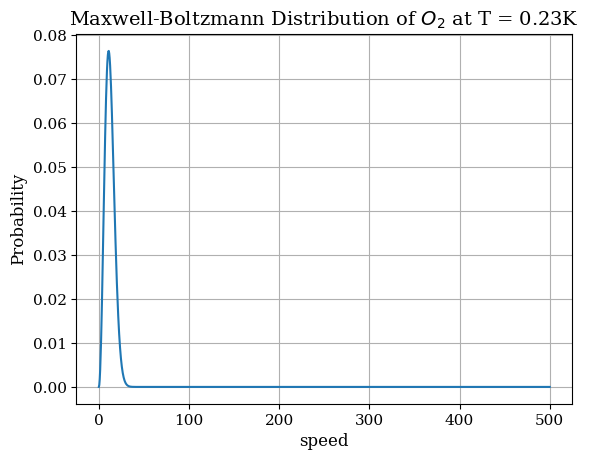

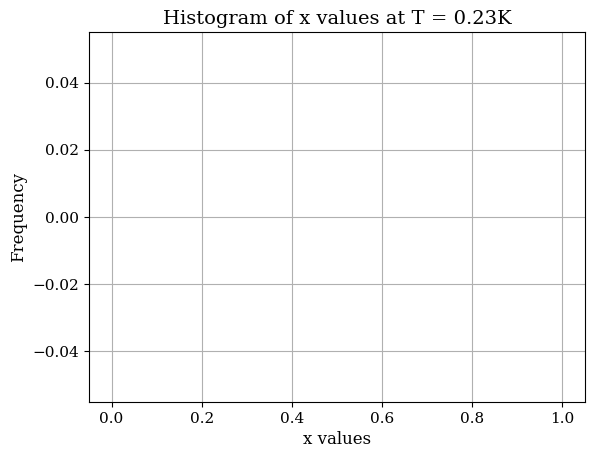

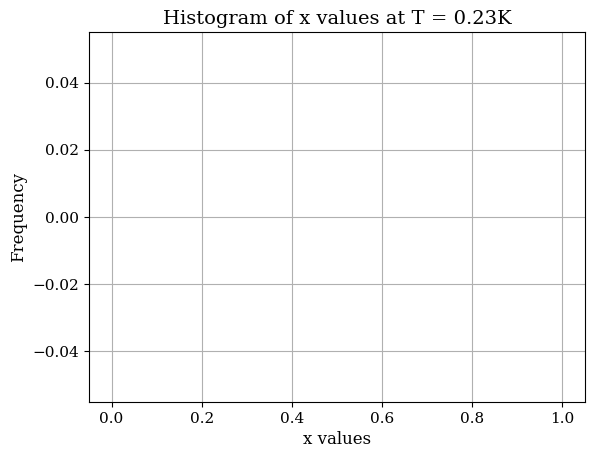

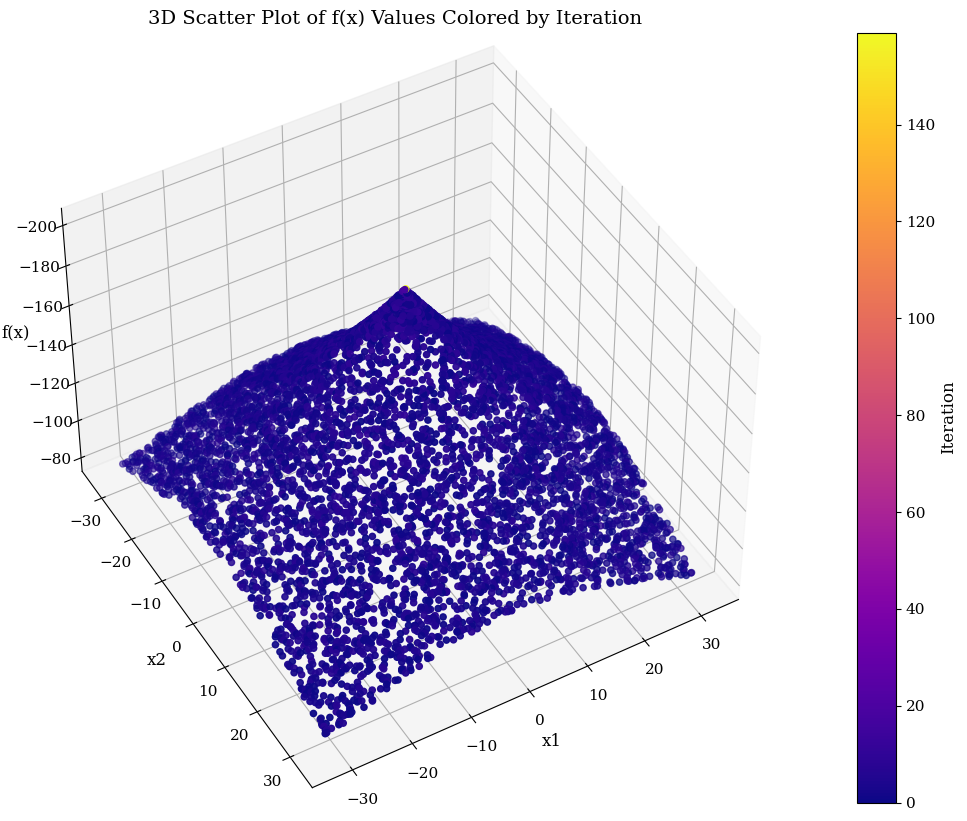

Minimum point: [0. 0.]
Function value at minimum point: -200.0


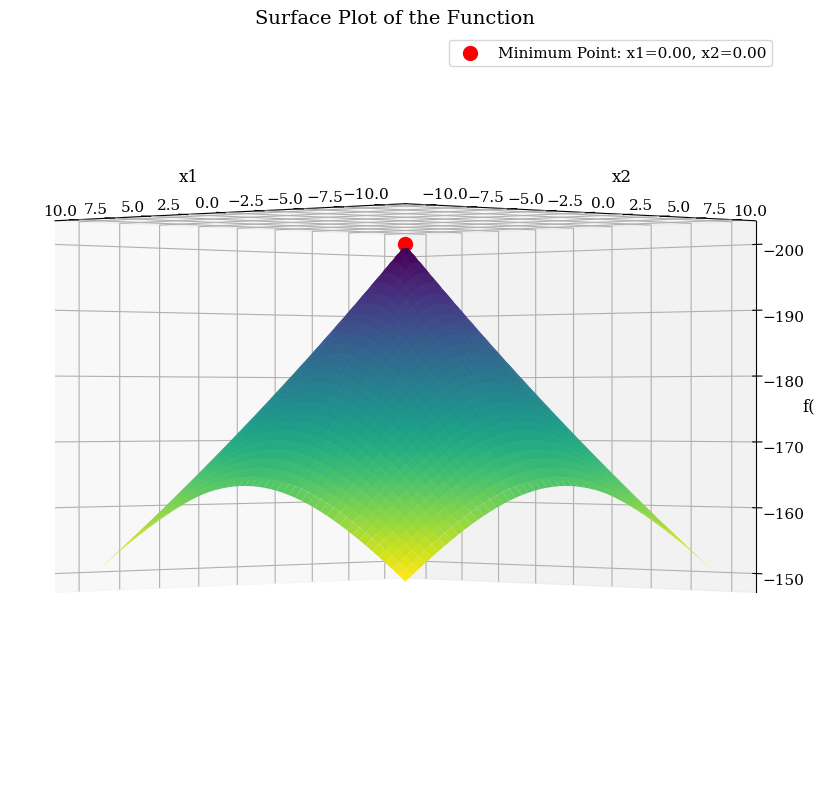

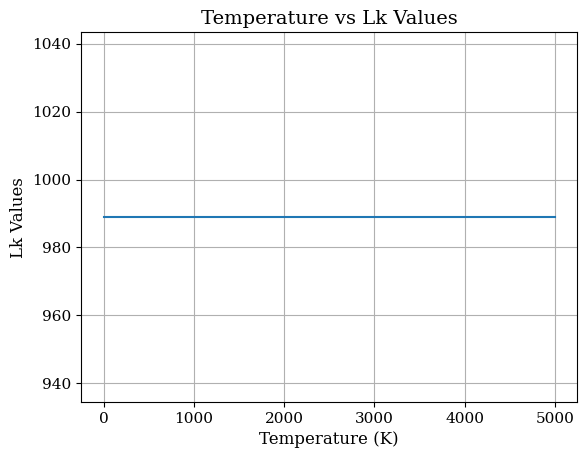

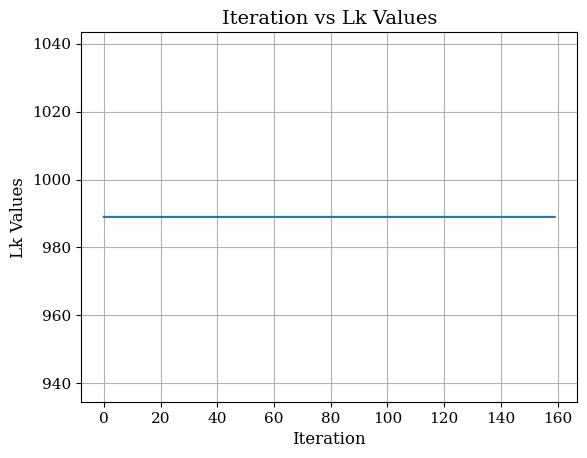

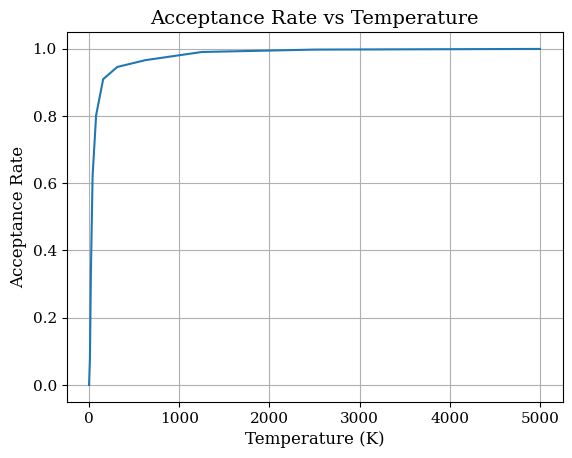

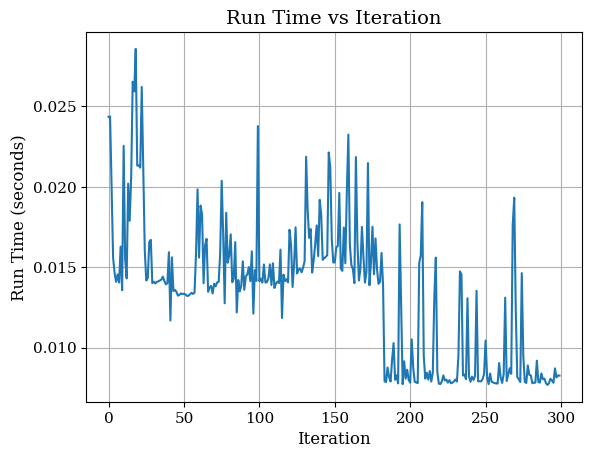

In [ ]:
main(f_uni, -32, 32, -200, SA_Linear_Lk_989)

# Not working

In [ ]:
def not_working_f(x):
     return x[0]**2 - x[0]*x[1] + x[1]**2  #Rotate Elipce 2 Funtion [66]

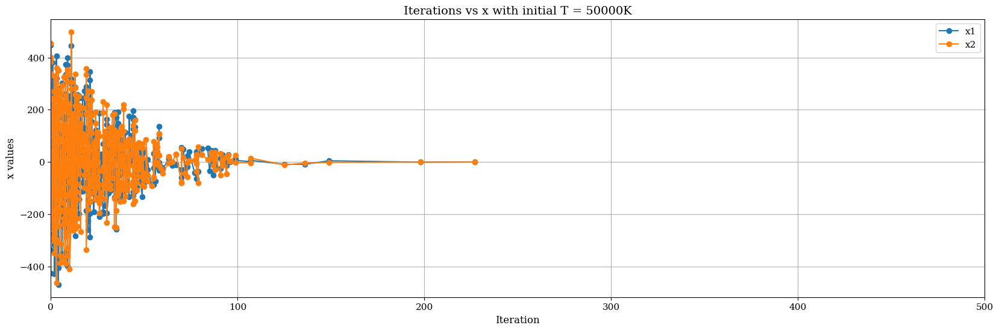

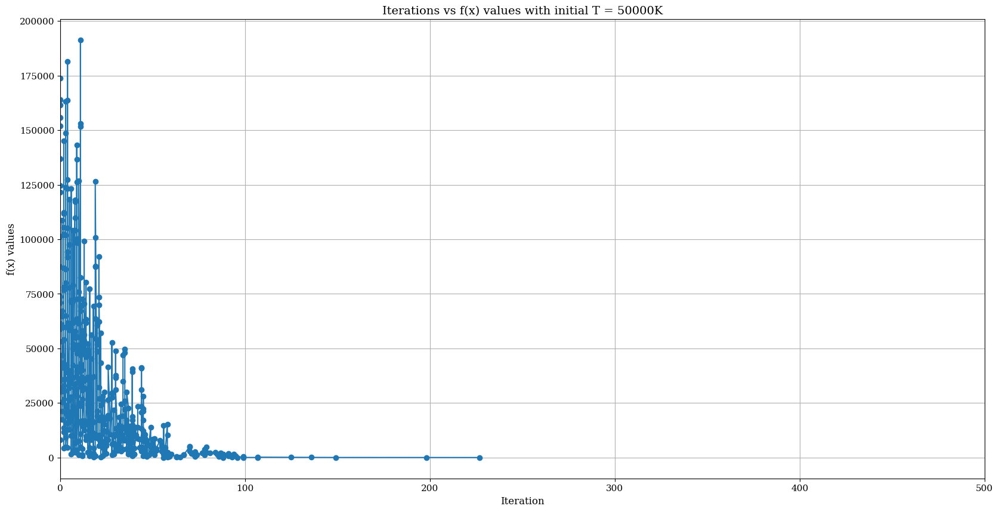

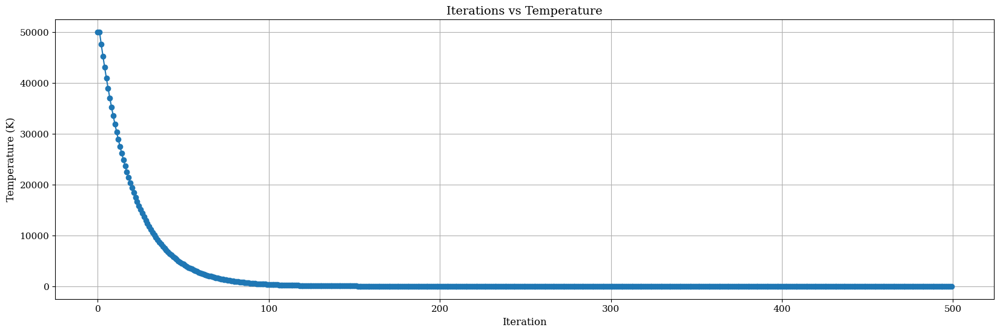

Optimal Solution = 0.0793967035514835
Minimum points = (0.04541752797729259, -0.25630671885380707)
Error = 0.0063038365348421525
Iteration that we gonna take specific temprature = 200


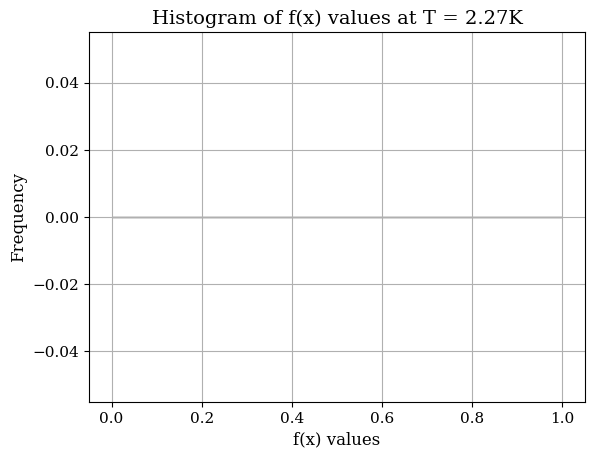

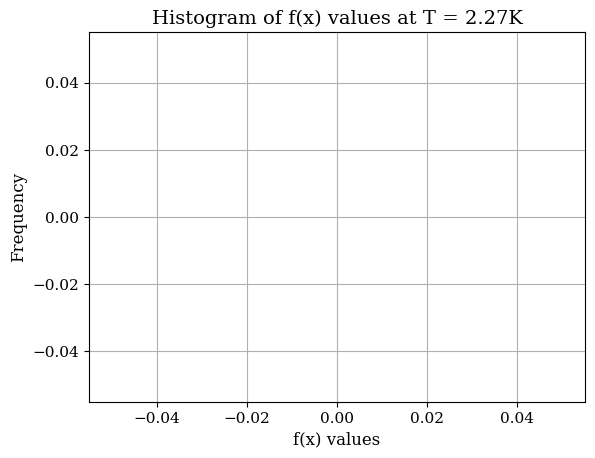

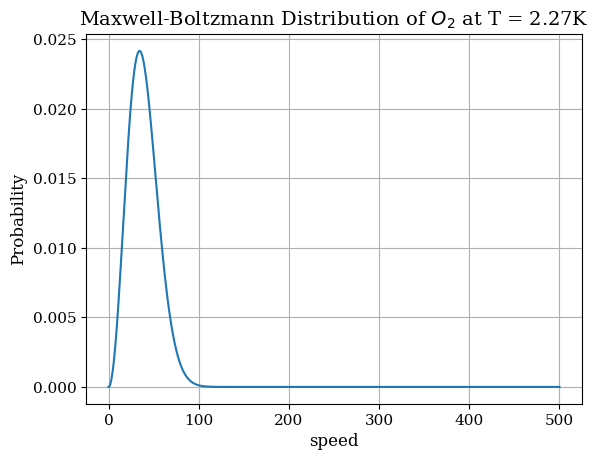

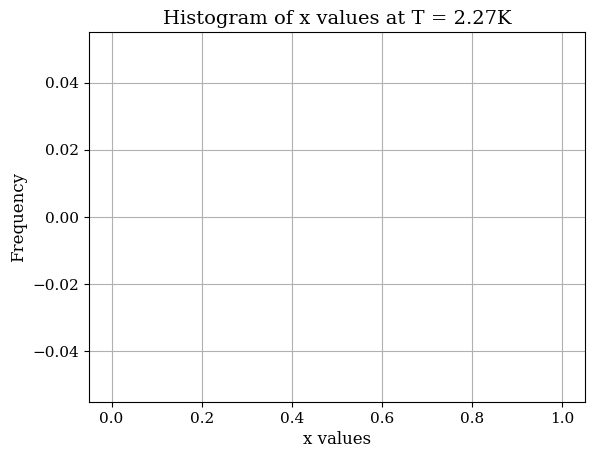

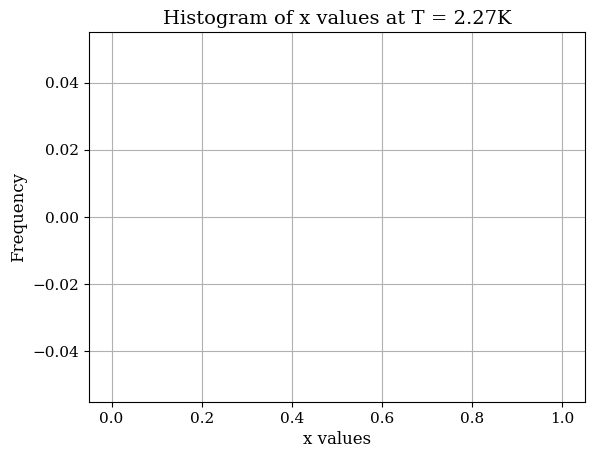

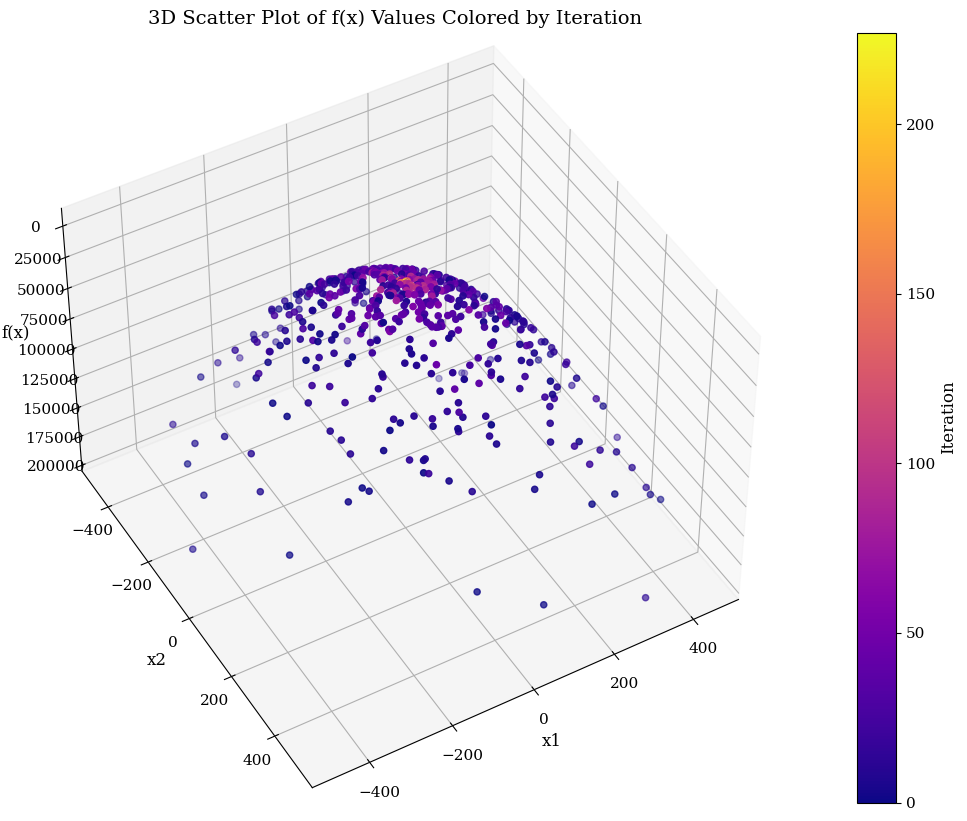

Minimum point: [0. 0.]
Function value at minimum point: 0.0


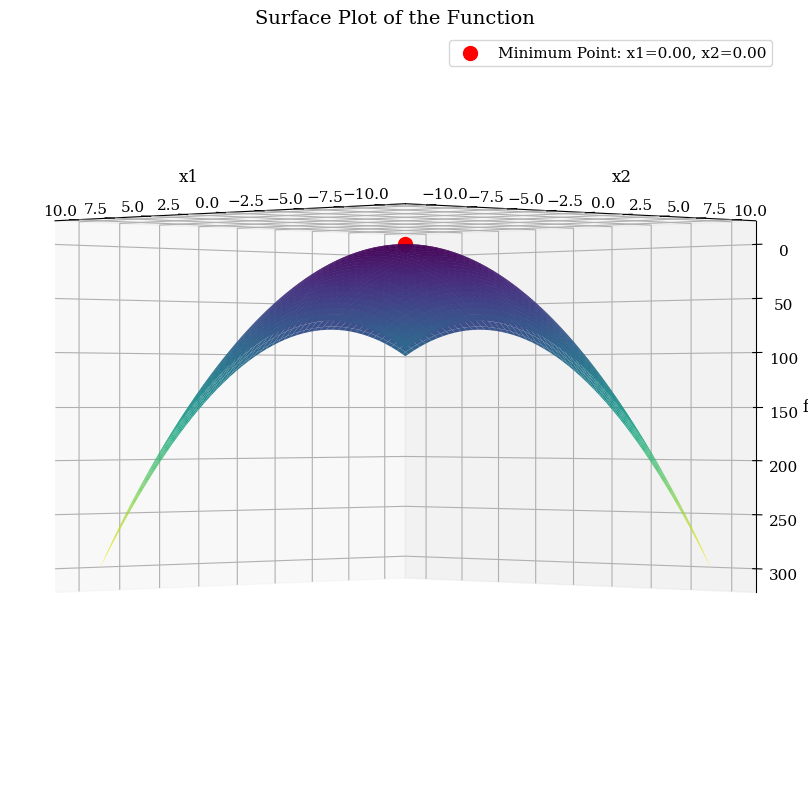

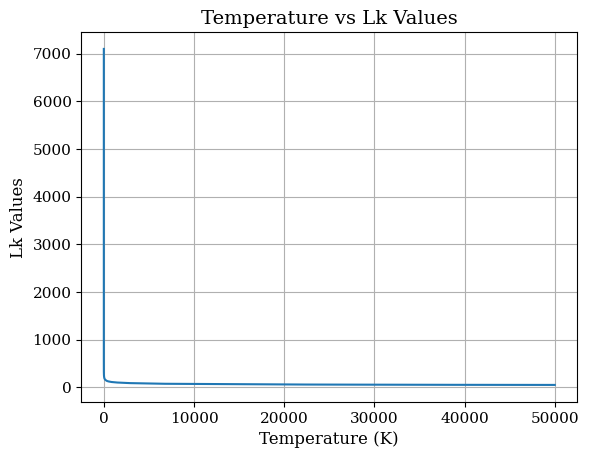

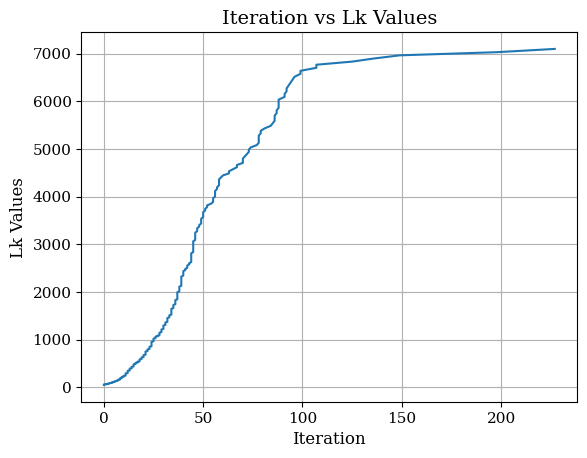

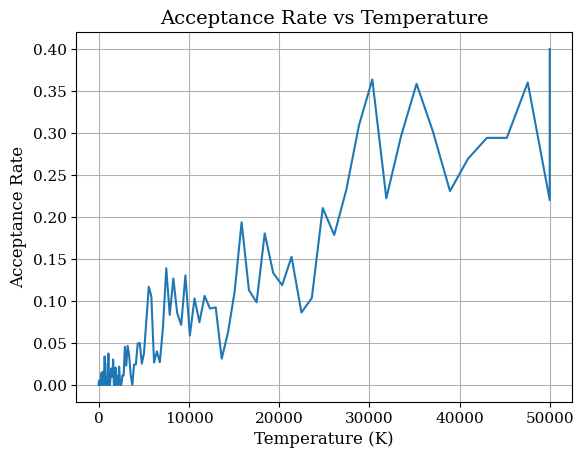

TypeError: plot_run_time_vs_iteration() missing 3 required positional arguments: 'no_of_iterations', 'modal', and 'cooling_sch'

In [ ]:
main(not_working_f, -500, 500, 0, SA_Exp_Lk_dynamic)

# Combined Plots

Run time vs iteration plot for Dynamic and Constant Lk for particular cooling schedule

In [ ]:
def plot_run_time_vs_iteration(run_times1, run_times2, no_of_iterations, modal, cooling_sch):
    plt.figure(figsize=(12, 6))
    plt.plot(range(no_of_iterations), run_times1[:no_of_iterations], label='Dynamic L_k')
    plt.plot(range(no_of_iterations), run_times2[:no_of_iterations], label='Constant L_k')
    plt.xlabel('Iteration')
    plt.ylabel('Run Time (seconds)')
    plt.title(f'Run Time vs Iteration ({modal} - {cooling_sch})')
    plt.legend()
    plt.ylim(0, max(max(run_times1), max(run_times2)) + 0.0025)
    #plt.yticks(np.arange(0, max(max(run_times1), max(run_times2)) + 0.0025, 0.0025))
    plt.tick_params(axis='both', which='major', labelsize=12)
    plt.show()

def main(f, a, b, optimal, SAfunc_exp_d, SAfunc_exp_c, modal, cooling_sch):
    temp = 5000
    no_of_iterations = 300


    accepted_states_x1_1, accepted_states_x2_1, iteration_1, temperature_1, f_x_values_1, inner_temp_1, Lk_values_1, acceptance_rates_1, run_times_1, best_fx_1 = SAfunc_exp_d(f, temp, no_of_iterations, a, b)
    accepted_states_x1_2, accepted_states_x2_2, iteration_2, temperature_2, f_x_values_2, inner_temp_2, Lk_values_2, acceptance_rates_2, run_times_2, = SAfunc_exp_c(f, temp, no_of_iterations, a, b)

    plot_run_time_vs_iteration(run_times_1, run_times_2, no_of_iterations, modal, cooling_sch)

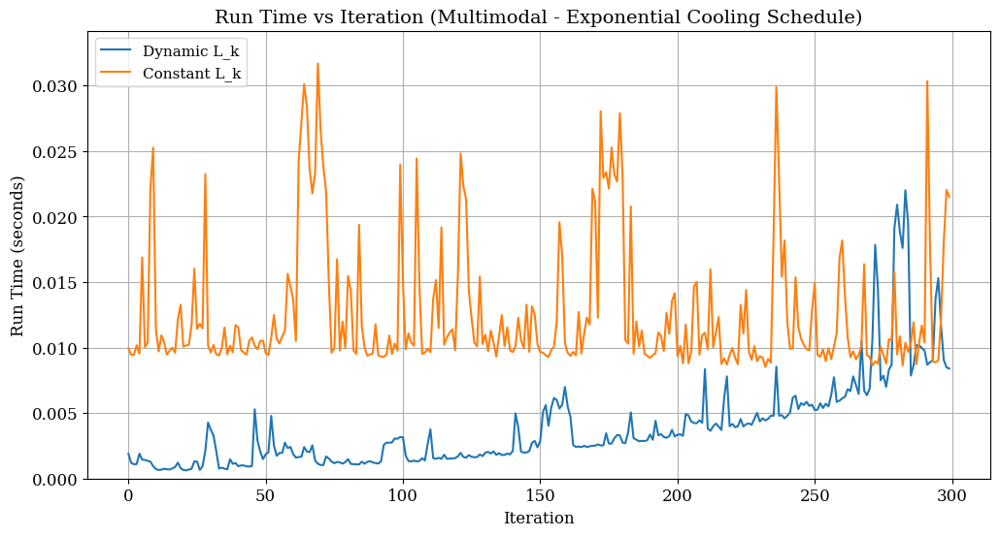

In [ ]:
main(f_multi, -10, 10, 0.9, SA_Exp_Lk_dynamic, SA_Exp_Lk_989, "Multimodal", "Exponential Cooling Schedule")

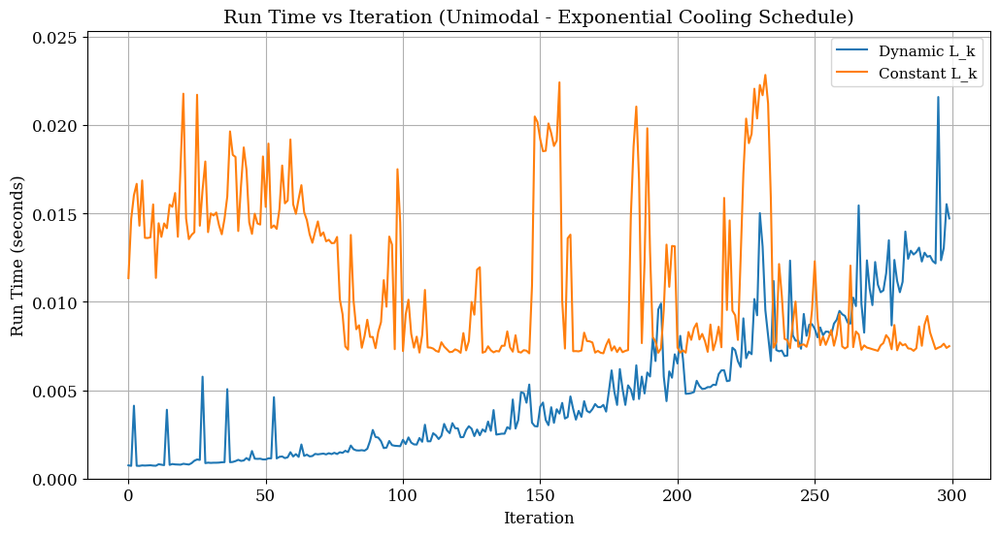

In [ ]:
main(f_uni, -10, 10, 0.9, SA_Exp_Lk_dynamic, SA_Exp_Lk_989, "Unimodal", "Exponential Cooling Schedule")

In [ ]:
def plot_acceptance_rate_vs_Temp(acceptance_rates_1, acceptance_rates_2, temperature_1, temperature_2, modal):
    plt.figure(figsize=(20, 6))
    plt.plot(temperature_1, acceptance_rates_1, label='Exponential')
    plt.plot(temperature_2, acceptance_rates_2, label='Linear')
    plt.xlabel('Temperature')
    plt.ylabel('Acceptance Rate')
    plt.title(f'Acceptance Rate vs Temperature ({modal})')
    #plt.xlim(0,500)
    plt.legend()
    #plt.colorbar(scatter, label='Iteration')
    plt.show()


def plot_acceptance_rate_vs_itera(acceptance_rates_1, acceptance_rates_2, modal):
    iterations = range(1, 301)
    plt.figure(figsize=(10, 6))
    plt.plot(iterations, acceptance_rates_1, label='Exponential')
    plt.plot(iterations, acceptance_rates_2, label='Linear')
    plt.xlabel('Iteration')
    plt.ylabel('Acceptance Rate')
    plt.title(f'Acceptance Rate vs Iteration ({modal})')
    plt.legend()
    #plt.colorbar(scatter, label='Iteration')
    plt.show()

def plot_temp_vs_iter(temperature_1, temperature_2):
    iterations = range(1, 301)
    plt.figure(figsize=(8, 6))
    plt.plot(iterations, temperature_1, label='Exponential')
    plt.plot(iterations, temperature_2, label='Linear')
    plt.xlabel('Iteration')
    plt.xlabel('Temperature')
    plt.title(f'Temperature vs Iteration')
    plt.legend()
    plt.show()

def plot_fx_vs_iter(best_fx1, best_fx2):
    iterations = range(1, 301)
    plt.figure(figsize=(20, 6))
    plt.plot(iterations, best_fx1, label='Exponential')
    plt.plot(iterations, best_fx2, label='Linear')
    plt.xlabel('Iteration')
    plt.ylabel('f(x)')
    plt.title(f'f(x) vs Iteration')
    plt.legend()
    plt.show()

def main(f, a, b, optimal, SAfunc_exp_d, SAfunc_linear_d, modal, cooling_sch):
    temp = 5000
    no_of_iterations = 300

    accepted_states_x1_1, accepted_states_x2_1, iteration_1, temperature_1, f_x_values_1, inner_temp_1, Lk_values_1, acceptance_rates_1, run_times_1, best_fx_1 = SAfunc_exp_d(f, temp, no_of_iterations, a, b)
    accepted_states_x1_2, accepted_states_x2_2, iteration_2, temperature_2, f_x_values_2, inner_temp_2, Lk_values_2, acceptance_rates_2, run_times_2, best_fx_2 = SAfunc_linear_d(f, temp, no_of_iterations, a, b)

    plot_acceptance_rate_vs_Temp(acceptance_rates_1, acceptance_rates_2, temperature_1, temperature_2, modal)

    plot_acceptance_rate_vs_itera(acceptance_rates_1, acceptance_rates_2, modal)
    plot_temp_vs_iter(temperature_1, temperature_2)
    plot_fx_vs_iter(best_fx_1, best_fx_2)


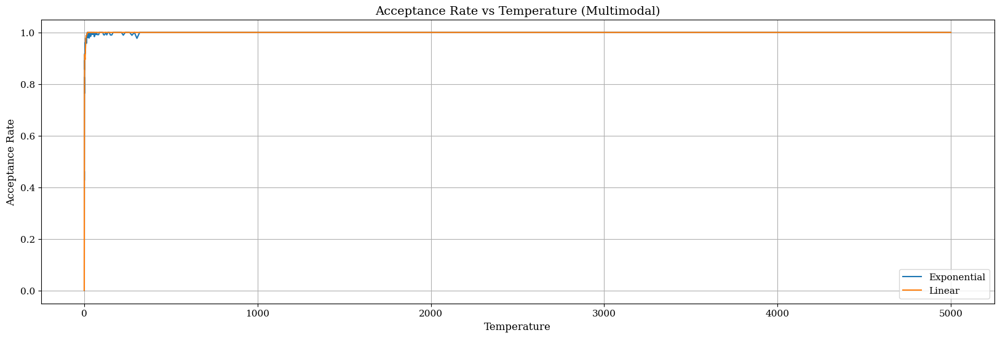

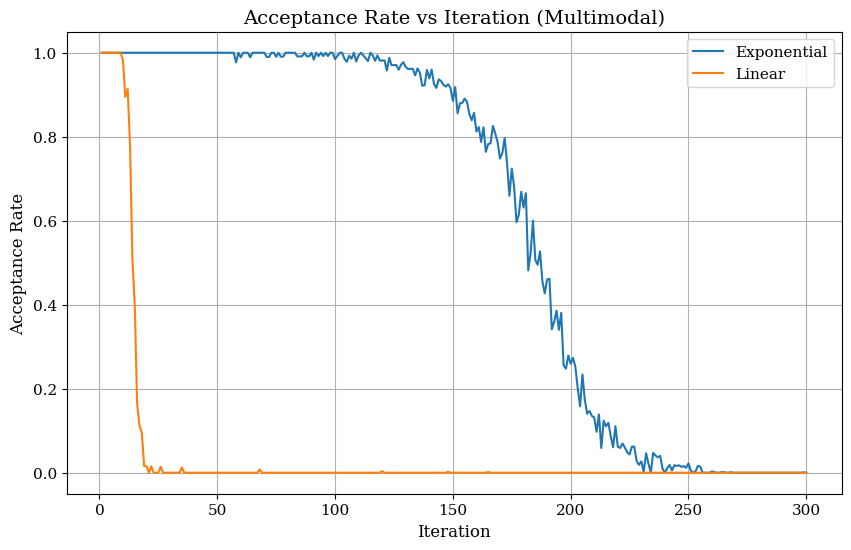

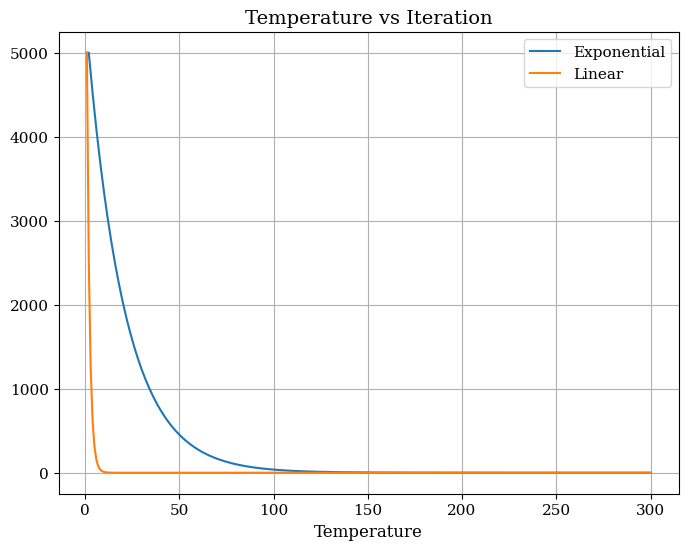

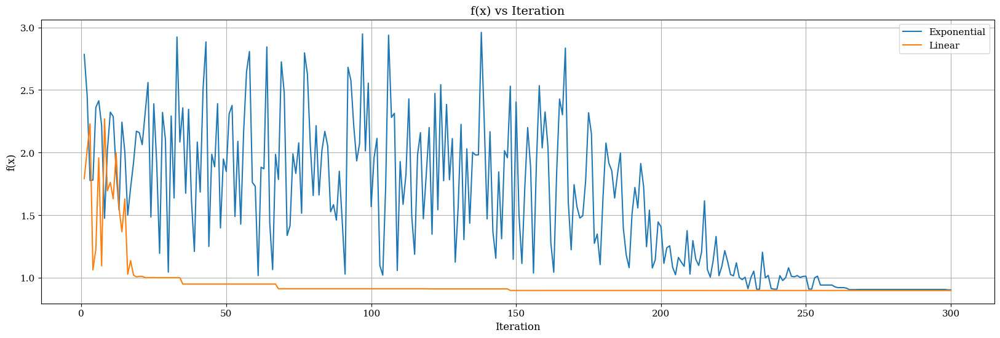

In [ ]:
main(f_multi, -10, 10, 0.9, SA_Exp_Lk_dynamic, SA_Linear_Lk_dynamic, "Multimodal", "Exponential Cooling Schedule")